# Animacy perception: from RDM to results reported in paper
OSF: https://osf.io/7xcg9/

## Purpose
The purpose of this notebook is to reproduce the findings reported in the paper. This notebook starts from the obtained Representational Dissimilarities Matrices. 

## Downloads
A pickle file with all RDMs can be found here: https://osf.io/cyqkw

All csv files for conducting ARTool ANOVA (input): https://osf.io/7xcg9/

And all csv files with the results from ARTool (output): https://osf.io/7xcg9/

Both mat files in the Data > Bracci data folder on the OSF



# Setup

## Library import
We import all the required Python libraries

/opt/anaconda3/lib/python3.9/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.1, the latest is 0.5.3.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(
/opt/anaconda3/lib/python3.9/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.1, the latest is 0.2.2.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


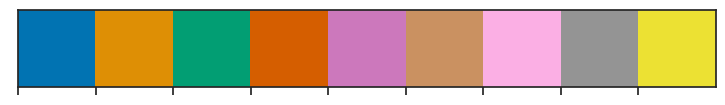

In [1]:
"""
>>> INSTALL THESE PACKAGES <<<
conda install -c conda-forge pingouin
conda install -c researchpy researchpy
conda install -c conda-forge altair_saver
conda install -c conda-forge vega-cli vega-lite-cli
conda install -c conda-forge matplotlib-venn
conda install -c bioconda bioinfokit
conda install -c conda-forge adjusttext
conda install -c conda-forge textwrap3
conda install -c mantel
"""
from IPython.core.debugger import set_trace
from scipy.stats import bootstrap, pearsonr
import pickle
import numpy.ma as ma #for correlating and ignoring NaNs
import scipy.io as sio
import pandas as pd
import numpy as np
import pingouin as pg
import matplotlib.pyplot as plt
import os
import math
from scipy import stats
import sys
from mlxtend.evaluate import permutation_test 
# http://rasbt.github.io/mlxtend/user_guide/evaluate/permutation_test/

import matplotlib.style as style
style.use('seaborn-colorblind')
fontsize = 42
#plt.setp(ax.get_yticklabels(), fontsize=fontsize)
#plt.rcParams["font.family"] = "Calibri"
plt.rc('font', size=fontsize)          # controls default text sizes
plt.rc('axes', titlesize=fontsize)     # fontsize of the axes title
plt.rc('axes', labelsize=fontsize)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=fontsize)    # fontsize of the tick labels
plt.rc('ytick', labelsize=fontsize)    # fontsize of the tick labels
plt.rc('legend', fontsize=fontsize)    # legend fontsize
plt.rc('figure', titlesize=fontsize)


import patsy
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.stats.anova import AnovaRM
from statsmodels.regression.mixed_linear_model import MixedLMResults

import dataframe_image as dfi
import mantel
# we will use bioinfokit (v1.0.3 or later) for performing tukey HSD test
# check documentation here https://github.com/reneshbedre/bioinfokit
from bioinfokit.analys import stat

import seaborn as sns 
#http://seaborn.pydata.org/tutorial/aesthetics.html
sns.set()
sns.set(font_scale = 1.25)
#sns.set_context("paper") #talk
sns.set(font="Arial")
sns.set_style(style='white') #get rid of grey background and lines
sns.set_style("ticks") #tickmarks
colors = sns.color_palette("colorblind", 9) #we need 8 different colors in the summary plot, one for each model
markers = ["^", "*", "p", "D", "s", "P", "X", "<", ","] #9 different markers
#from matplotlib import markers
# get all possible shapes
#all_shapes = markers.MarkerStyle.markers.keys()
# ['.', ',', 'o', 'v', '^', '<', '>', '1', '2', '3', '4', '8', 's', 'p', '*', 'h', 'H', '+', 'x', 'D', 'd', '|', '_', 'P', 'X',
# 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 'None', None, ' ', '']

sns.palplot(colors)
colors2 = colors.as_hex()
linestyles = ['-', '--','-.',':']
#colors2 = colors2[1:]
#print(colors[0])
#sns.set_palette(sns.color_palette(colors))

import altair as alt
from altair_saver import save
import selenium.webdriver as webdriver

import PIL
from PIL import Image
from matplotlib import image
from matplotlib import pyplot

## Set dirs

In [2]:
pkl_file = '/Users/duyckstefanie/Documents/Study4_forsharing/OSF_modeltesting/OSF-data/DNN_data.pkl'

## Load file
stage: TL = tranfer learning/finetuning; PT = pretrained

condition: appearance = animal bias, animacy = object bias, animacynoll = animacy training without zoomorphic objects, SIN = stylized ImageNet, IN = ImageNet, recurrent and face-body-object

test_set: stefaniea = full test set with 33 items; stefania = 9 test items from Bracci study

matrix = RDM

mean = the mean of the RDM

normalized_matrix: RDM/mean

In [3]:
file = open(pkl_file, 'rb')
data = pickle.load(file)
data


,filename,filenameshort,stage,extraction_layer,condition,dnn_model,test_set,number_test_items,matrix,mean,normalized_matrix
0,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_TL_appearance_FC7_stefaniea_vgg,TL,FC7,appearance,vgg,stefaniea,33,"[[nan, 0.1318251272899322, 0.275373376633373, ...",0.304016,"[[nan, 0.43361293576827337, 0.9057867853357165..."
2,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_PT_SIN_FC7_stefaniea_vgg16,PT,FC7,SIN,vgg,stefaniea,33,"[[nan, 0.2723646759986877, 0.9662261605262756,...",0.829536,"[[nan, 0.32833370776458665, 1.1647788637108776..."
3,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_TL_appearance_FC7_stefaniea_alexnet,TL,FC7,appearance,alexnet,stefaniea,33,"[[nan, 0.0639353264713409, 0.2877960004048572,...",0.229855,"[[nan, 0.2781549131555517, 1.252075744620019, ..."
4,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_PT_ECOSET_FC7_stefania_alexnet,PT,FC7,ECOSET,alexnet,stefania,9,"[[nan, 0.8023000326513537, 1.019519243890879, ...",0.866254,"[[nan, 0.9261713296338051, 1.1769281506585687,..."
5,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_TL_facebodyobject_FC8_stefania_alexnet,TL,FC8,facebodyobject,alexnet,stefania,9,"[[nan, 0.1402735710144043, 1.89717710018158, 1...",0.737774,"[[nan, 0.19013082664794373, 2.571488326322227,..."
6,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_PT_ECOSET_FC8_stefaniea_alexnet,PT,FC8,ECOSET,alexnet,stefaniea,33,"[[nan, 0.1814061555071821, 0.5637659533697232,...",0.622243,"[[nan, 0.2915357057628917, 0.9060216542333627,..."
7,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_TL_animacy_FC7_stefaniea_vgg,TL,FC7,animacy,vgg,stefaniea,33,"[[nan, 0.4042295619910725, 0.9647568337104228,...",0.815068,"[[nan, 0.49594553848303213, 1.1836513021040942..."
8,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_PT_ECOSET_FC8_stefania_alexnet,PT,FC8,ECOSET,alexnet,stefania,9,"[[nan, 0.6762586607029389, 0.6272799454966932,...",0.572061,"[[nan, 1.182145258746668, 1.0965271967164052, ..."
9,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_TL_facebodyobject_FC7_stefania_alexnet,TL,FC7,facebodyobject,alexnet,stefania,9,"[[nan, 0.2546306848526001, 0.5016688704490662,...",0.286440,"[[nan, 0.88894910361259, 1.7513917969242117, 1..."
10,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_PT_3cat_FC8_stefaniea_alexnet,PT,FC8,IN,alexnet,stefaniea,33,"[[nan, 0.2091887900715007, 0.993350611666284, ...",0.653737,"[[nan, 0.31998928935469717, 1.5194961269124552..."


## CREATE COLORPLOT RDM

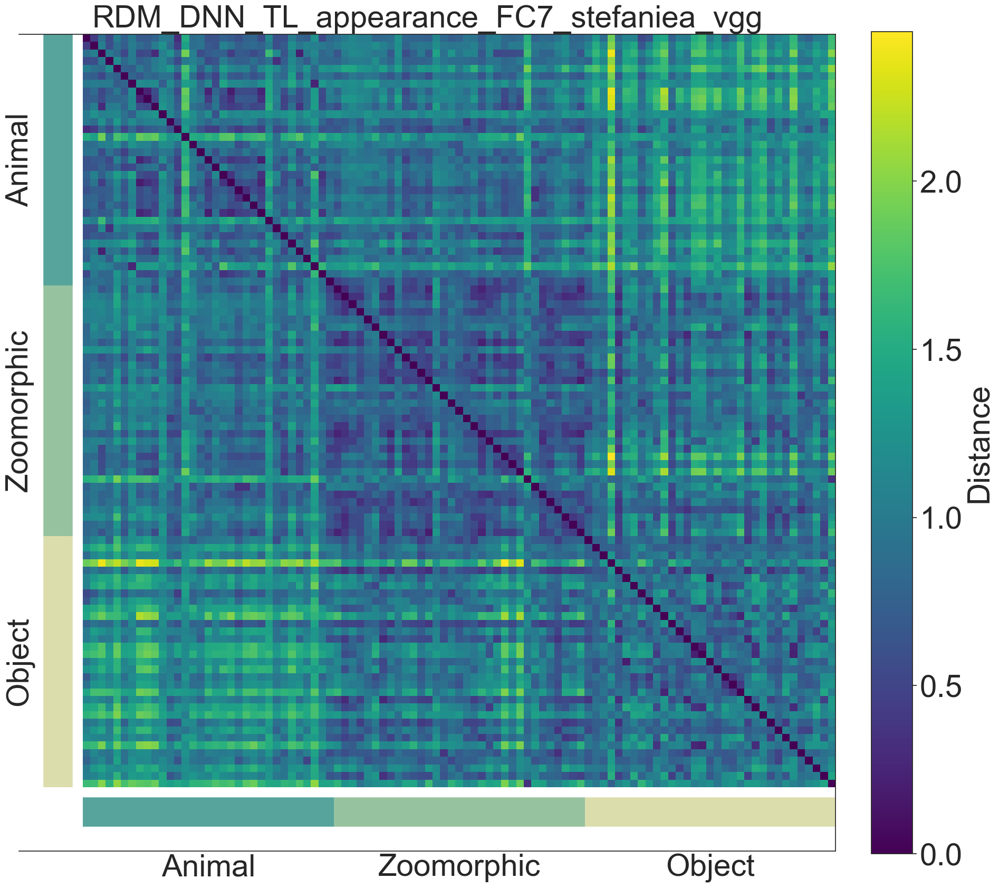

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

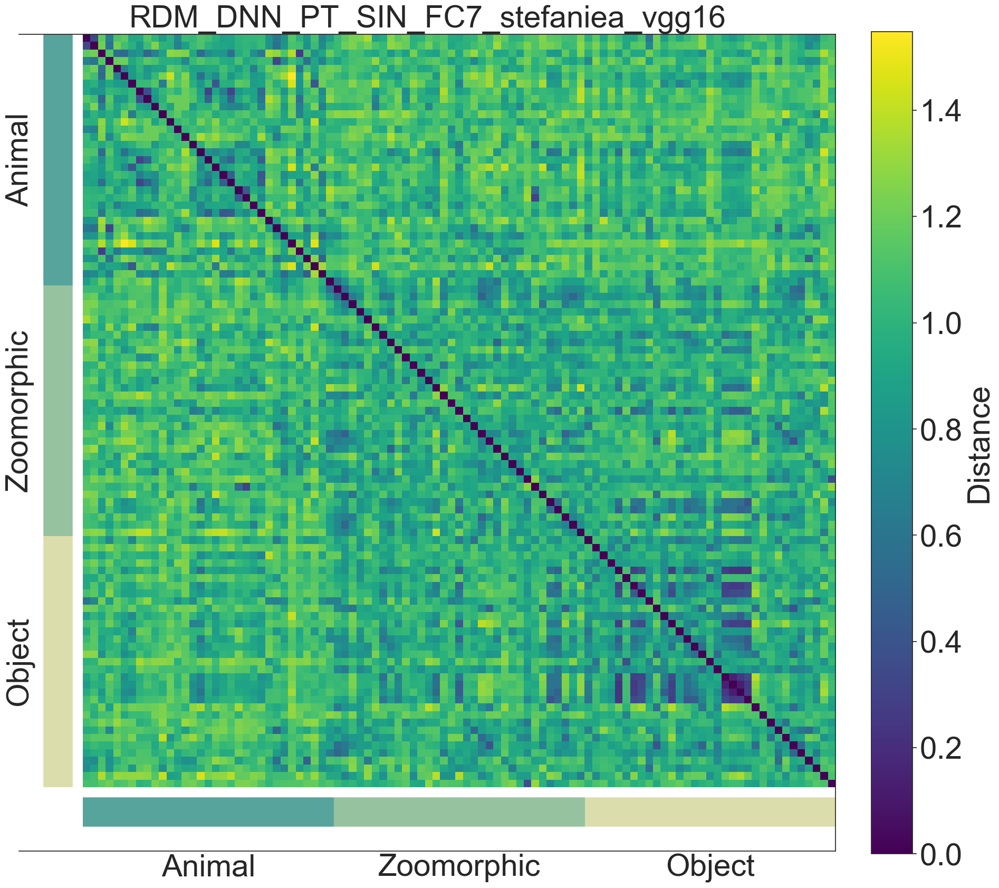

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

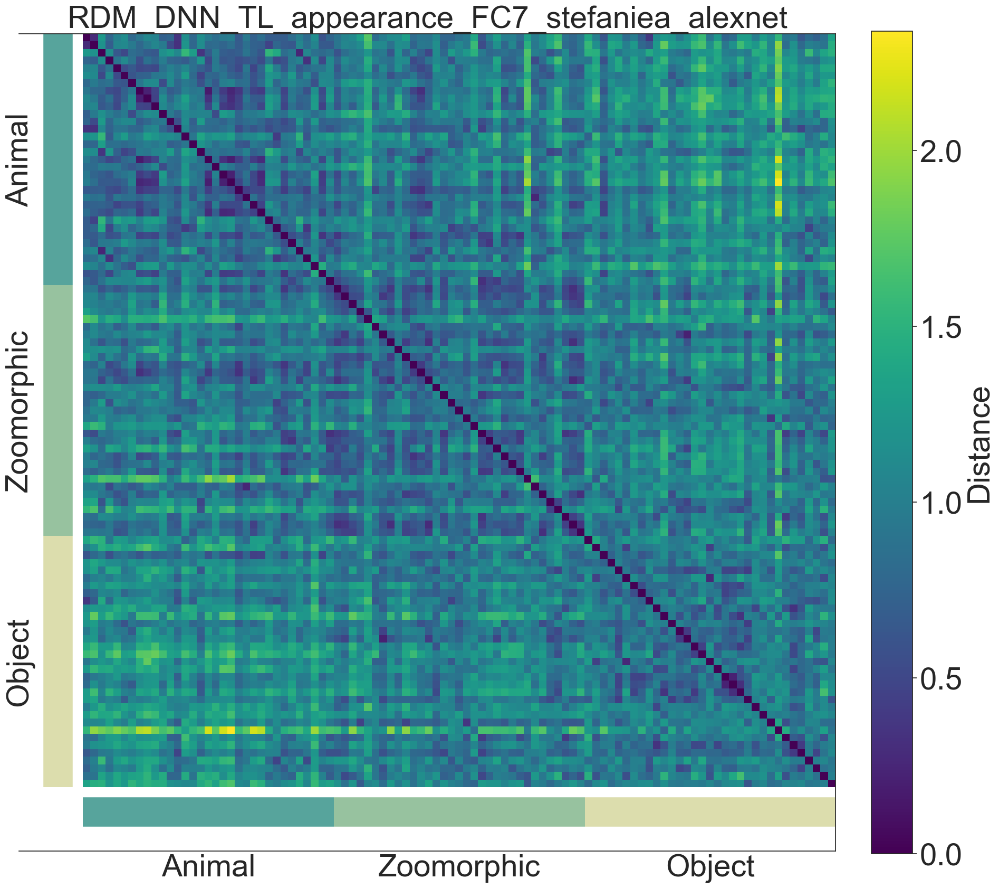

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

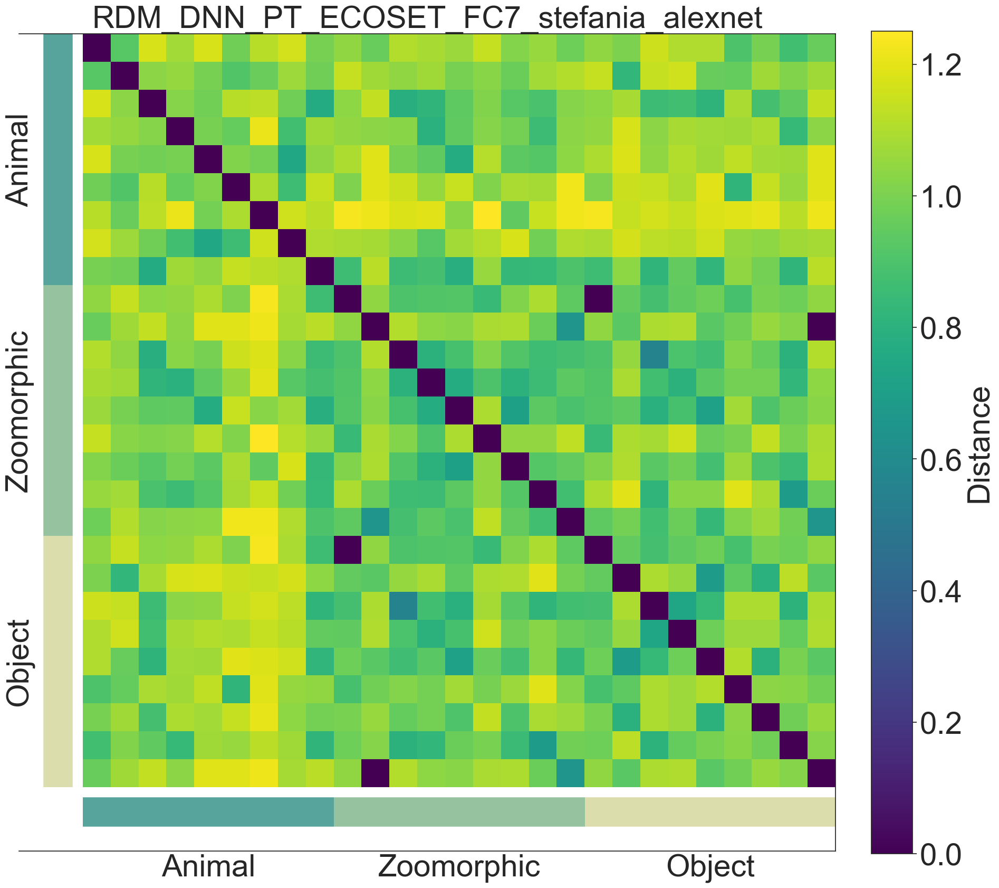

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

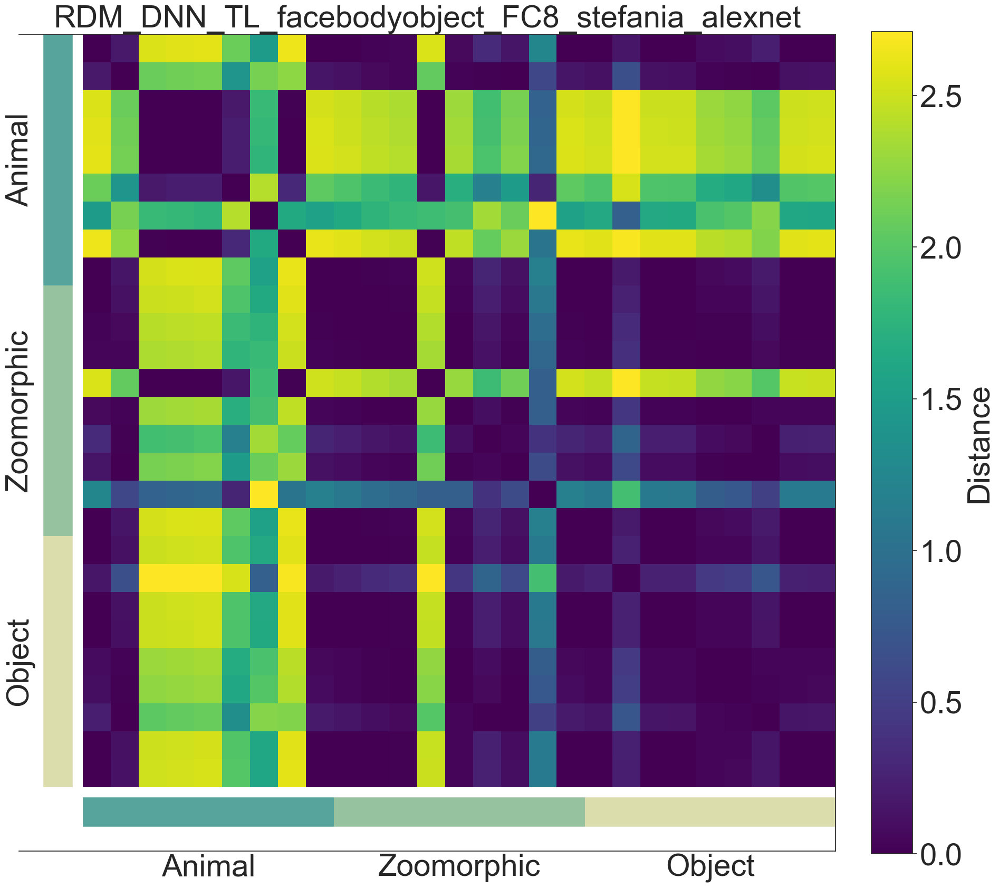

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

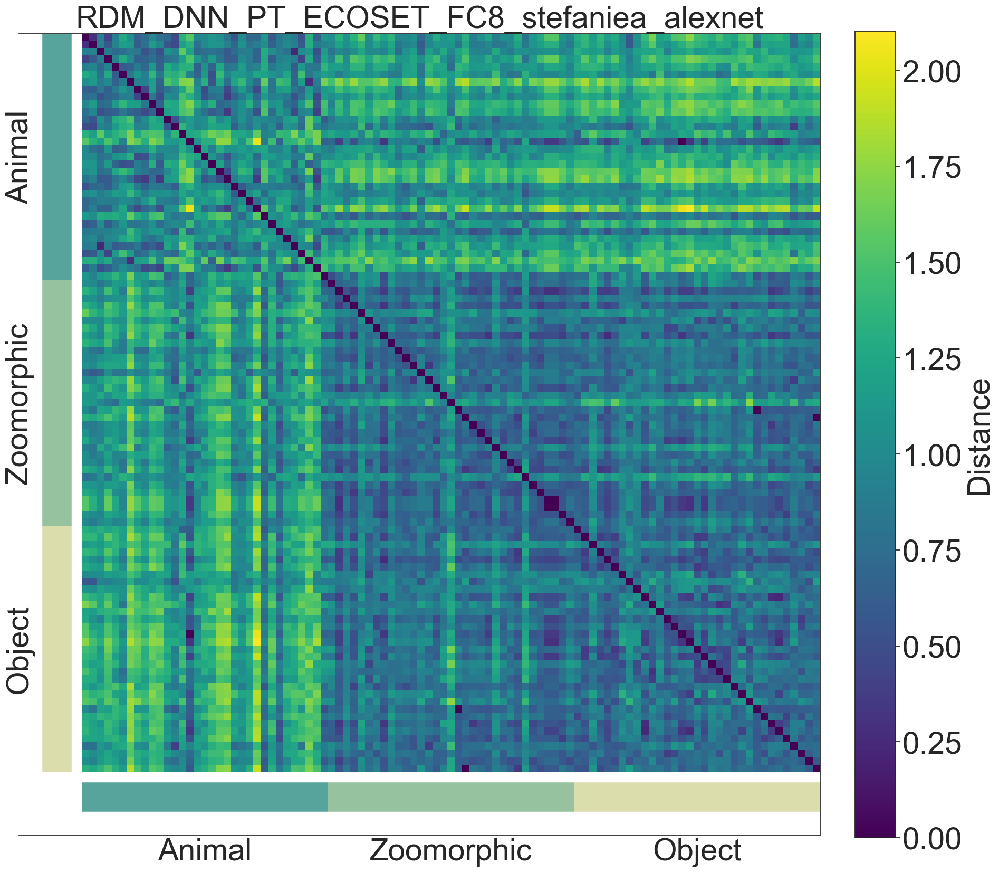

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

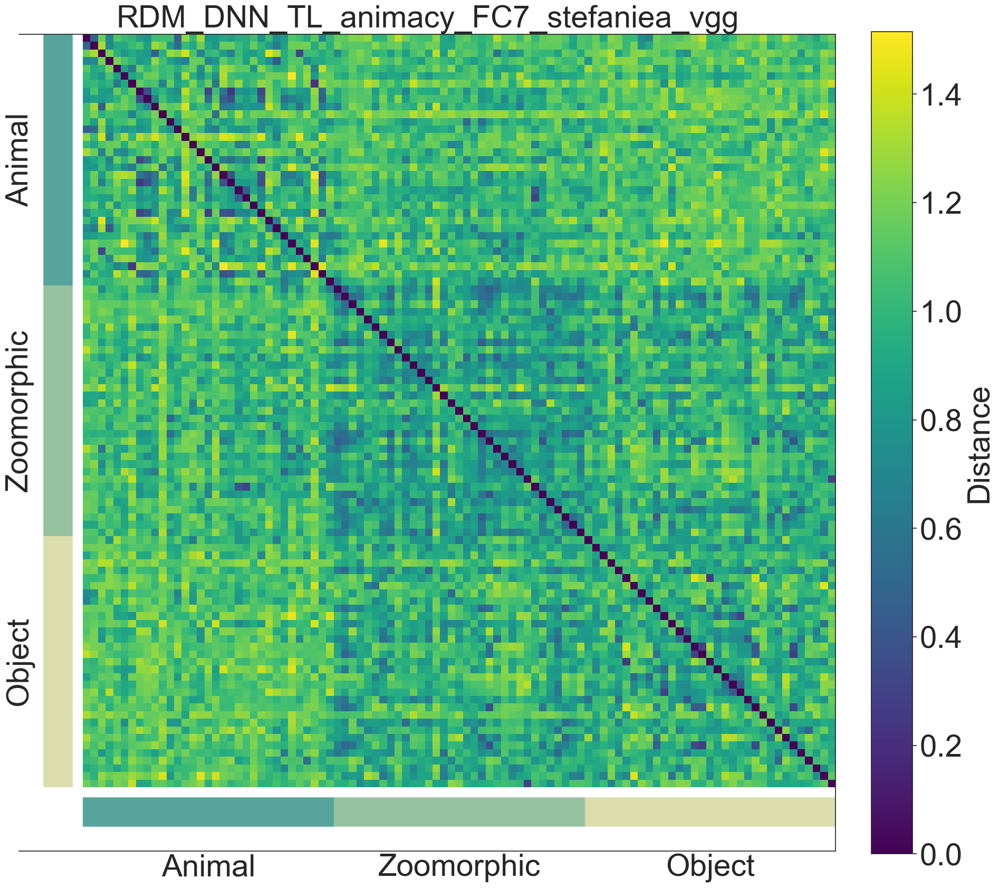

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

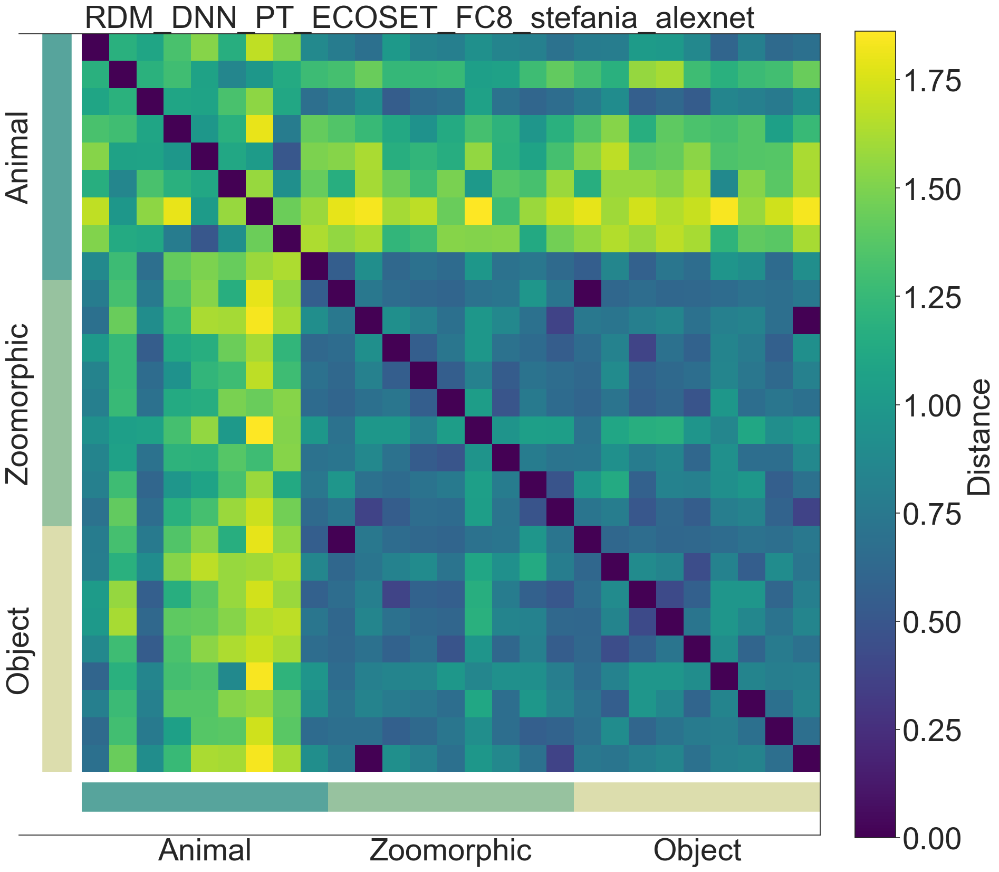

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

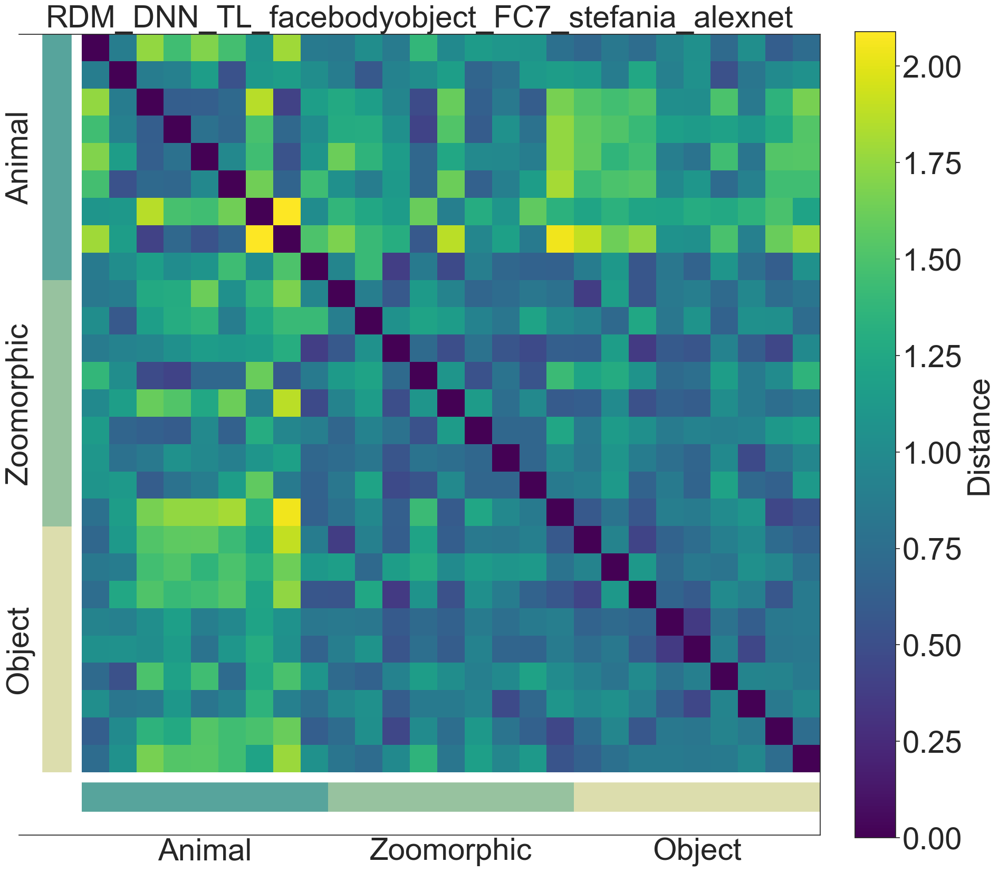

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

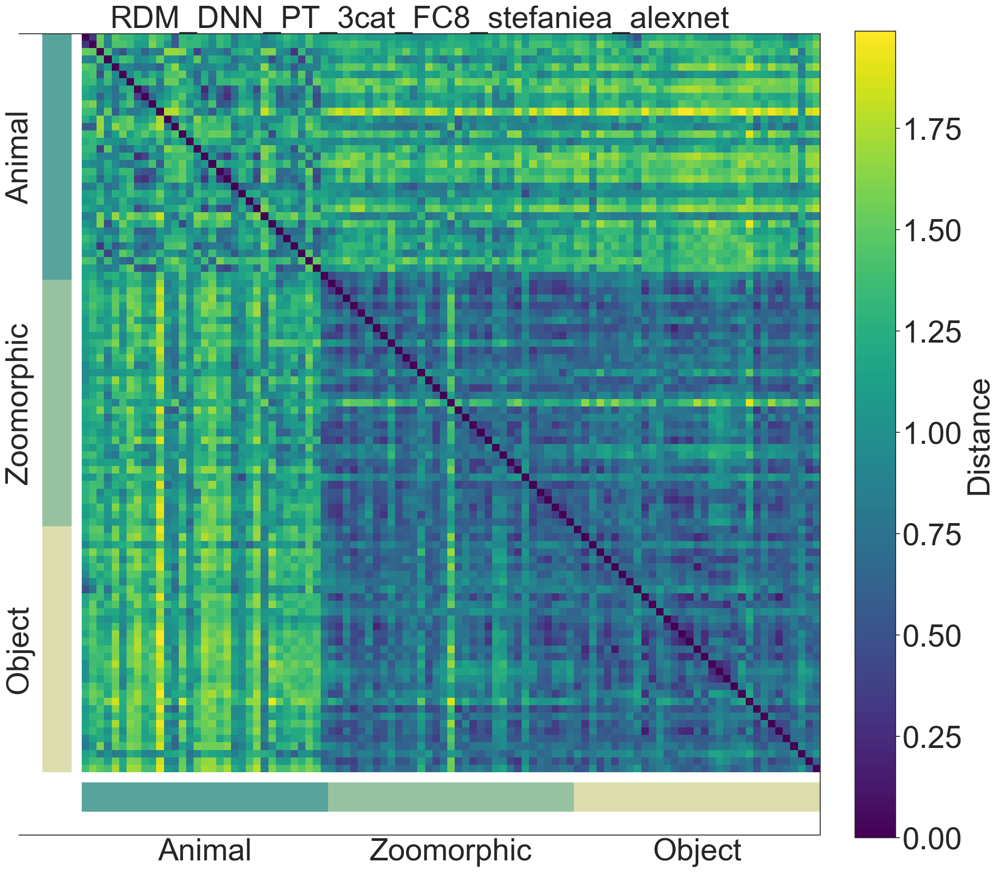

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

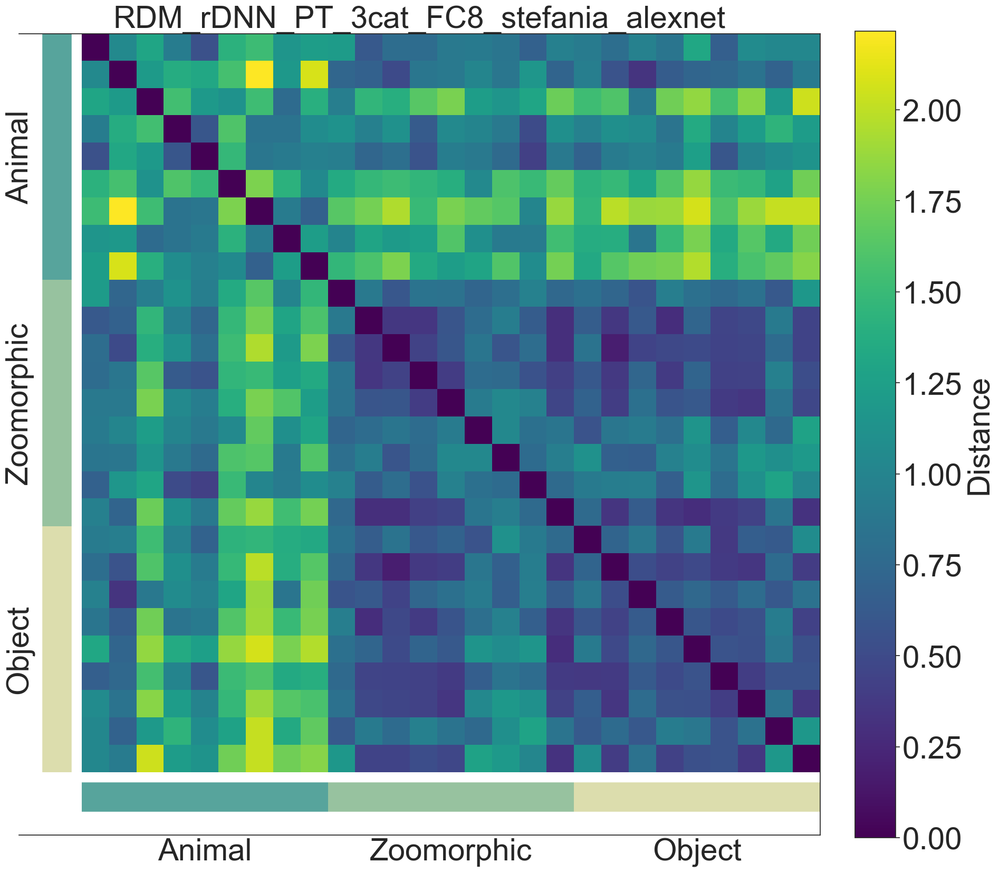

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

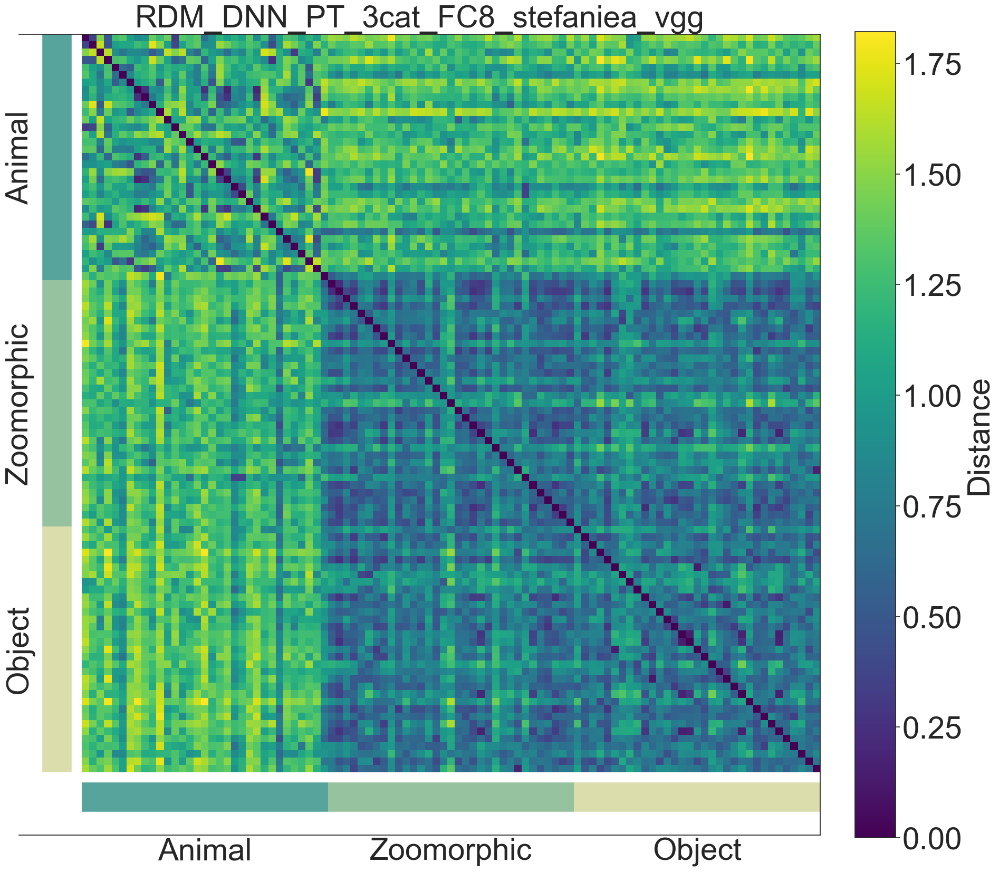

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

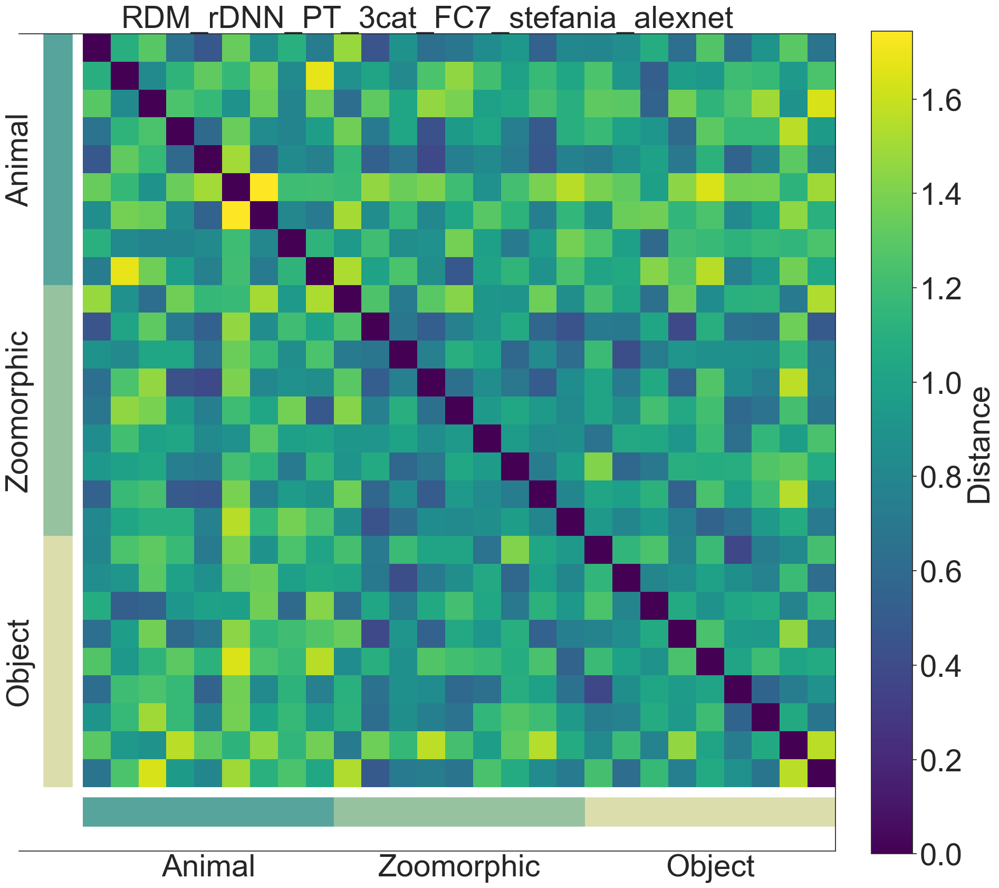

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

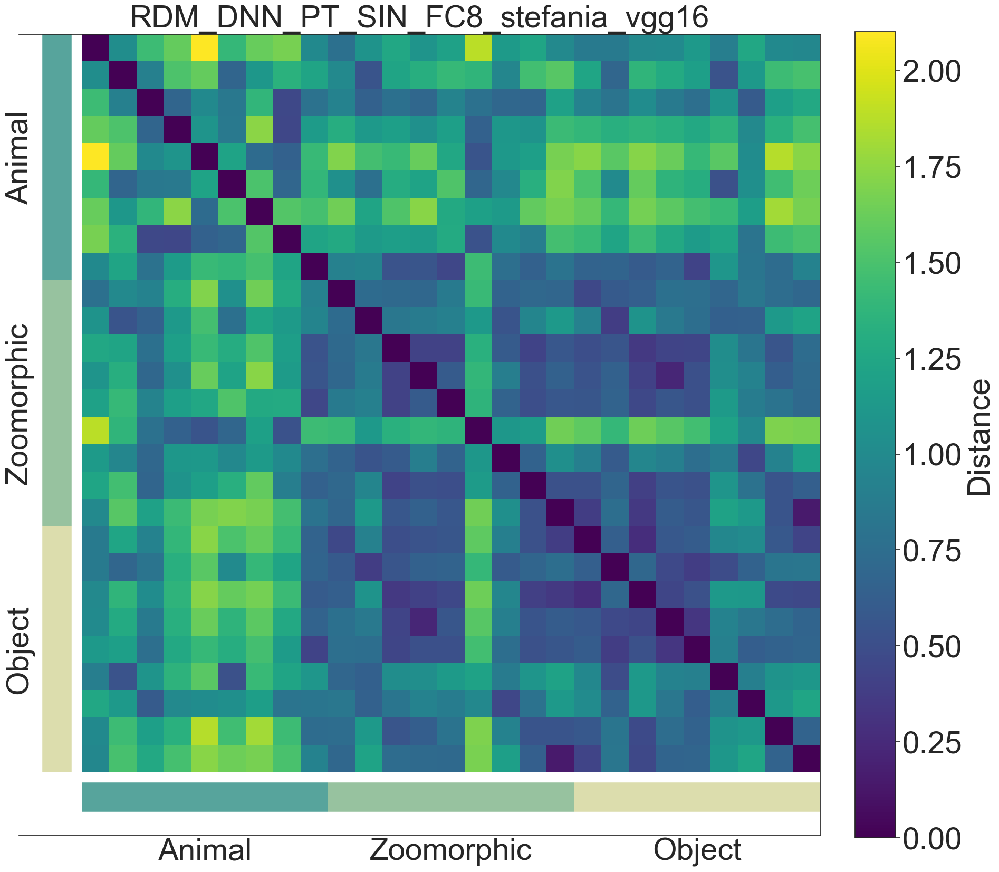

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

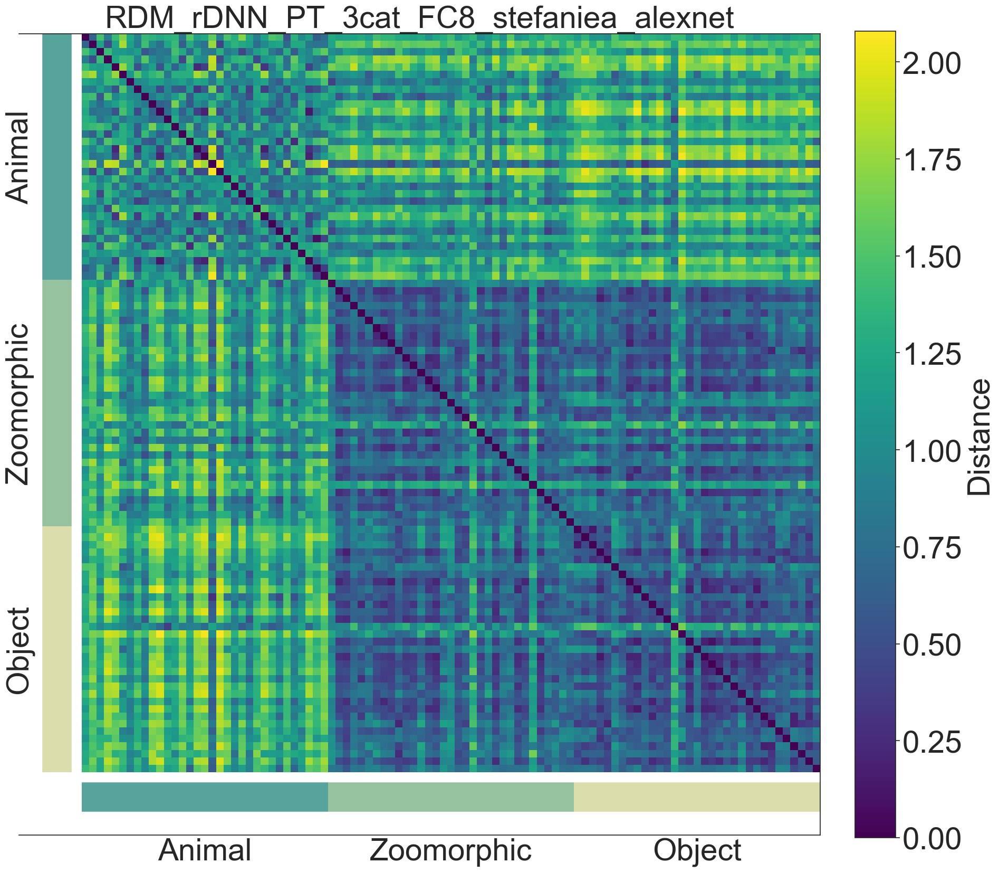

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

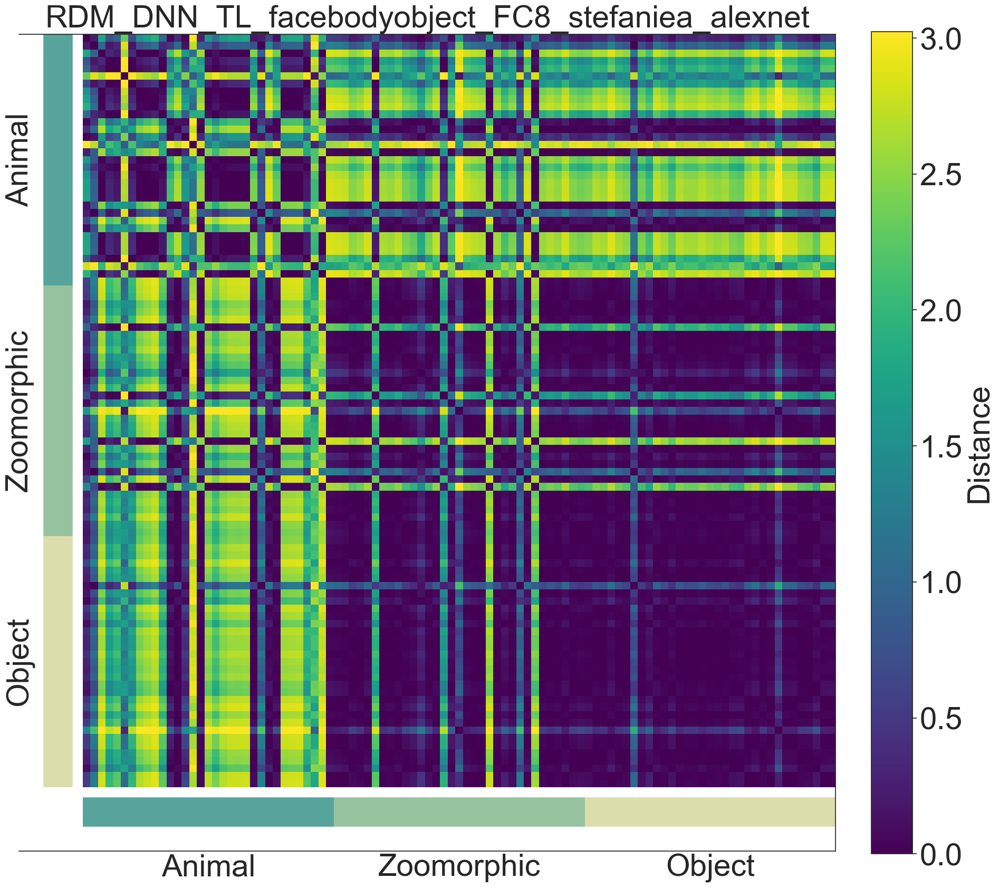

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

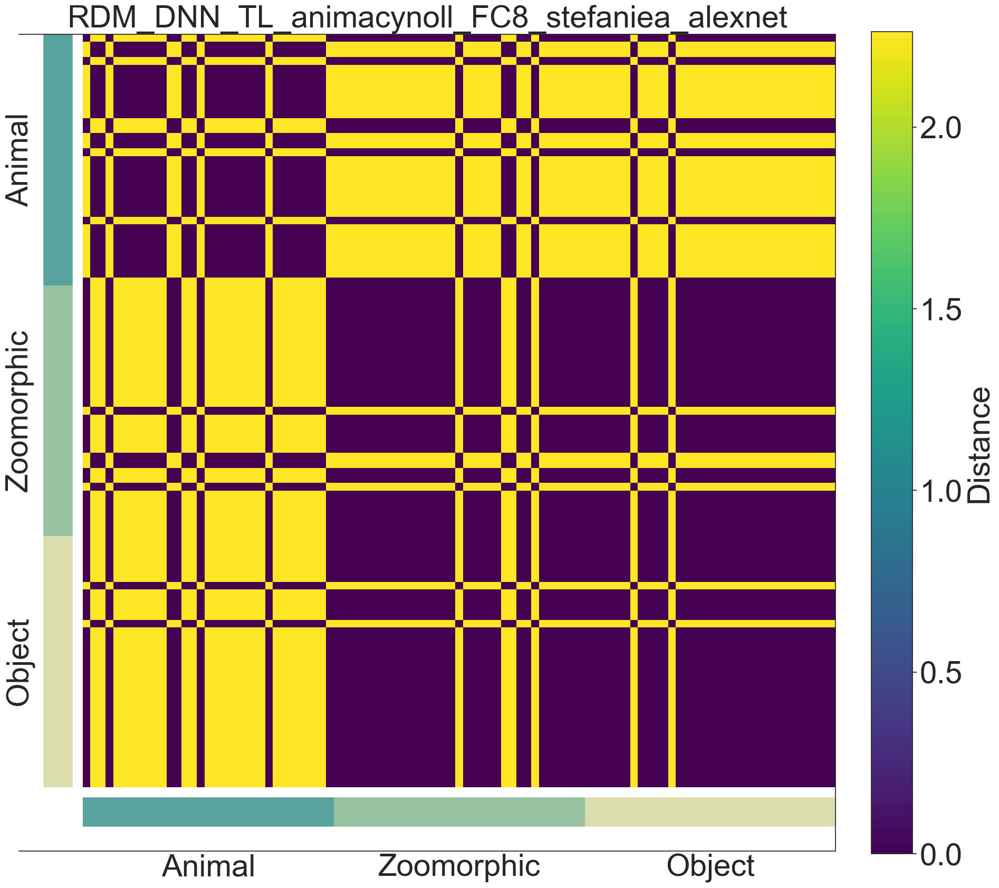

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

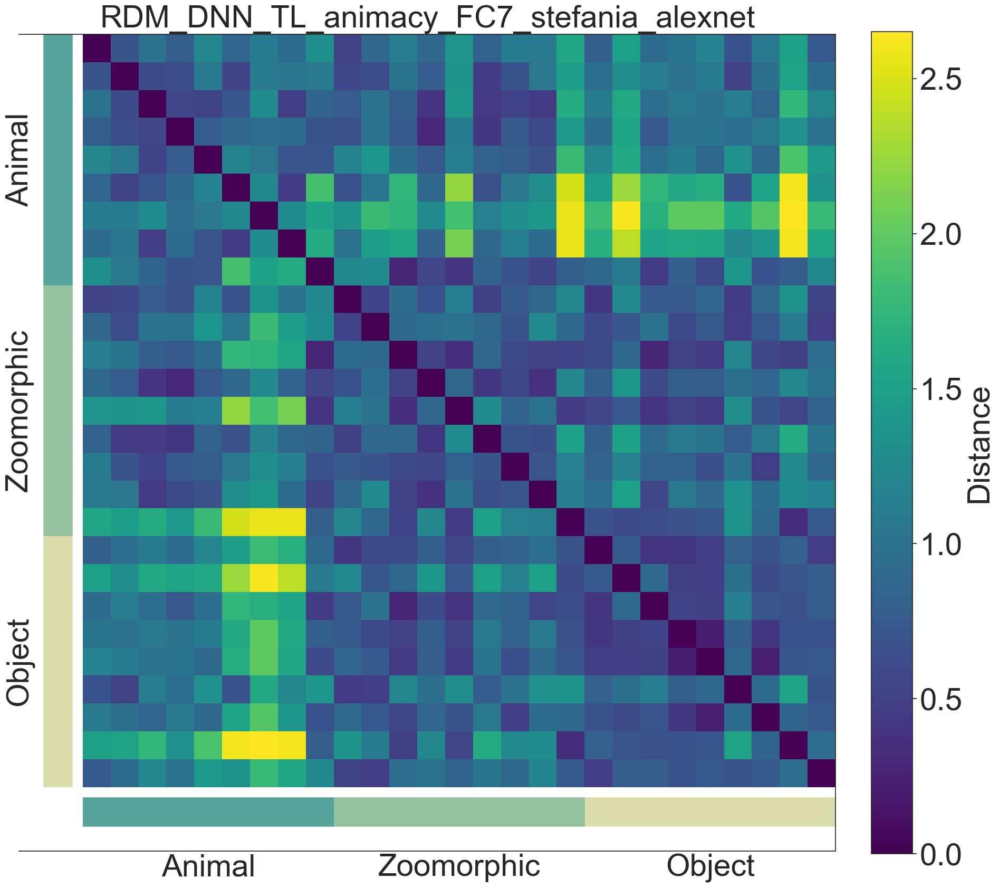

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

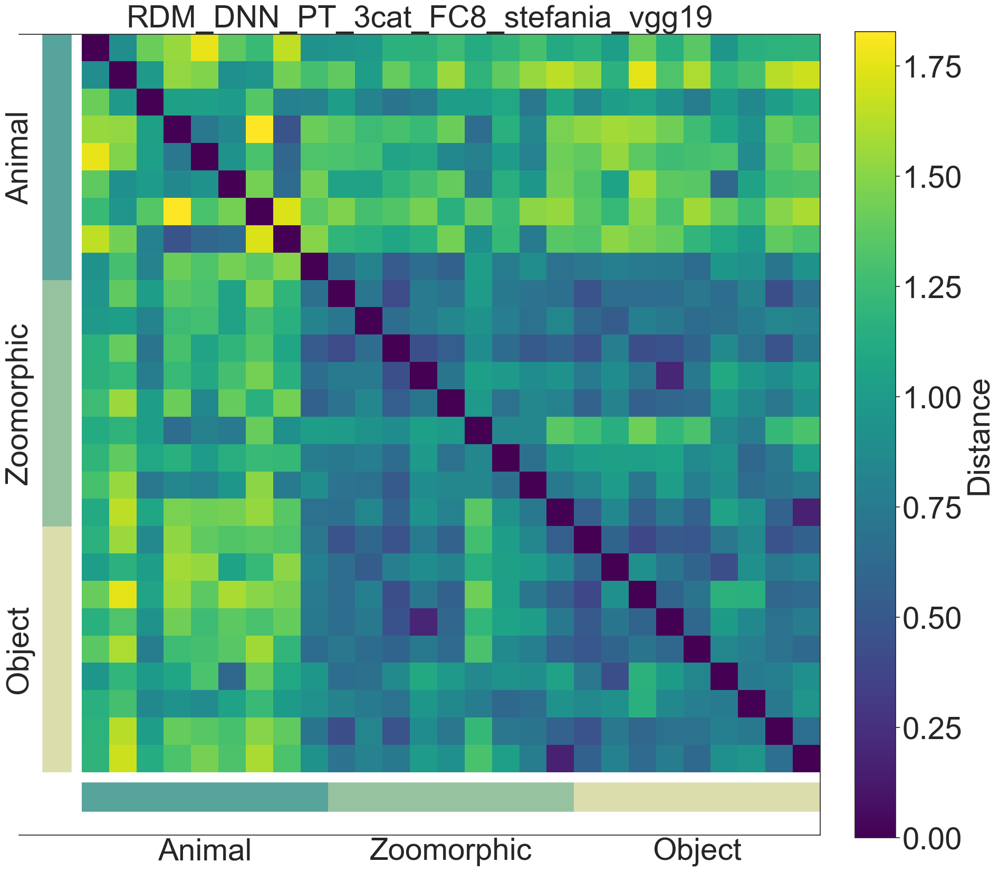

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

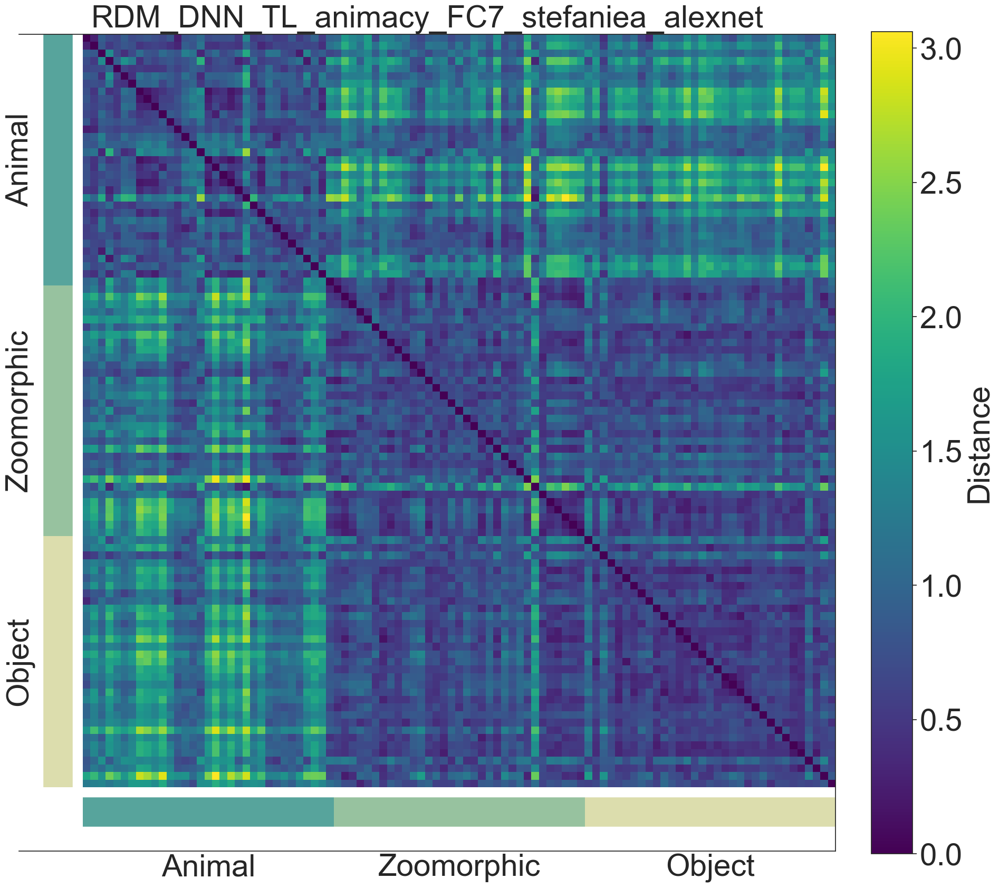

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

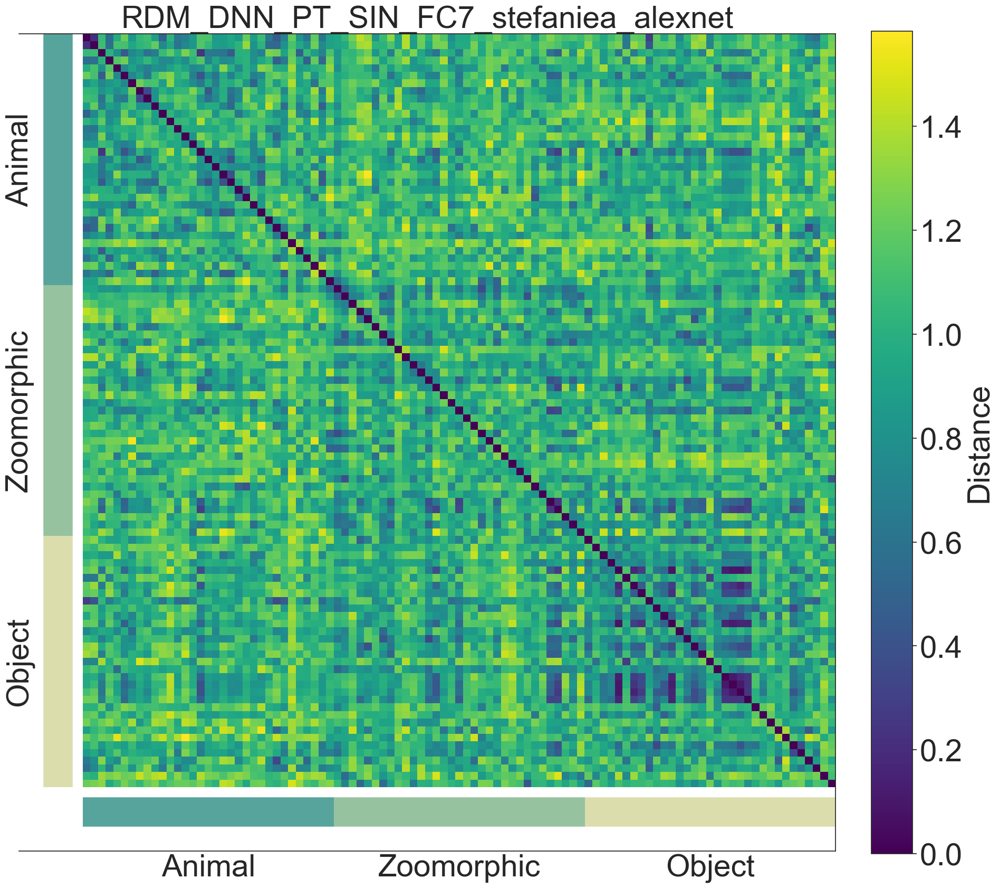

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

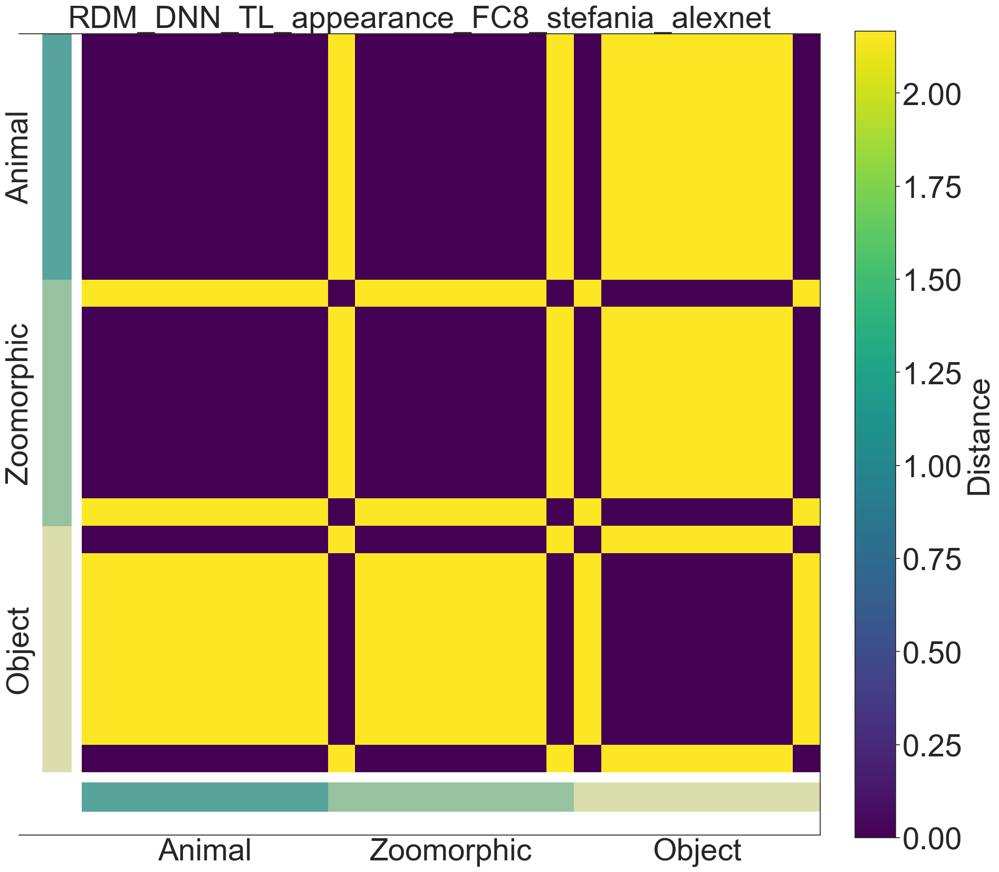

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

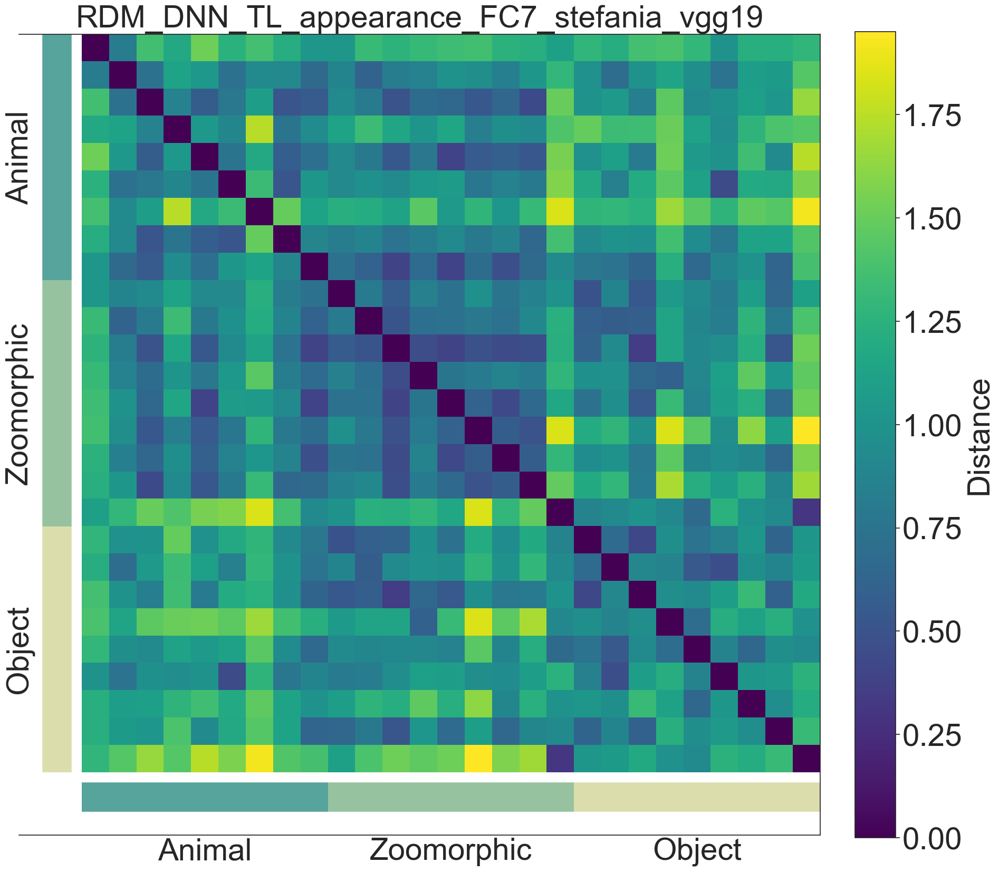

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

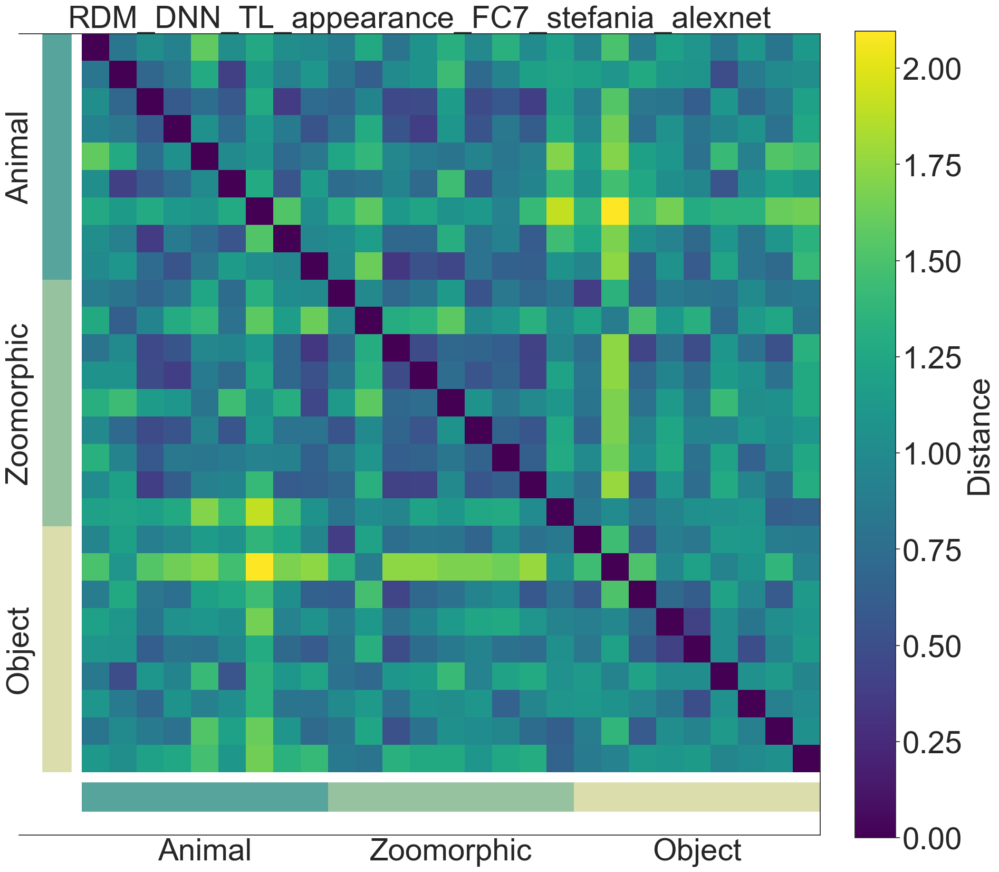

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

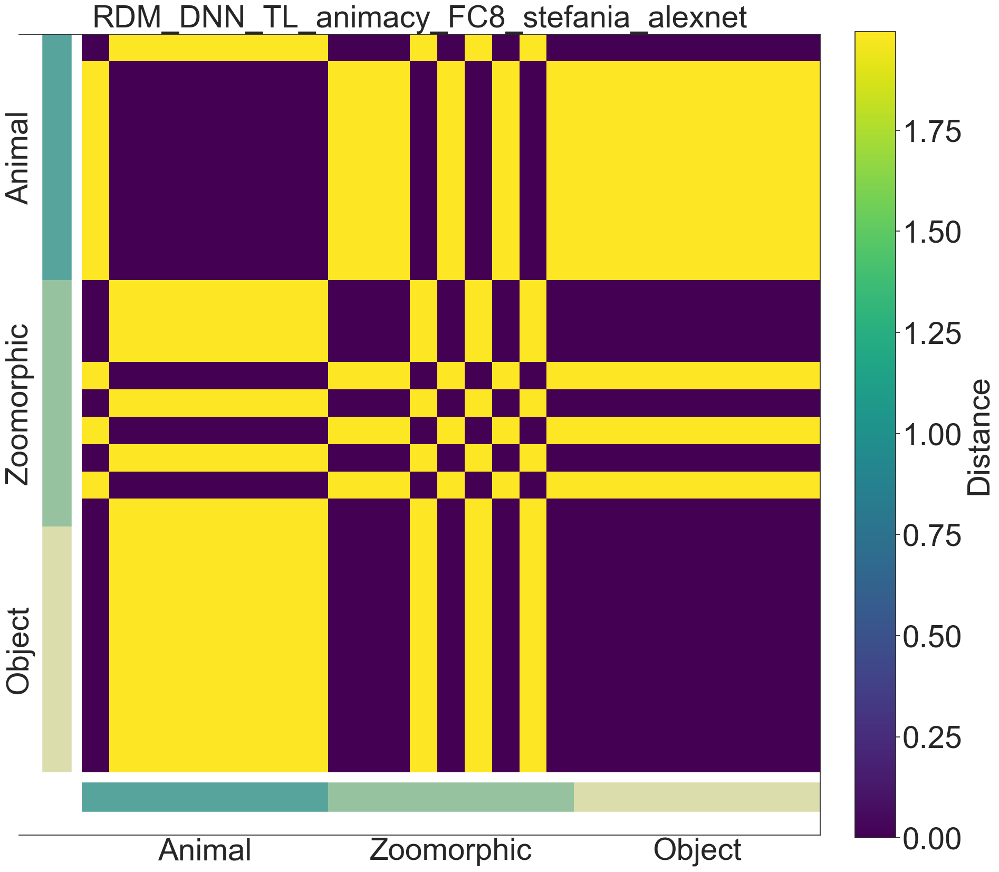

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

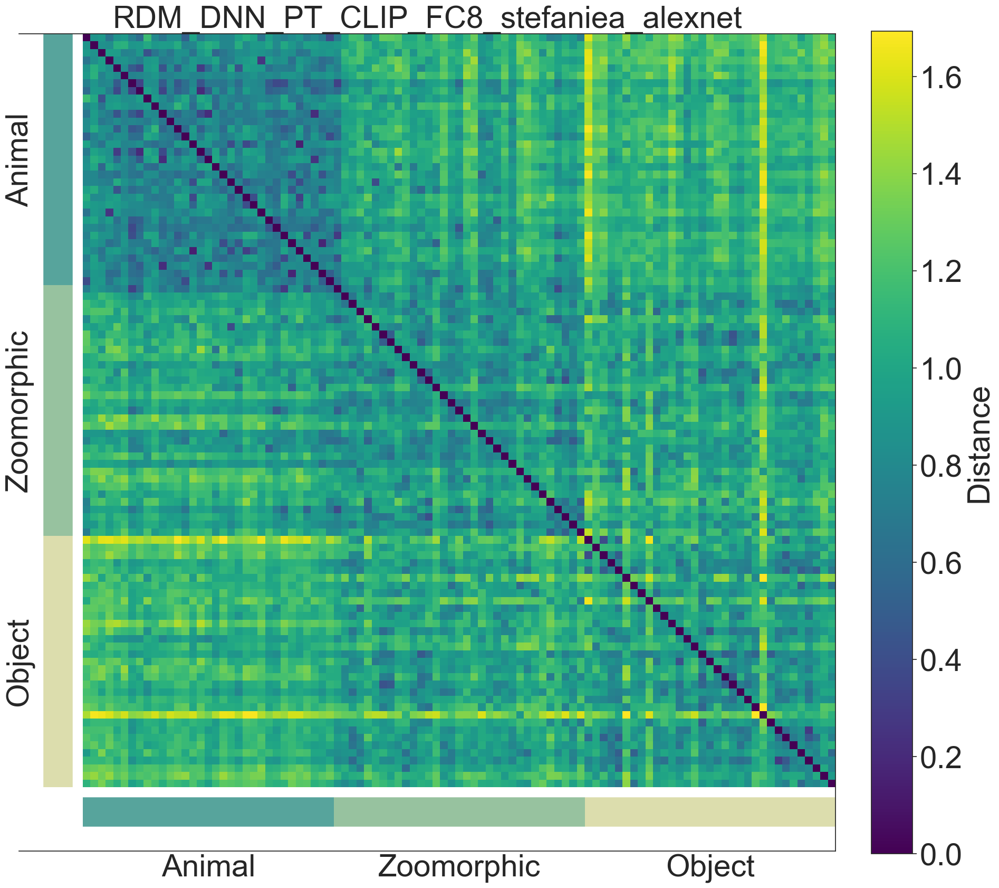

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

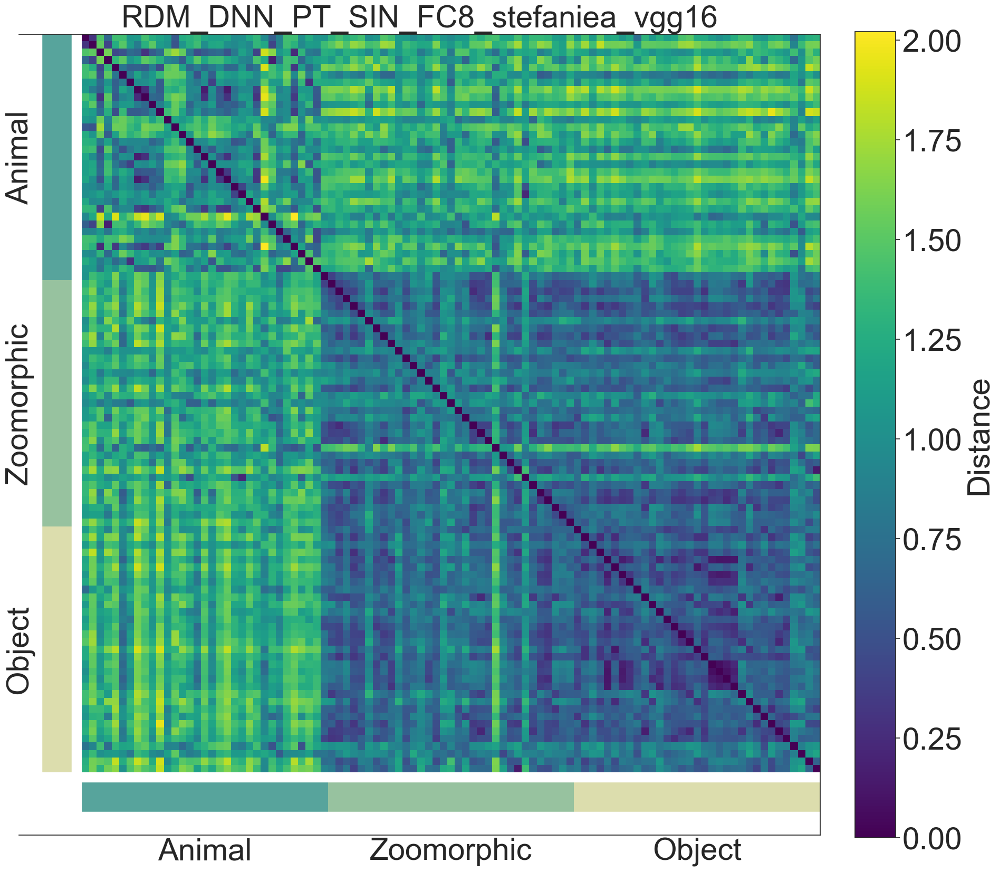

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

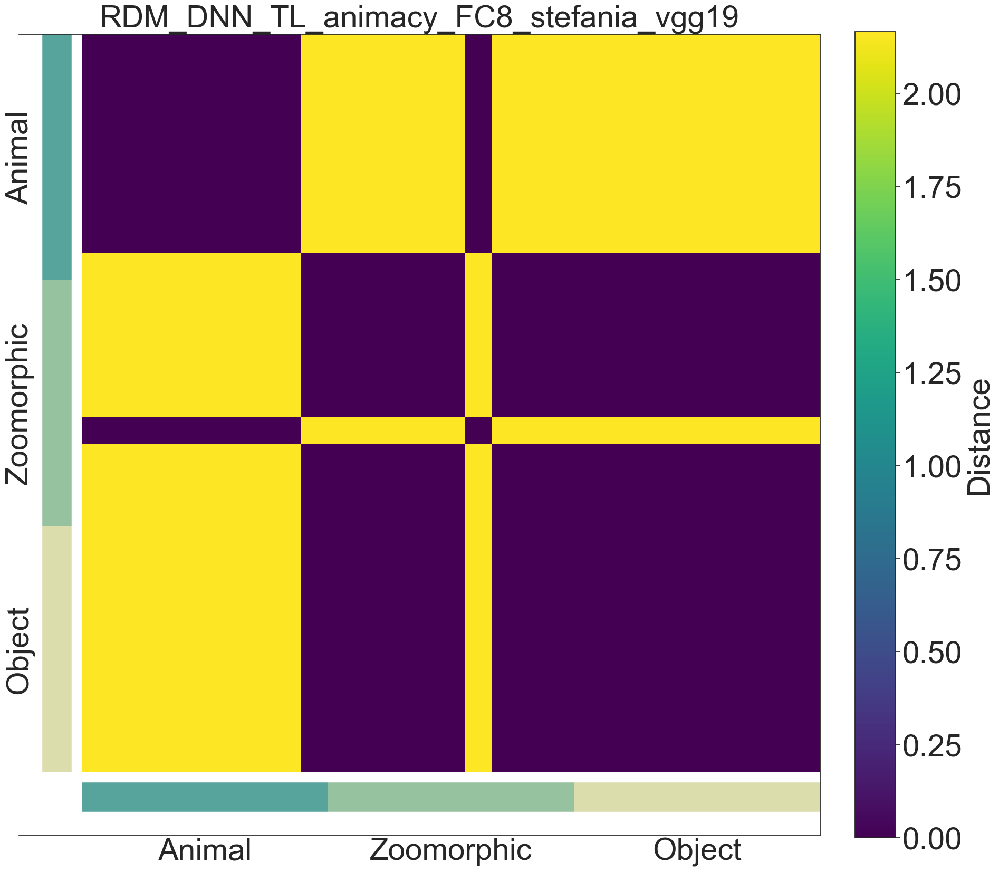

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

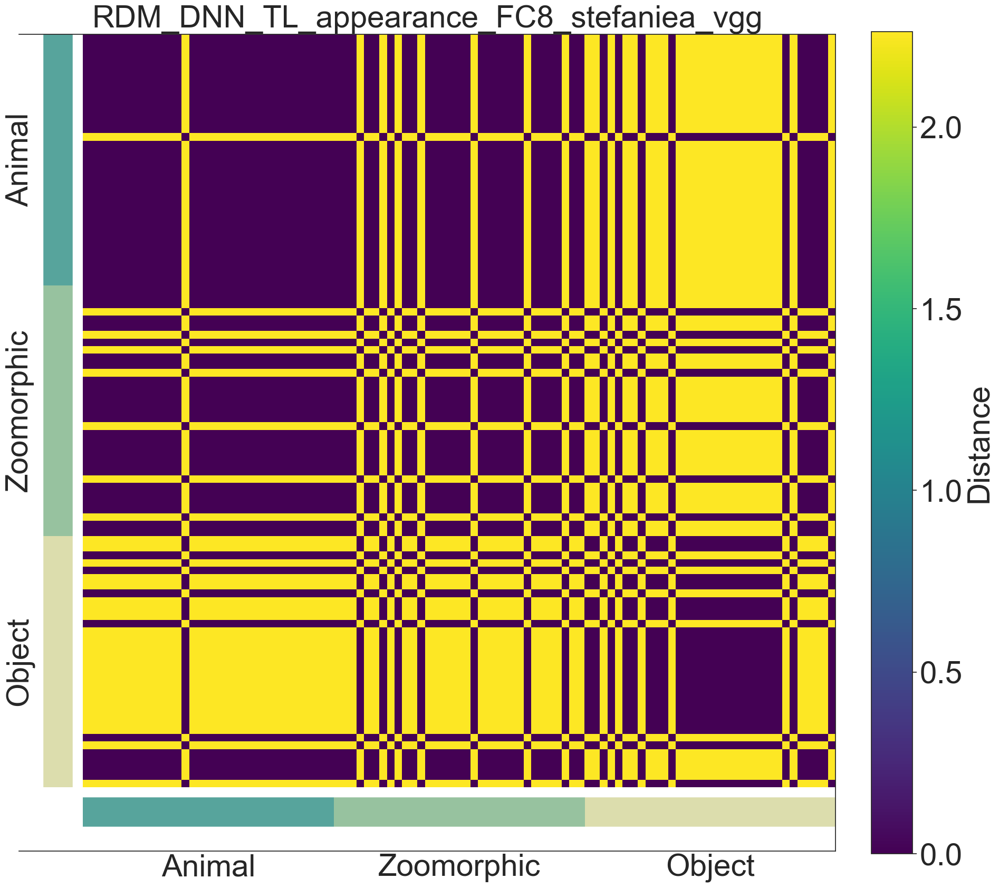

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

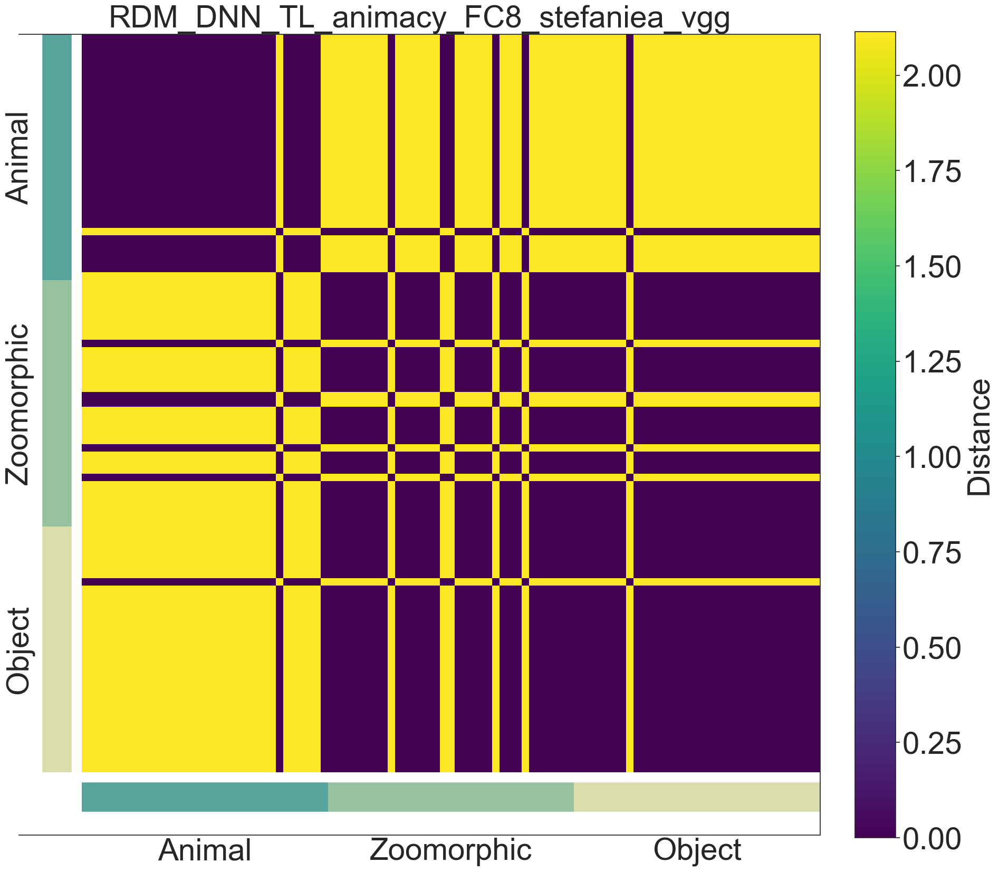

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

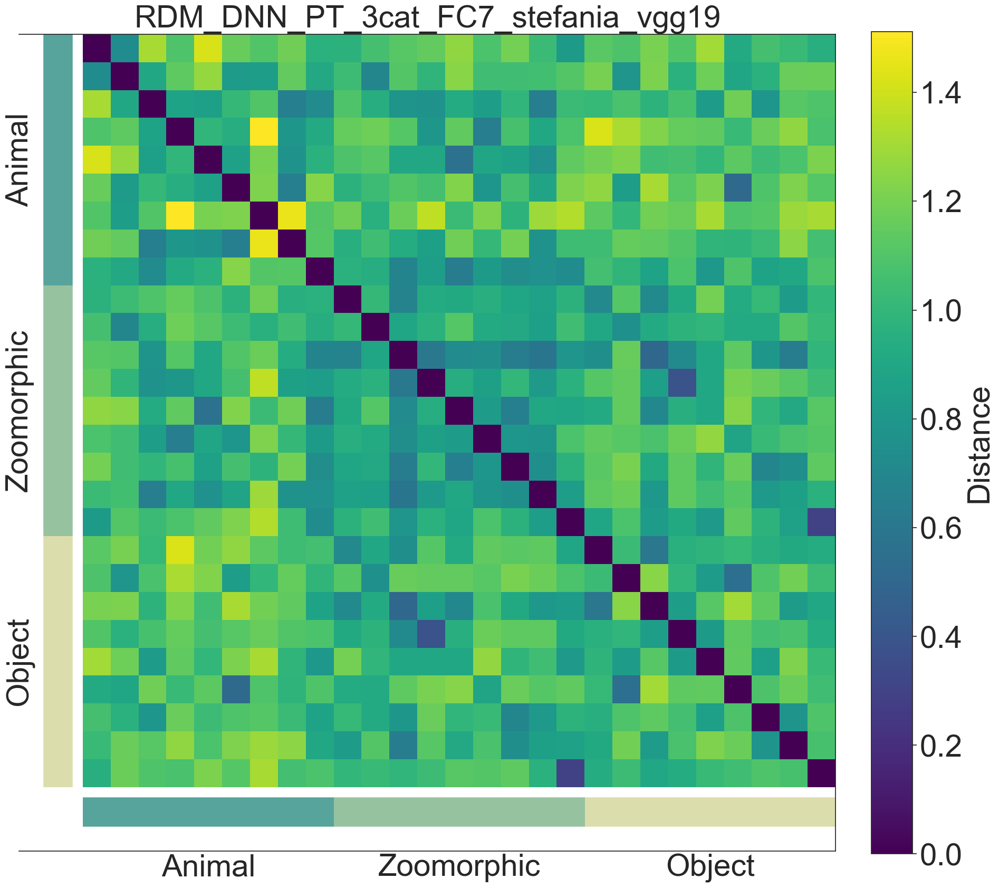

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

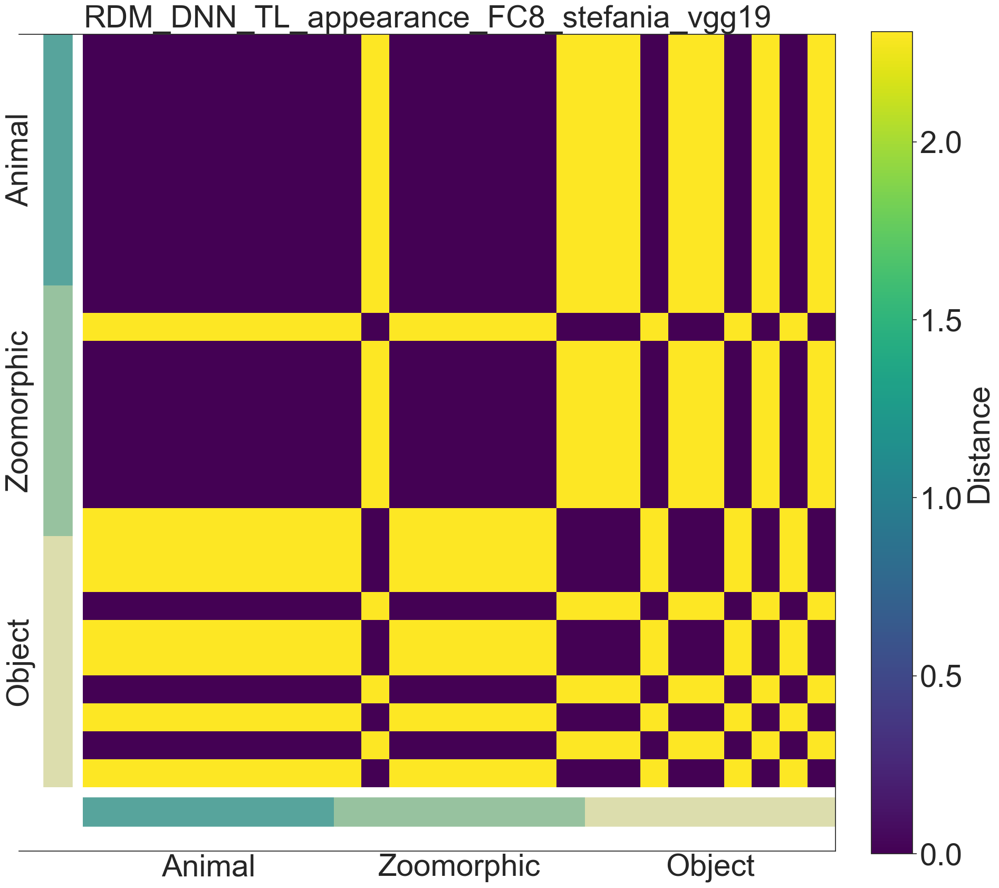

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

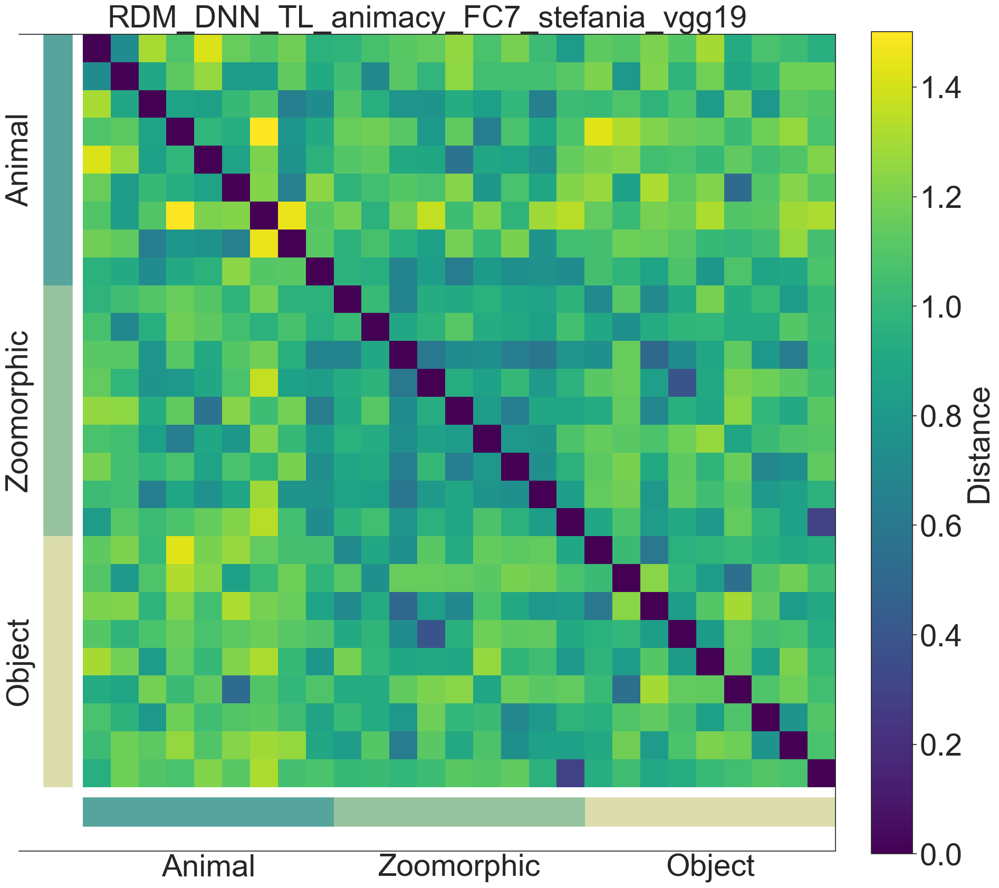

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

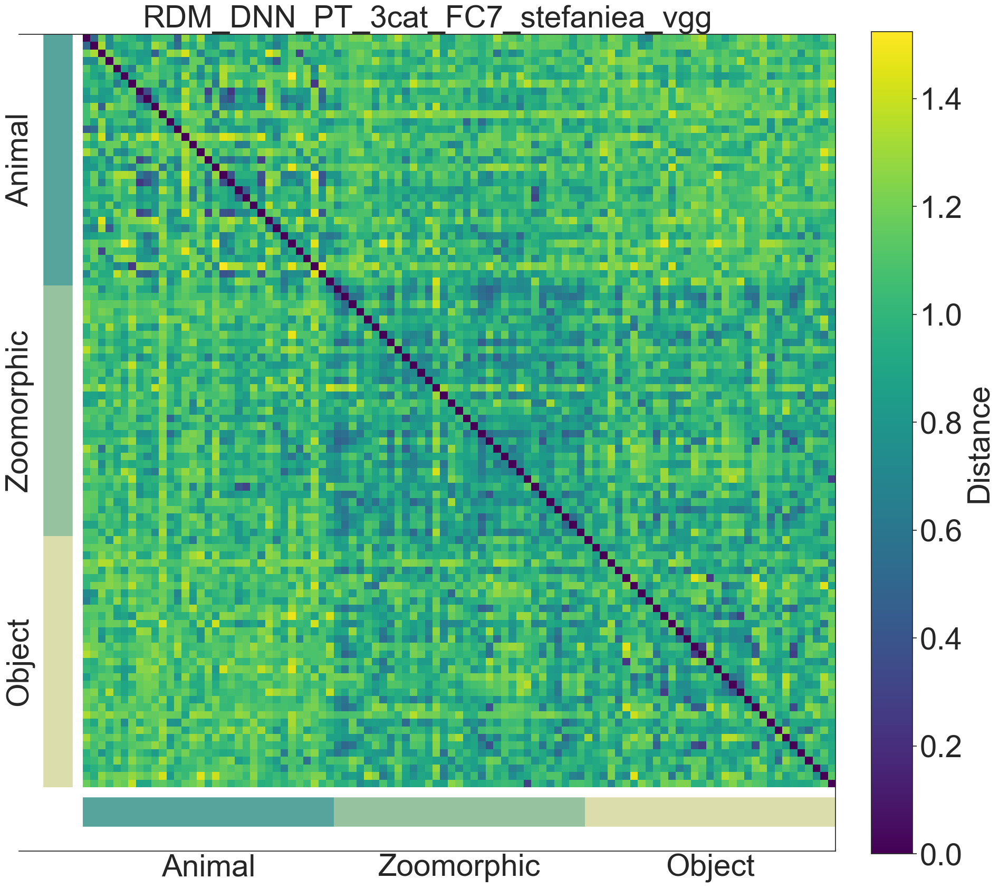

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

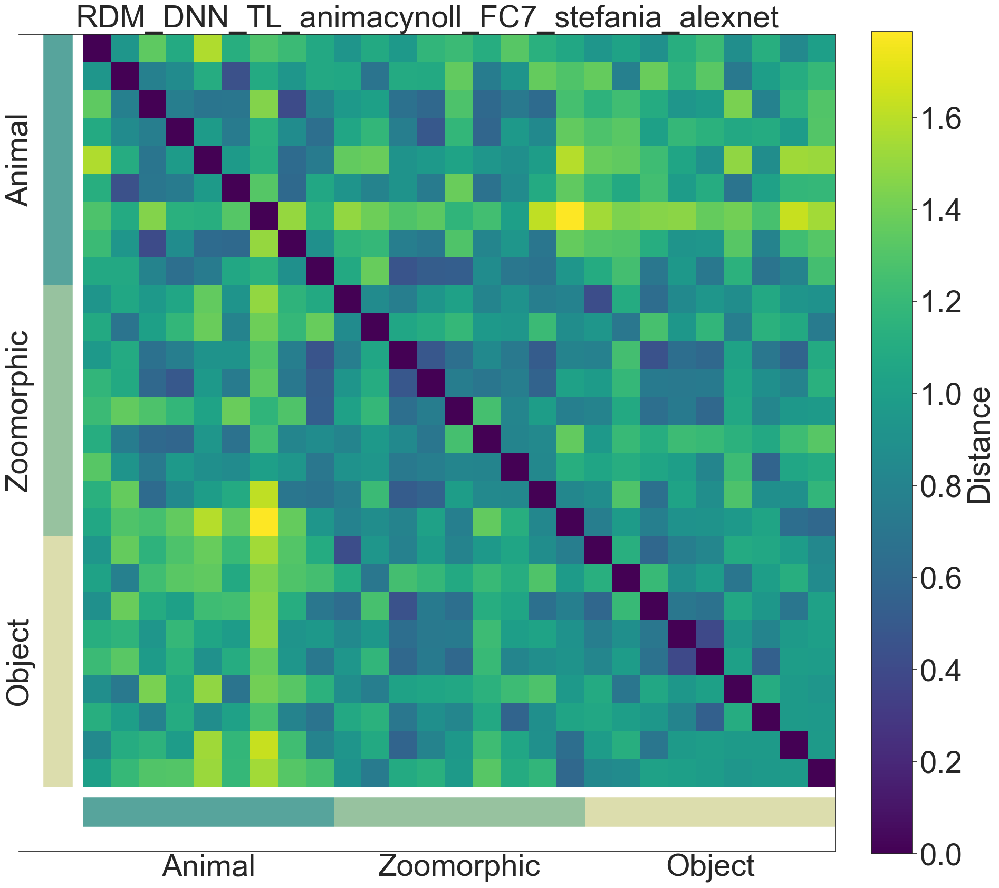

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

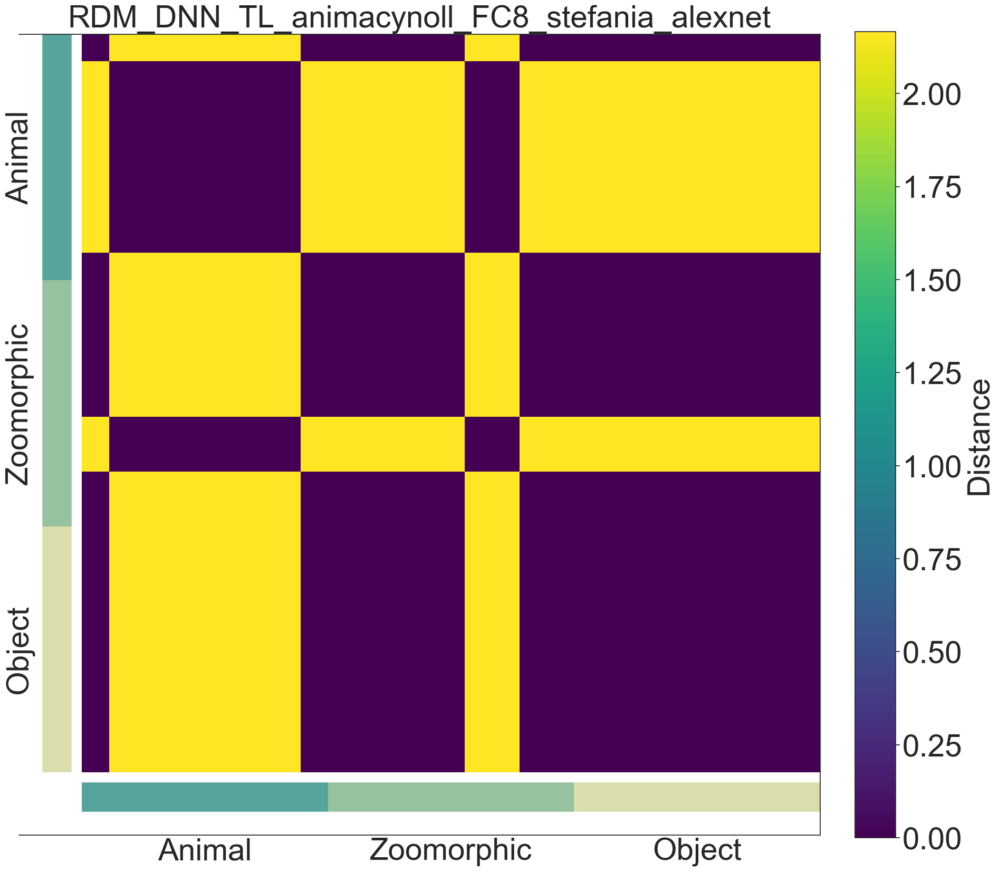

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

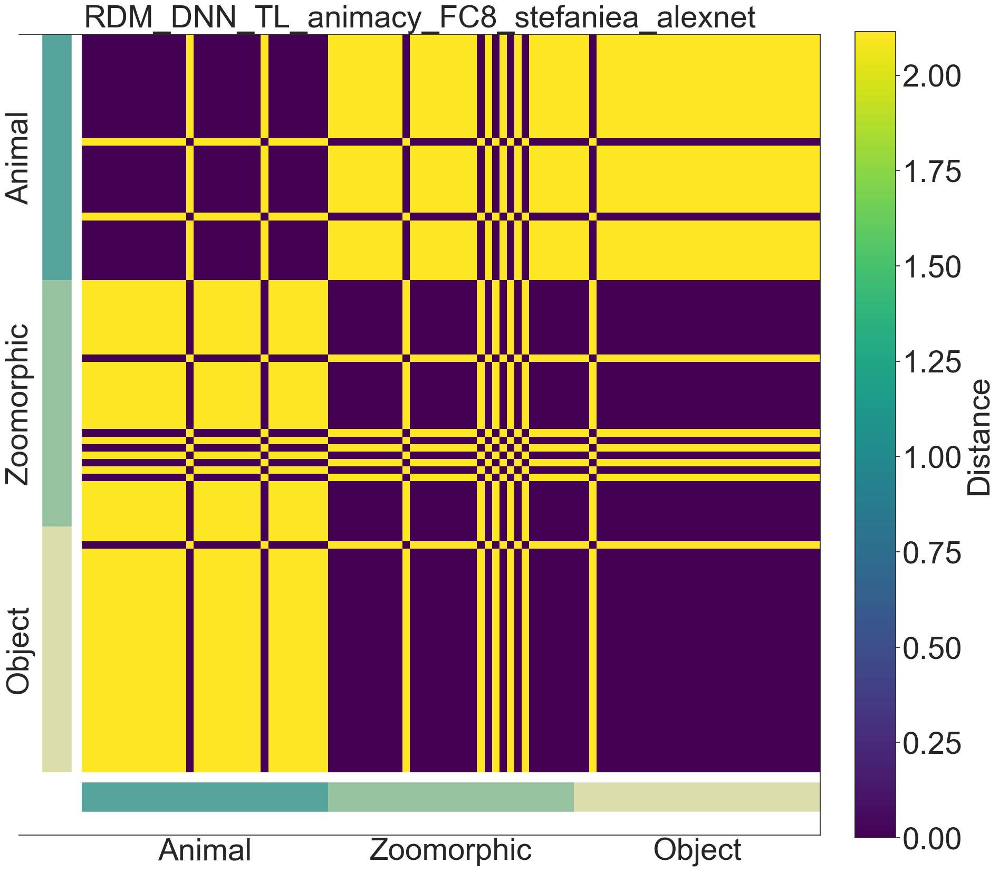

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

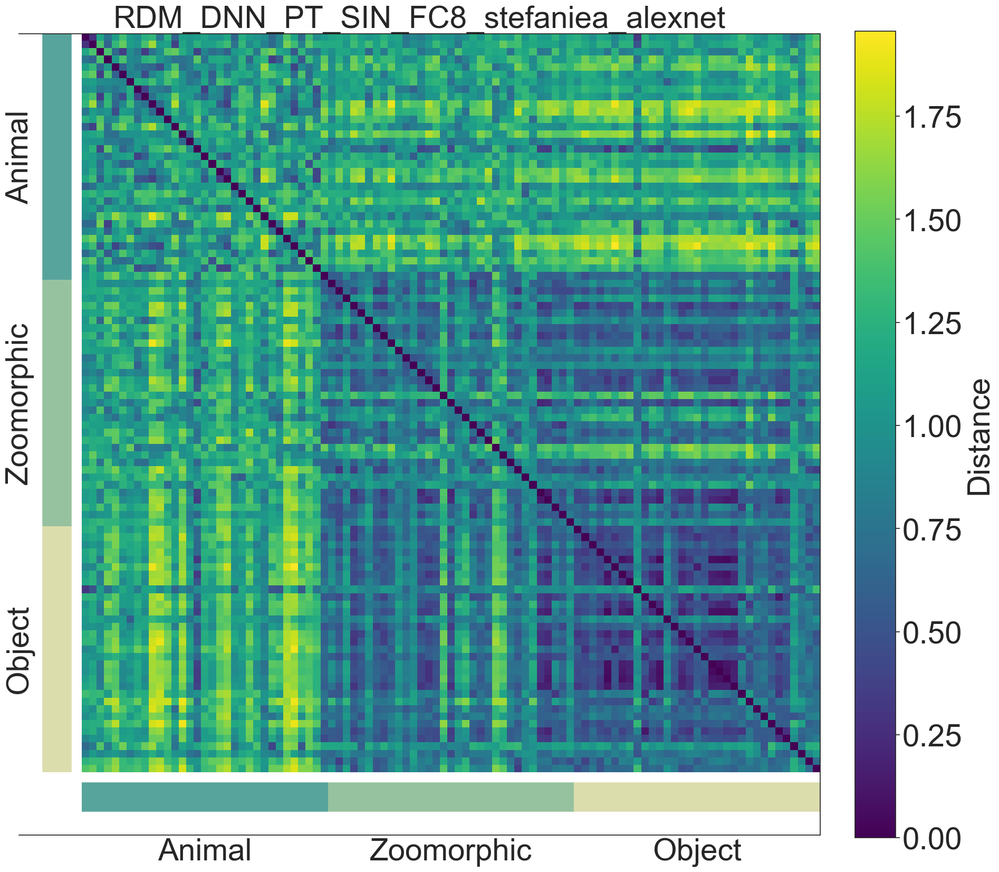

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

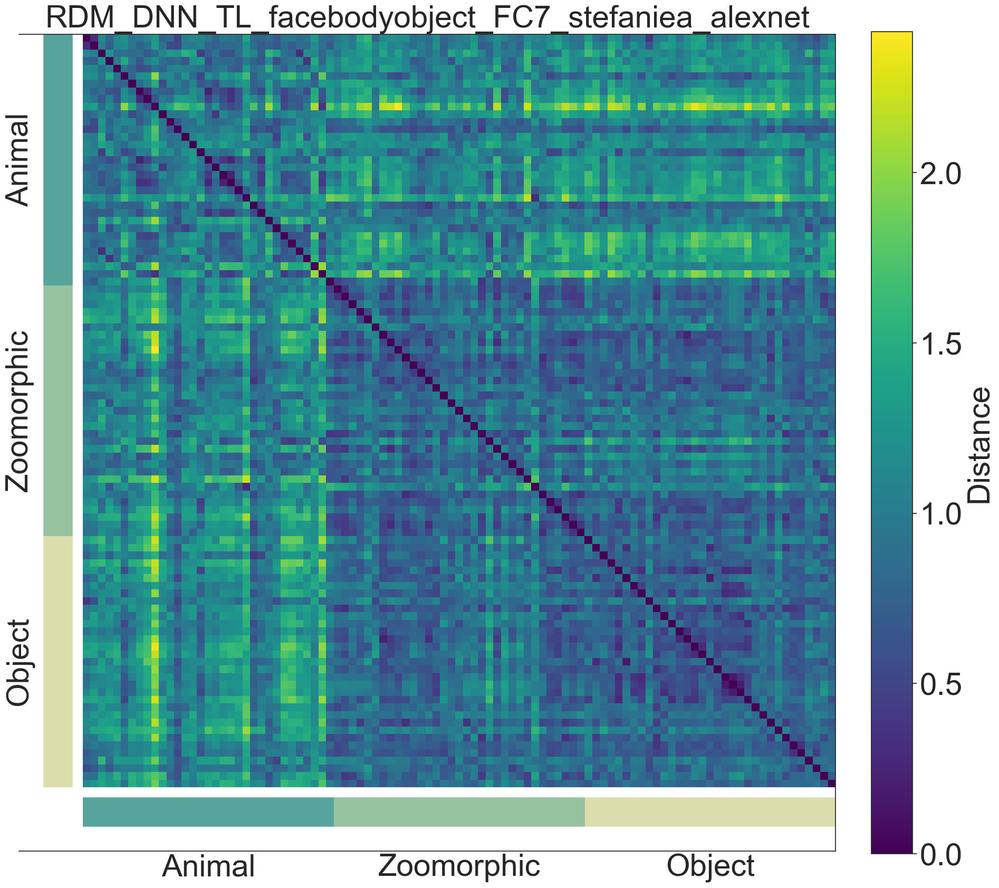

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

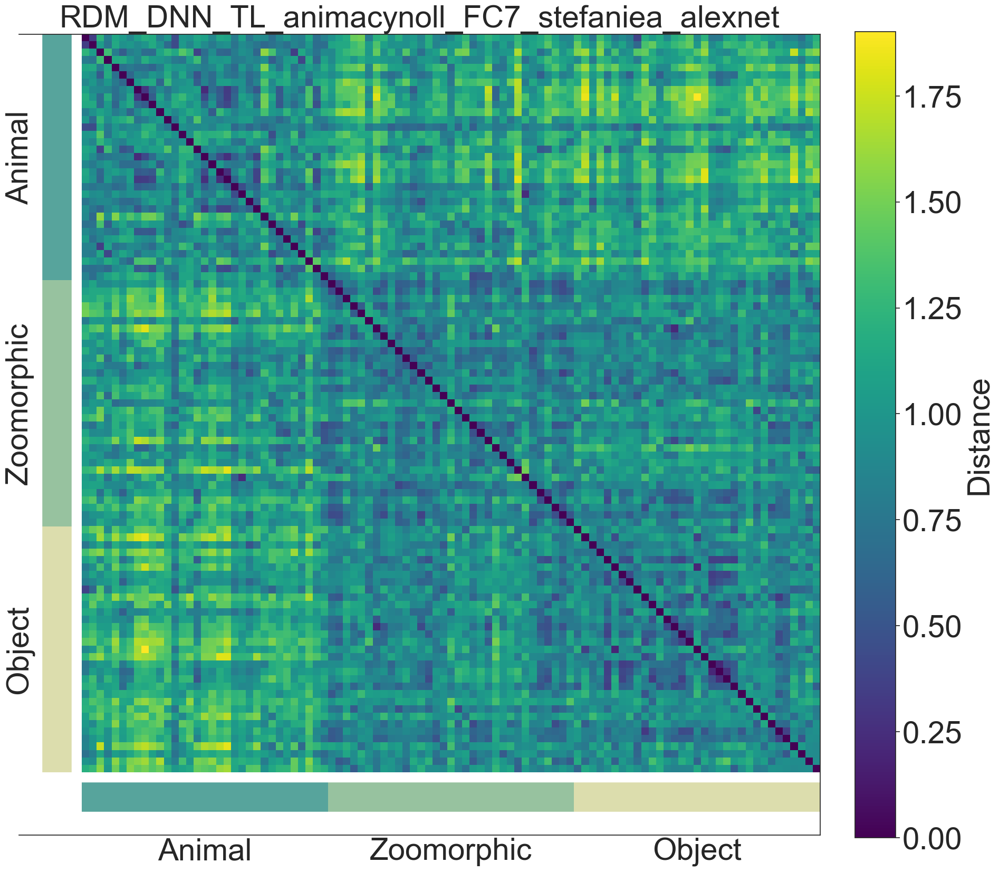

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

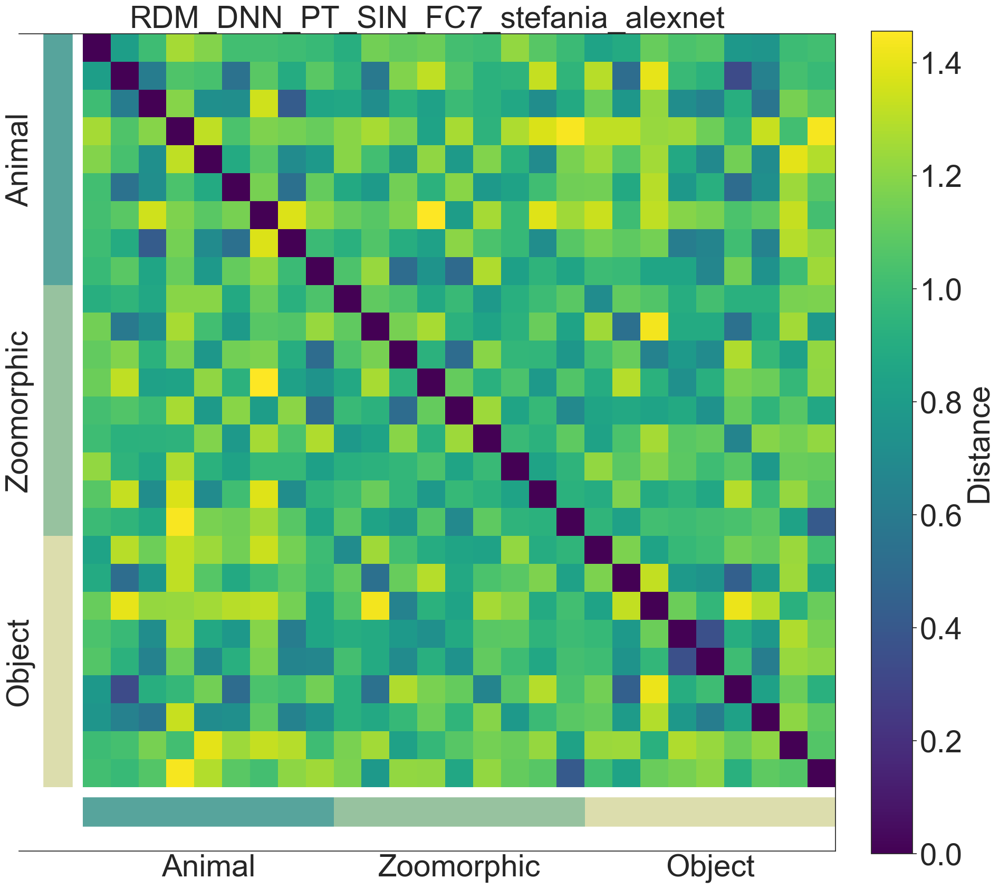

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

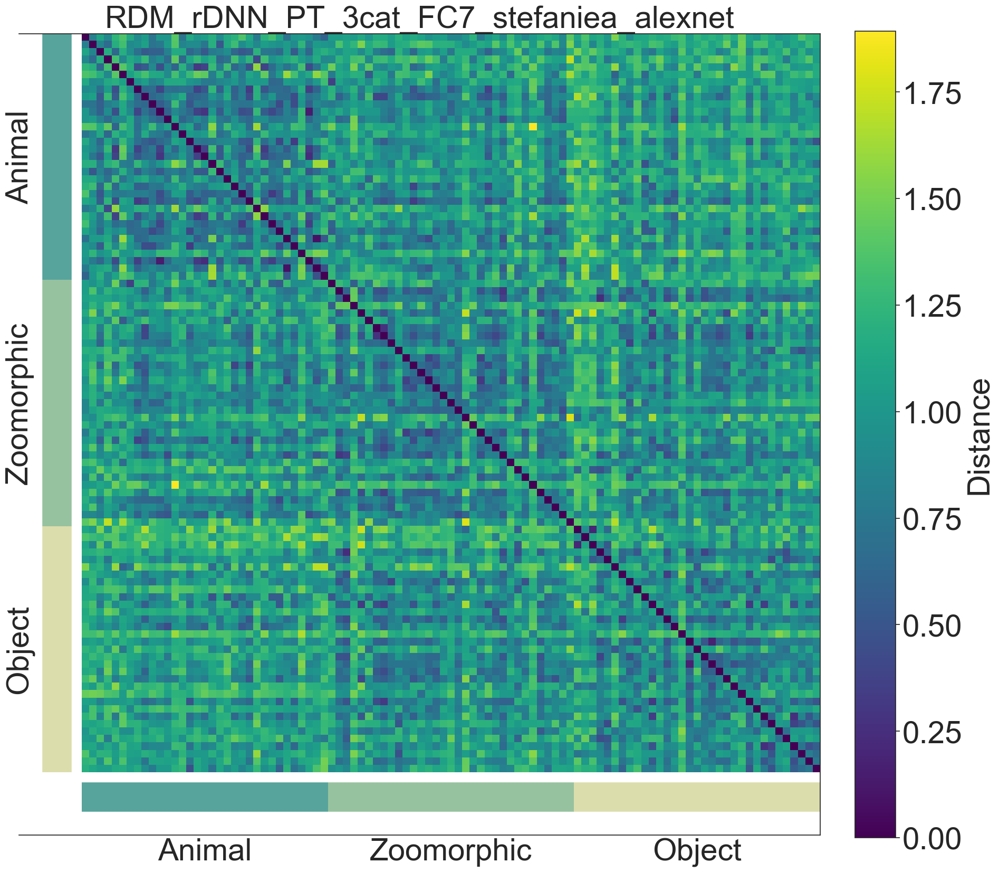

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

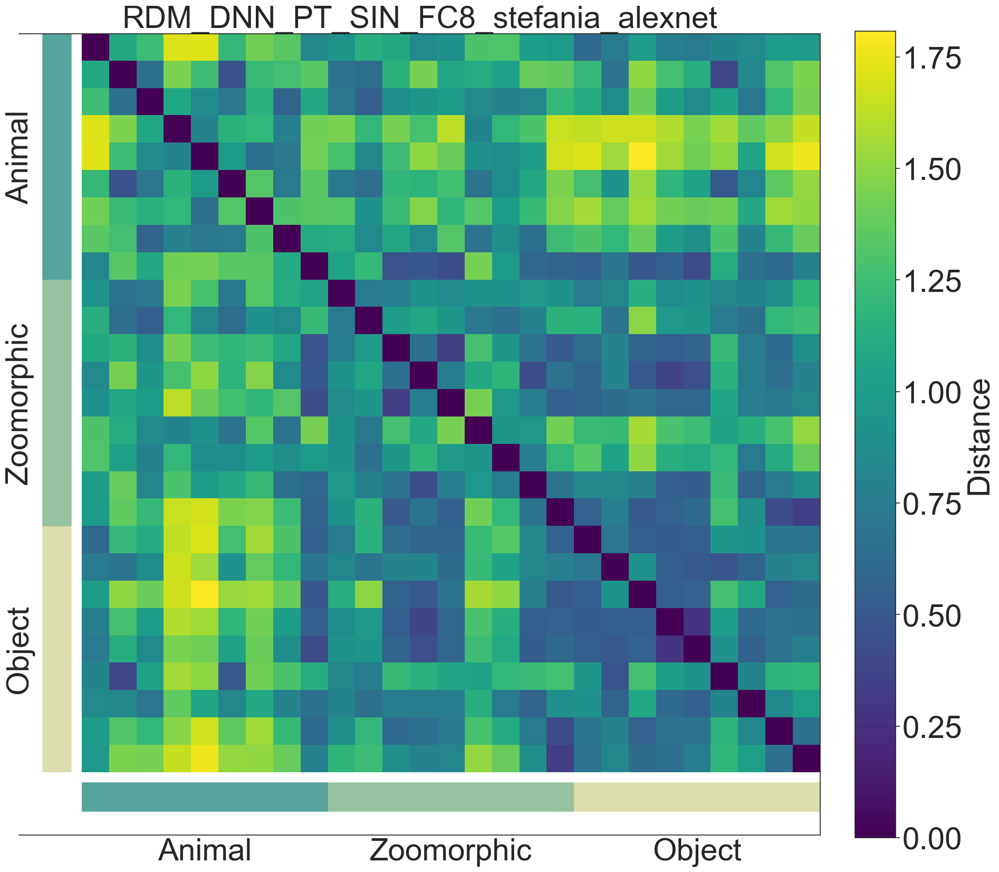

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

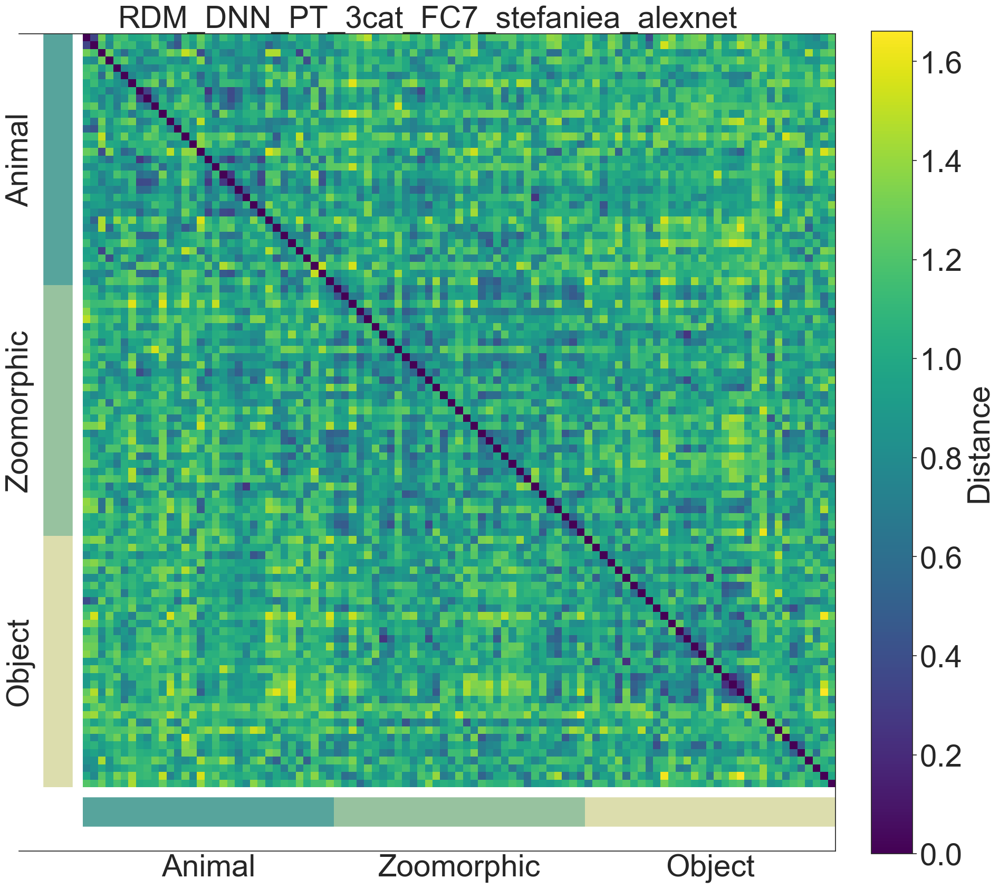

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

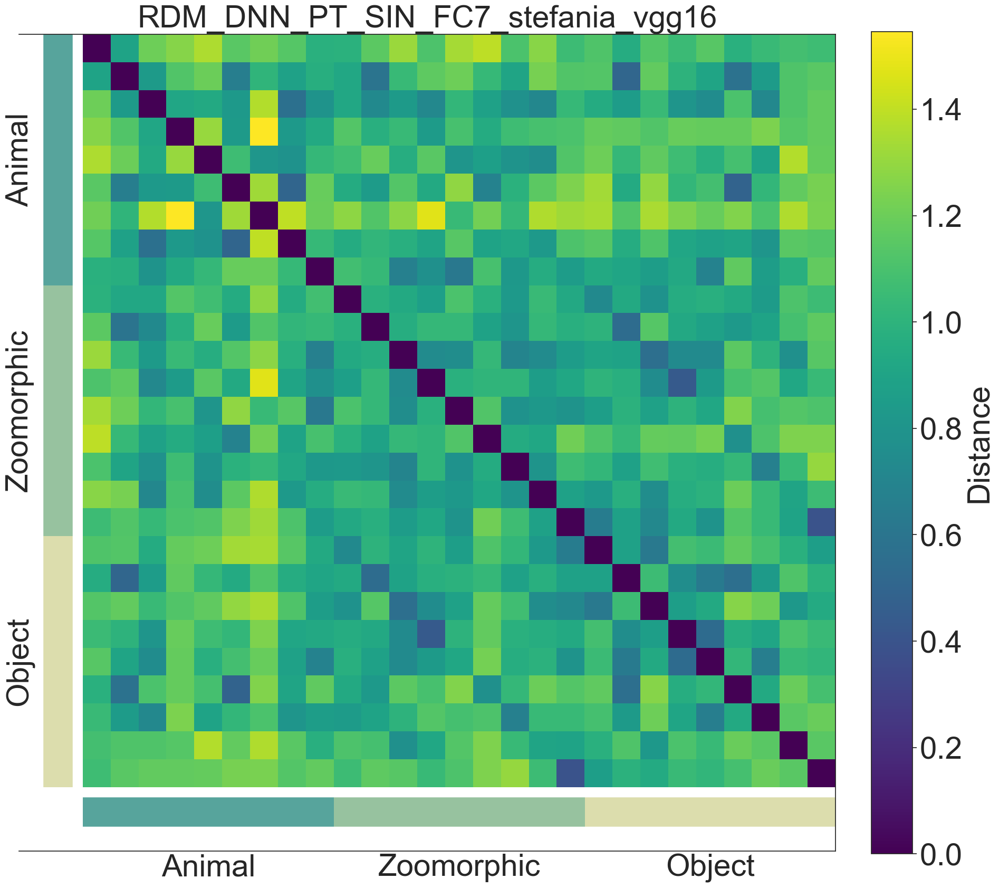

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

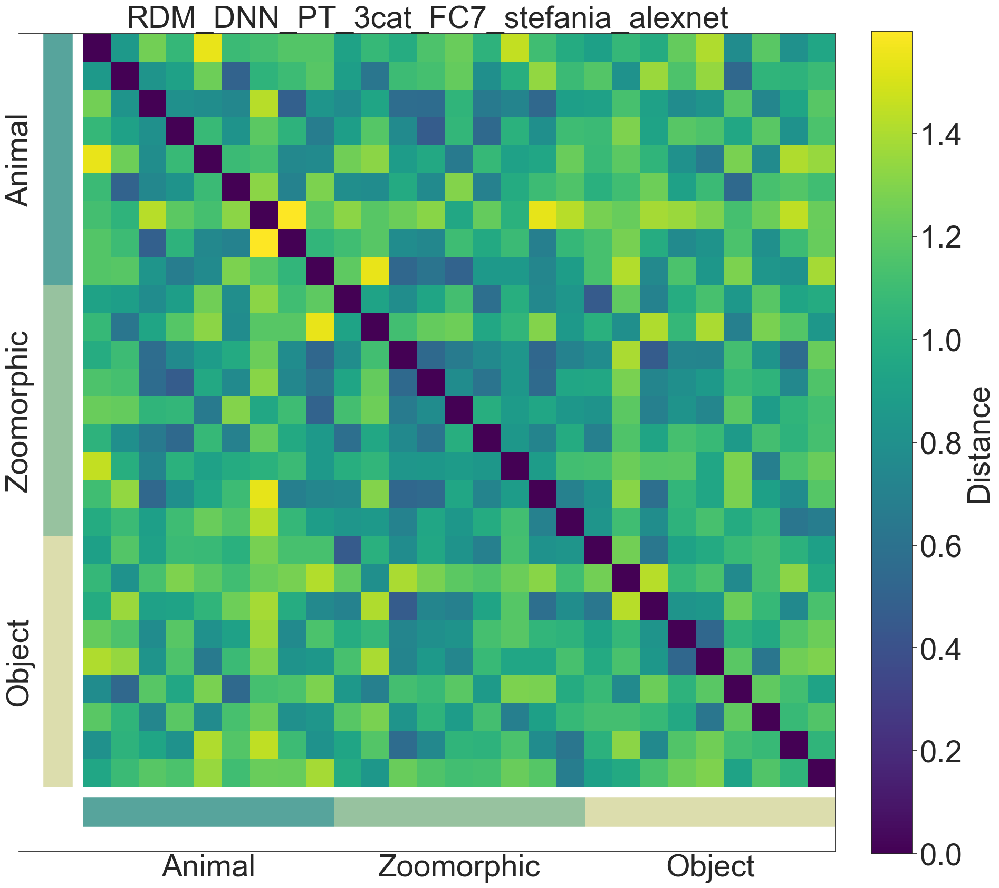

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

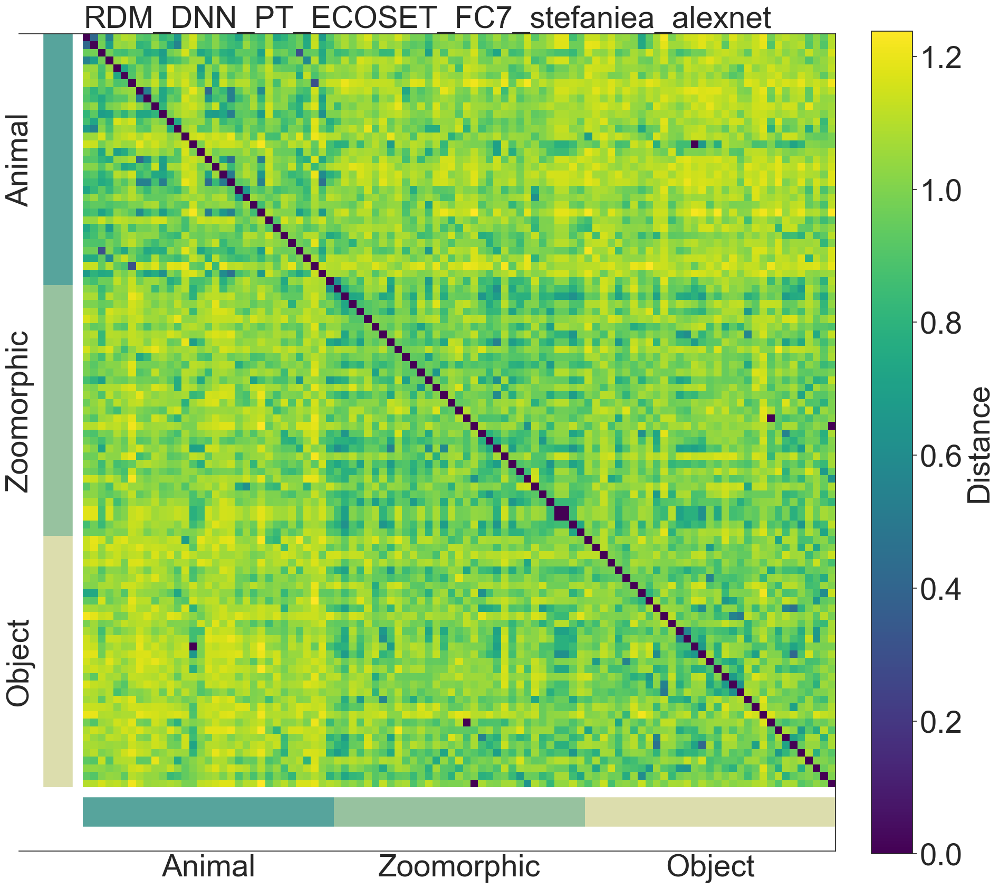

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

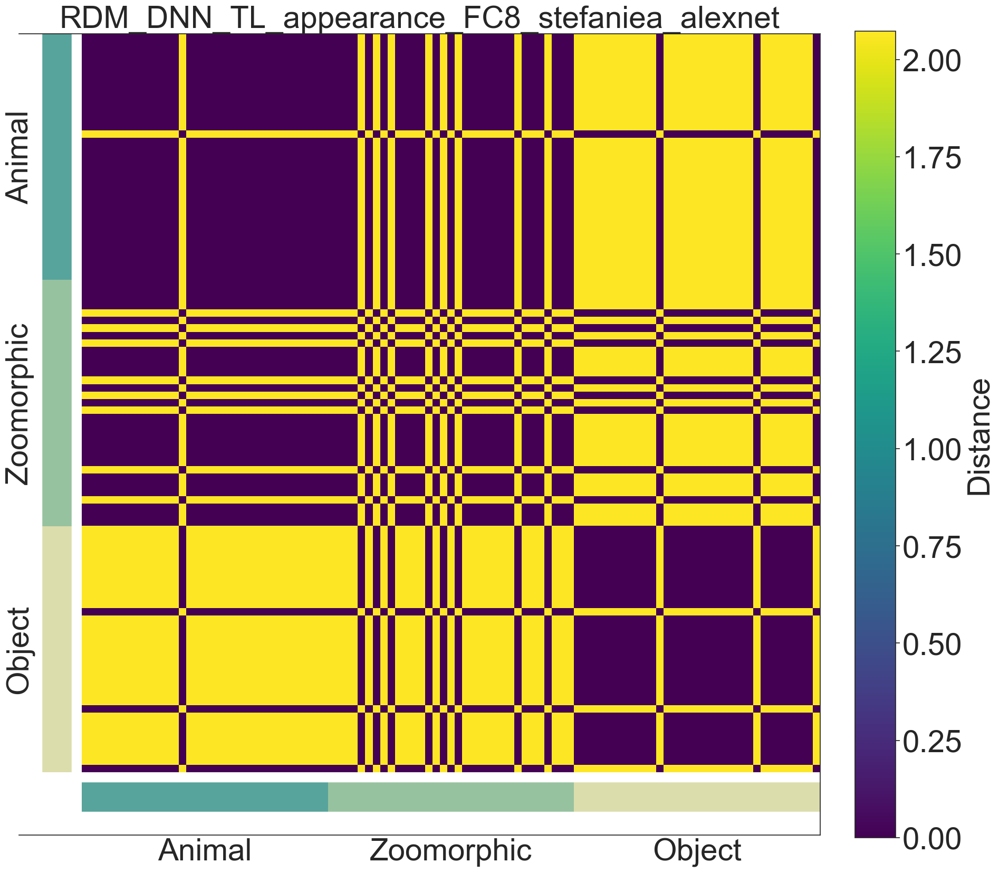

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

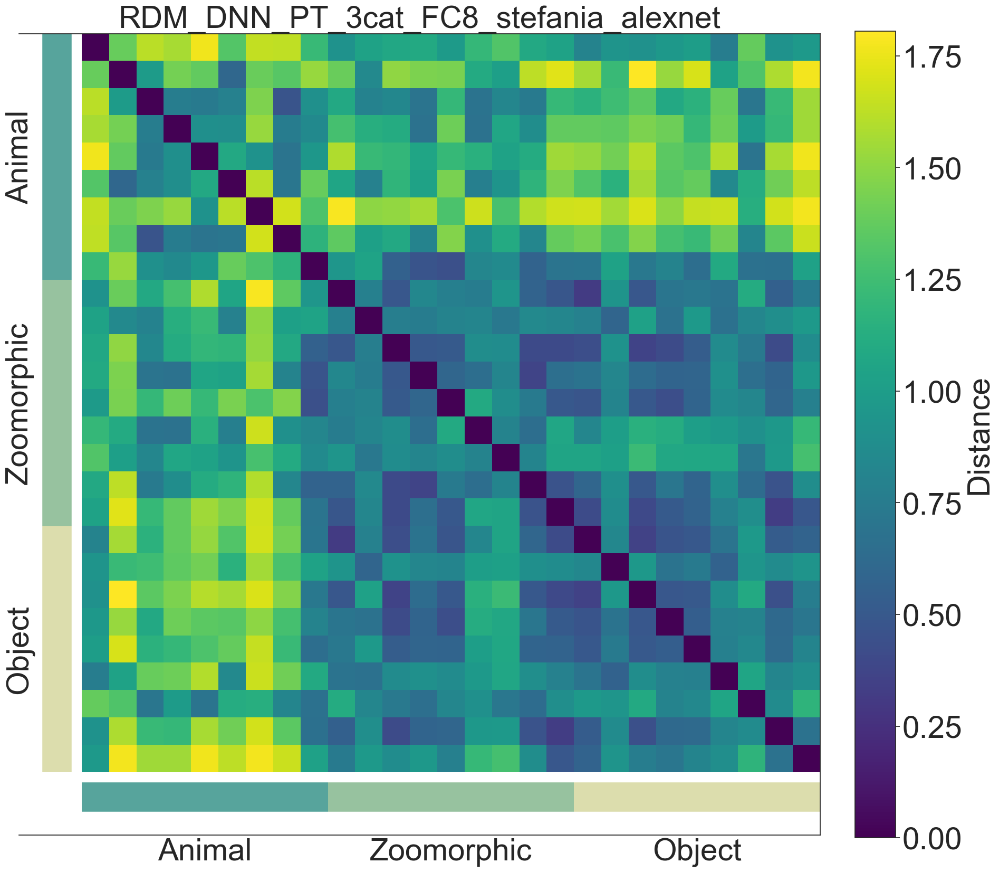

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

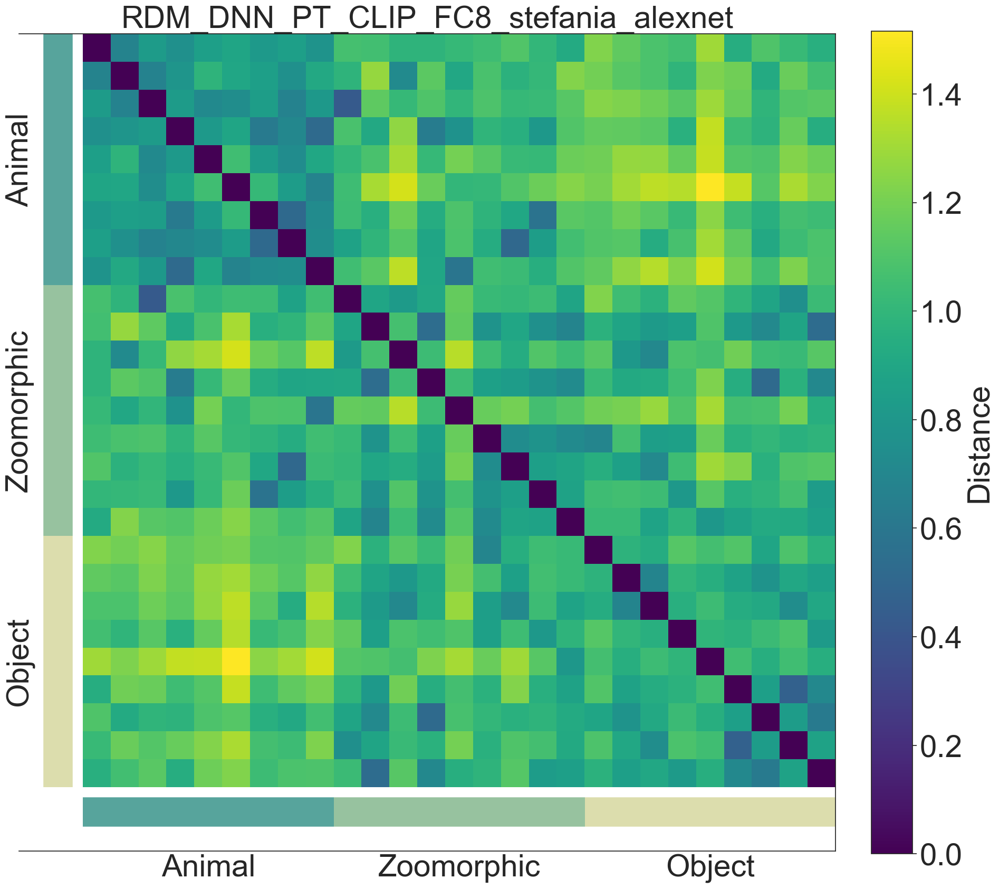

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

In [4]:
# create a color plot of each RDM
def colored_RDM(data, title):
    fig, ax = plt.subplots(figsize=(20,20))
    fontsize = 42
    Labels = ["Animal", "Zoomorphic", "Object"] #labels of the num_categories

    plt.setp(ax.get_yticklabels(), fontsize=fontsize)
    plt.rc('font', size=fontsize)          # controls default text sizes
    plt.rc('axes', titlesize=fontsize)     # fontsize of the axes title
    plt.rc('axes', labelsize=fontsize)    # fontsize of the x and y labels
    plt.rc('xtick', labelsize=fontsize)    # fontsize of the tick labels
    plt.rc('ytick', labelsize=fontsize)    # fontsize of the tick labels
    plt.rc('legend', fontsize=fontsize)    # legend fontsize
    plt.rc('figure', titlesize=fontsize)  # fontsize of the figure titl

    im = ax.imshow(data, cmap='viridis', extent = [0,3,0,3])

    # We want to show all ticks...
    ax.set_xticks(np.arange(0.5,3,1))
    ax.set_yticks(np.arange(0.5,3,1))

    # ... and label them with the respective list entries
    ax.set_xticklabels(Labels)
    ax.set_yticklabels(np.flip(Labels))

    #title above plot:
    working_title = title
    plt.title(working_title, fontsize = fontsize)   

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_yticklabels(), rotation=90, 
             fontsize=fontsize, rotation_mode="anchor", ha="center")
    plt.setp(ax.get_xticklabels(), 
             fontsize=fontsize, rotation_mode="anchor", ha="center")
    ax.tick_params(length=0, width=0)

    #add categorie boundaries
    colors2 = ['#57a49c', '#97c29f', '#dcddad']
    ax.hlines(y=-0.1, xmin=0, xmax=1, linewidth=40, color=colors2[0])
    ax.hlines(y=-0.1, xmin=1, xmax=2, linewidth=40, color=colors2[1])
    ax.hlines(y=-0.1, xmin=2, xmax=3, linewidth=40, color=colors2[2])

    ax.vlines(x=-0.1, ymin=0, ymax=1, linewidth=40, color=colors2[2])
    ax.vlines(x=-0.1, ymin=1, ymax=2, linewidth=40, color=colors2[1])
    ax.vlines(x=-0.1, ymin=2, ymax=3, linewidth=40, color=colors2[0])


    cb = fig.colorbar(im, fraction=0.046, pad=0.04)
    cb.ax.tick_params(labelsize=fontsize)
    cb.ax.set_ylabel('Distance', rotation=90)
    for spine in plt.gca().spines.values():
        spine.set_visible(False)
        plt.tight_layout()   
        #plt.savefig(os.path.join(pathway, title + '.jpg'), bbox_inches='tight', dpi = 600)
        plt.show()
        


for index, row in data.iterrows():
    plt.rcParams["font.family"] = "Arial"
    np.fill_diagonal(row['normalized_matrix'],0) #
    
    colored_RDM(row['normalized_matrix'], row['filenameshort']) #function to print RDM    
    

## CORRELATION WITH INDEPENDENT ANIMAL AND OBJECT BIAS MODELS

### Make independent models

In [5]:
def makemodels(nexemplars, whichmodel):
    if whichmodel == 'objectbias':
        model = np.ones([3*nexemplars, 3*nexemplars])
        model.fill(2)
        model[0:nexemplars,0:nexemplars] = 0 
        model[nexemplars:nexemplars*3,nexemplars:nexemplars*3] = 0 
    elif whichmodel == 'animalbias':
        model = np.ones([3*nexemplars, 3*nexemplars])
        model.fill(2)
        model[2*nexemplars:3*nexemplars,2*nexemplars:3*nexemplars] = 0 #anim-anim
        model[0:nexemplars*2,0:nexemplars*2] = 0 
    return model 

models = ['objectbias', 'animalbias'] 
stimsetsize = 33
independentmodels = []
for mod in models:
        Rdm = makemodels(stimsetsize, mod)
        temp_dict = {}
        temp_dict['model'] = mod
        temp_dict['RDM'] = Rdm
        independentmodels.append(temp_dict)
        
independentmodels = pd.DataFrame(independentmodels)


### Correlate each RDM (FC8 - alexnet&CLIP) with both independent models

In [6]:
#### PERMUATION STAT AND BOOTSTRAP
data_slice = data.copy()
data_slice = data_slice[(data_slice["dnn_model"] == 'alexnet') & (data_slice['extraction_layer'] == 'FC8')& (data_slice["number_test_items"] == 33)]

model_corr = []
model_corr2 = []
for index, row in data_slice.iterrows(): 
    temp0 = row['normalized_matrix'].copy()
    
    np.fill_diagonal(temp0, np.nan)

    for i in range(temp0.shape[0]):
        for j in range(i + 1, temp0.shape[1]):
            temp0[i, j] = np.nan

    print(temp0)

    #z=np.where(temp0 == 0)
    #temp0[np.tril_indices(temp0.shape[0], 0)] = np.nan # DNN RDM
  
    corrs = []
    for index2, row2 in independentmodels.iterrows():
        model = row2['RDM'].copy()
        model[np.tril_indices(model.shape[0], 0)] = np.nan
       
        #PREPARE DATA BY LEAVING OUT NAN
        X = [x for x in temp0.flatten() if math.isnan(x) == False]
        Y = [x for x in model.flatten() if math.isnan(x) == False]
        print('size X: ', np.size(X))
        print('size Y: ' ,np.size(Y))
        
        #BOOTSTRAP TO OBTAIN SE
        def my_statistic(X, Y):
            return pearsonr(X, Y)[0]
        
        rng = np.random.default_rng()
        res = bootstrap((X, Y), my_statistic, vectorized=False, paired=False, 
                 random_state=rng, method = 'percentile')
        print(res.standard_error.round(3))
        
        #PERMUTATION
        [r, p, z] = mantel.test(X, Y, perms=10000, method='pearson') 
        temp_dict= {}
        temp_dict['perm corr'] = r
        temp_dict['p_value'] = p
        temp_dict['se'] = res.standard_error.round(3)
        temp_dict['test_set'] = row['test_set']
        temp_dict['dnn_model'] = row['dnn_model']
        temp_dict['condition'] = row['condition']
        temp_dict['layer'] = row['extraction_layer']
        temp_dict['model'] = row2['model']
        model_corr.append(temp_dict)

model_corr_df = pd.DataFrame(model_corr)
#model_corr_df.to_csv(os.path.join(StudyDir,'Stats', modelofinterest, "Model_correlations_2.csv"))



[[       nan        nan        nan ...        nan        nan        nan]
 [0.29153571        nan        nan ...        nan        nan        nan]
 [0.90602165 0.93437171        nan ...        nan        nan        nan]
 ...
 [1.17518342 1.03769133 1.10708022 ...        nan        nan        nan]
 [1.03715938 0.94033585 1.14375905 ... 0.63335899        nan        nan]
 [1.33403396 1.25368722 1.35934548 ... 0.76451498 0.62416592        nan]]
size X:  4851
size Y:  4851
0.014
size X:  4851
size Y:  4851
0.014
[[       nan        nan        nan ...        nan        nan        nan]
 [0.31998929        nan        nan ...        nan        nan        nan]
 [1.51949613 1.51064848        nan ...        nan        nan        nan]
 ...
 [1.14340854 1.24574345 0.82162733 ...        nan        nan        nan]
 [1.21565567 1.38713984 1.40320128 ... 0.78316251        nan        nan]
 [1.38513931 1.61408623 1.47887722 ... 1.05812184 0.61509146        nan]]
size X:  4851
size Y:  4851
0.014
size X:  4

### For each DNN model, we evaluate whether the permuted correlations with both independent models are significantly different from each other.

In [7]:
def permutation_pairedttest_correlations(data1, data2, data3):
    '''
    - run the n permutations for the two models as you did before. At this point you have 10000 r values for each model.
    - for each permutation compute subtraction of the absolute values between the two models (e.g., animal bias minus object bias)
    - now you have 10000 values derived from the abs difference between the two models
    - now you can compare your true value derived from the subtraction between your 2 original r values against this distribution of 10000 values.
    - calculate significance as usual (how many values from the 10000 are higher relative to your original value?
    '''

    # data1 = X # flattende RDM DNN
    # data2 = Y # flattened animal bias model
    # data3 = Z #flattened oject bias model
    
    data1 = np.asarray(data1)
    data2 = np.asarray(data2)
    data3 = np.asarray(data3)
    
    corrs_dif_ori = abs(np.corrcoef(data1, data2)[0,1] - np.corrcoef(data1, data3)[0,1])
    
    # construct the simulated sampling distribution
    corrs_dif = []
    
    for _ in range(10000):
        np.random.shuffle(data1)
        np.random.shuffle(data2)
        np.random.shuffle(data3)
        
        corrs_dif.append(abs(np.corrcoef(data1, data2)[0,1] - np.corrcoef(data1, data3)[0,1]))
    
   
    count = 0
    for corrdif in corrs_dif:
          if corrdif > corrs_dif_ori: 
             count = count + 1
             
    p = count/10000
    
    return p


In [8]:
#### PERMUATION STAT AND BOOTSTRAP PAIRED TTEST BETWEEN MODELS
data_slice = data.copy()
data_slice = data_slice[(data_slice["dnn_model"] == 'alexnet') & (data_slice["extraction_layer"] == 'FC8') & (data_slice["number_test_items"] == 33)]

model_corr_PAIRED = []
for index, row in data_slice.iterrows(): 
    temp0 = row['normalized_matrix'].copy()
    temp0[np.tril_indices(temp0.shape[0], 0)] = np.nan # DNN RDM
    X = [x for x in temp0.flatten() if math.isnan(x) == False]
    
    modela = independentmodels['RDM'][0].copy()
    modela[np.tril_indices(modela.shape[0], 0)] = np.nan
    Y = [x for x in modela.flatten() if math.isnan(x) == False]
    
    modelo = independentmodels['RDM'][1].copy()
    modelo[np.tril_indices(modelo.shape[0], 0)] = np.nan
    Z = [x for x in modelo.flatten() if math.isnan(x) == False]
    
    ## PERMUTATION TO DETERMINE WETHER BOTH MODELS ARE SIGN DIFF:
    P = permutation_pairedttest_correlations(X,Y,Z)
    
    temp_dict= {}
    temp_dict['p_value'] = P
    temp_dict['test_set'] = row['test_set']
    temp_dict['dnn_model'] = row['dnn_model']
    temp_dict['condition'] = row['condition']
    temp_dict['layer'] = row['extraction_layer']
    model_corr_PAIRED.append(temp_dict)

model_corr_paired_df = pd.DataFrame(model_corr_PAIRED)
model_corr_paired_df
#model_corr_paired_df.to_csv(os.path.join(StudyDir,'Stats', modelofinterest, "Model_correlations_paired.csv"))


,p_value,test_set,dnn_model,condition,layer
0,0.0000,stefaniea,alexnet,ECOSET,FC8
1,0.0000,stefaniea,alexnet,IN,FC8
2,0.0000,stefaniea,alexnet,Recurrent,FC8
3,0.0000,stefaniea,alexnet,facebodyobject,FC8
4,0.0000,stefaniea,alexnet,animacynoll,FC8
5,0.7352,stefaniea,alexnet,CLIP,FC8
6,0.0000,stefaniea,alexnet,animacy,FC8
7,0.0000,stefaniea,alexnet,SIN,FC8
8,0.0000,stefaniea,alexnet,appearance,FC8


### GRAPHICAL ILLUSTRATION CORRELATIONS

                                  mean
Network               Model           
FT Animacy            animalbias  0.01
                      objectbias  0.09
FT Animal bias        animalbias  0.08
                      objectbias -0.18
FT Face-body-object   animalbias  0.02
                      objectbias  0.11
FT Object bias        animalbias  0.04
                      objectbias  0.08
Image Encoder CLIP    animalbias  0.06
                      objectbias -0.10
PT Ecoset             animalbias  0.04
                      objectbias  0.05
PT ImageNet           animalbias  0.03
                      objectbias  0.07
PT Stylized ImageNet  animalbias  0.01
                      objectbias  0.12
Recurrent PT ImageNet animalbias -0.01
                      objectbias  0.10
                                  mean
Network               Model           
FT Animacy            animalbias  0.69
                      objectbias  0.00
FT Animal bias        animalbias  0.00
                      obj

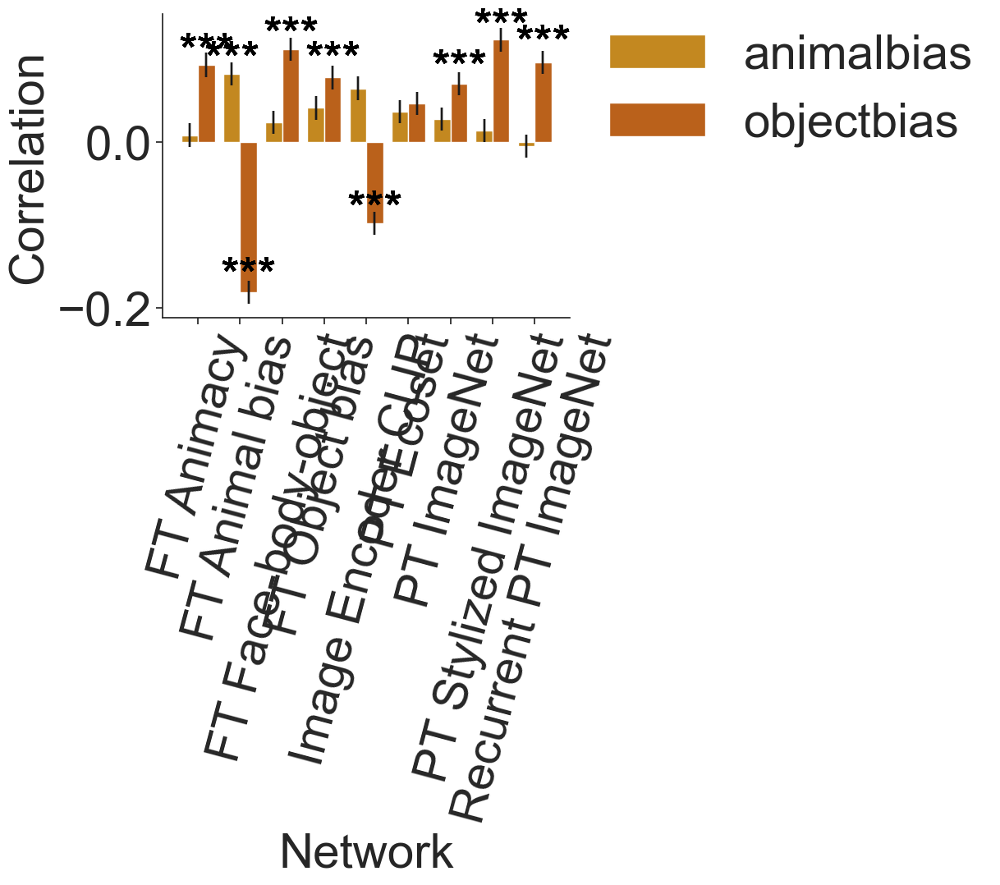

In [15]:
#graph_df = model_corr_df[(
#    (model_corr_df['layer'] =='FC8') & 
#    (model_corr_df['test_set'] =='stefaniea') 
#)]


graph_df = model_corr_df.rename(columns = {'perm corr': 'Correlation','layer': 'Layer', 'condition': 'Network', 'model': 'Model'}, inplace = False)
graph_df['Network'] = graph_df['Network'].str.replace('SIN','PT Stylized ImageNet')
graph_df['Network'] = graph_df['Network'].str.replace('IN','PT ImageNet')
graph_df['Network'] = graph_df['Network'].str.replace('animacynoll','FT Animacy')
graph_df['Network'] = graph_df['Network'].str.replace('animacy','FT Object bias')
graph_df['Network'] = graph_df['Network'].str.replace('appearance','FT Animal bias')
graph_df['Network'] = graph_df['Network'].str.replace('CLIP','Image Encoder CLIP')
graph_df['Network'] = graph_df['Network'].str.replace('ECOSET','PT Ecoset')
graph_df['Network'] = graph_df['Network'].str.replace('facebodyobject','FT Face-body-object')
graph_df['Network'] = graph_df['Network'].str.replace('Recurrent','Recurrent PT ImageNet')

graph_df['Model'] = graph_df['Model'].str.replace('animacy','Object bias model')
graph_df['Model'] = graph_df['Model'].str.replace('appearance','Animal bias model')


graph_df = graph_df.sort_values(by=['Network', 'Model'])
info =graph_df.groupby(['Network', 'Model'])['Correlation'].agg(['mean']).round(2)
print(info)

info_p =graph_df.groupby(['Network', 'Model'])[ 'p_value'].agg(['mean']).round(2)
print(info_p)

#Order_legend = ['FT Animacy', 'FT Animal bias', 'FT Face-body-object', 'FT Object bias', 'PT Ecoset', 'PT ImageNet', 'PT Stylized ImageNet']
sns.set_palette(sns.color_palette([colors2[1], colors2[3]]))
sns_plot = sns.barplot(x="Network", y="Correlation", hue="Model", data=graph_df, errwidth=1, ci=68)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0, frameon=False)
sns.despine() #get rid of box

for item in sns_plot.get_xticklabels():
    #plt.figure(figsize=(100, 100))
    item.set_rotation(75)

    xCoord = [-0.2, 0.2, 0.8, 1.2, 1.8, 2.2, 2.8, 3.2, 3.8, 4.2, 4.8, 5.2, 5.8, 
              6.2, 6.8, 7.2, 7.8, 8.2]
    yCoord = info['mean'].tolist()
    pVal = info_p['mean'].tolist()
    for x,y,p in zip(xCoord, yCoord,pVal):
        if (p < 0.0001):
            sns_plot.text(x,y, '***', color='black', ha="center")
        elif (p > 0.0001) & (p < 0.001):
            sns_plot.text(x,y, '**', color='black', ha="center")
        elif (p > 0.001) & (p < 0.01):
            sns_plot.text(x,y, '*', color='black', ha="center")

    x_coords = [p.get_x() + 0.5*p.get_width() for p in sns_plot.patches]
    y_coords = [p.get_height() for p in sns_plot.patches]
    plt.errorbar(x=x_coords, y=y_coords, yerr=graph_df["se"], fmt="none", c= "k")

    fig = sns_plot.get_figure()
    #fig.savefig(os.path.join(PlotDir, modelofinterest, lay + "_" + "Modelcorr_DNN.png"), bbox_inches='tight', dpi = 600)
    #plt.close(fig)


## ANIMAL<>ZOOMORPHIC vs. ZOOMORPHIC<>OBJECT

In [16]:
data_slice = data.copy()
data_slice = data_slice[(data_slice["dnn_model"] == 'alexnet') & (data_slice['extraction_layer'] == 'FC8') & (data_slice["number_test_items"] == 33)]

# 1. Make dataset for analyses
#FLATTENED DATAFRAME WITH A MEAN DISS SCORE FOR EACH IMAGE
#flattened means that each row containing a matrix in the DNN_data will be expanded so that each row now
# is a stimulus. This is done for statistic analyses. 
lijst3 = []
for index, row in data_slice.iterrows(): #go over each row of the dataframe
    ntestitems = row['number_test_items']
    temp_test = row['normalized_matrix']
    
    temp_dict = {}
    a = np.array(np.nanmean(temp_test[np.ix_(range(ntestitems), range(ntestitems,ntestitems*2))],1))
    b = np.array(np.nanmean(temp_test[np.ix_(range(ntestitems,ntestitems*2), range(ntestitems*2,ntestitems*3))],1))
    temp_dict['dissim_score'] = np.hstack((a,b))
    temp_dict['layer'] = np.repeat(row.extraction_layer,ntestitems*2)
    temp_dict['netwerk'] = np.repeat(row.dnn_model,ntestitems*2)
    temp_dict['condition'] = np.repeat(row.condition,ntestitems*2)
    temp_dict['test_set'] = np.repeat(row.test_set,ntestitems*2)
    temp_dict['image_ID'] = np.tile(np.array(range(ntestitems)), 2)
    temp_dict['pair'] = np.repeat(['between_animals_lookalikes','between_lookalikes_object'], ntestitems)

    lijst3.append(temp_dict)
    
df = pd.DataFrame(lijst3)
#flatten dataframe
df2 = df.apply(lambda x: x.explode() if x.name in ['dissim_score', 'pair', 'netwerk', 'condition', 'test_set', 'image_ID', 'layer'] else x)

df2.info() #dissim_score is obj/string type
# convert the 'Date' column to datetime format
df2['dissim_score'] = pd.to_numeric(df2['dissim_score'],errors='coerce')
#df2.to_pickle(os.path.join(StudyDir, "DNN_data_expanded.pkl"))
del lijst3, row, ntestitems, temp_test, temp_dict, a, b


<class 'pandas.core.frame.DataFrame'>
Int64Index: 594 entries, 0 to 8
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   dissim_score  594 non-null    object
 1   layer         594 non-null    object
 2   netwerk       594 non-null    object
 3   condition     594 non-null    object
 4   test_set      594 non-null    object
 5   image_ID      594 non-null    object
 6   pair          594 non-null    object
dtypes: object(7)
memory usage: 37.1+ KB


#### The statistics reported in the paper are the result of a two-way aligned and ranked transformed ANOVA with external software.

Cfr. https://real-statistics.com/two-way-anova/aligned-rank-transform-art-anova/ 

1. For each model, a csv file is needed with 4 columns, like this example: 

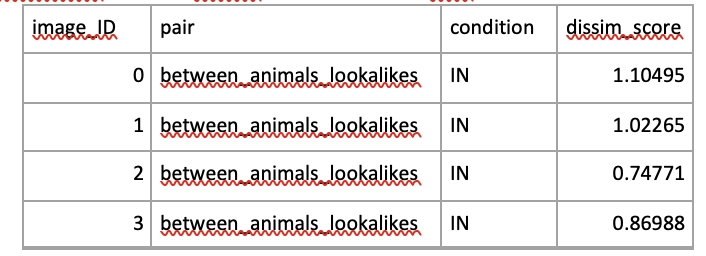

See OSF for all csv files: https://osf.io/7xcg9/


2. All csv files need to be loaded into ARTool:
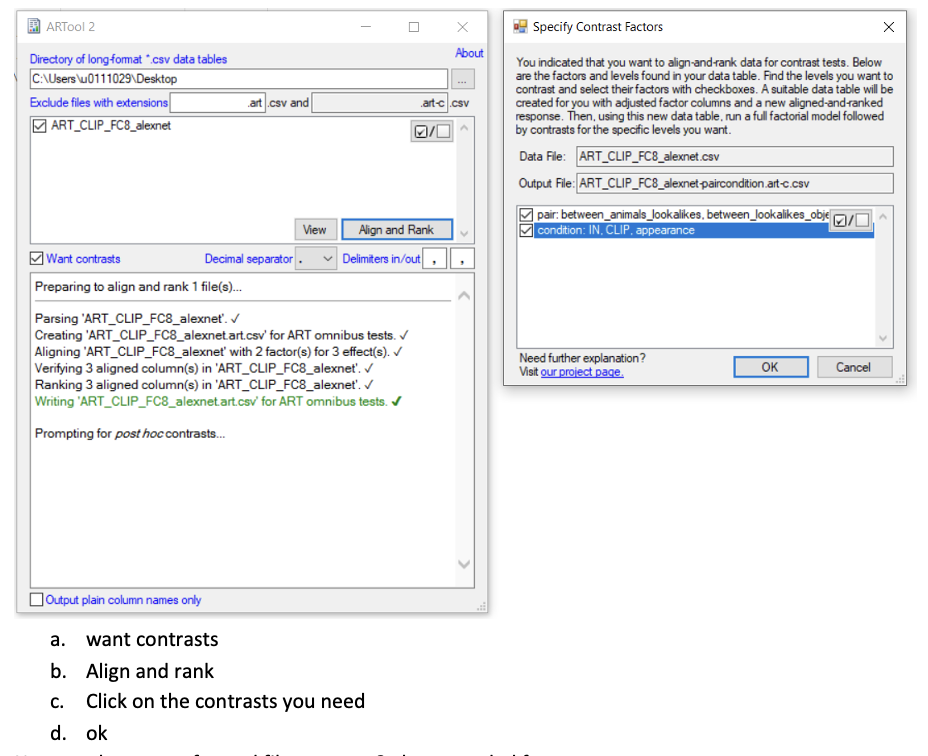

3.	Now you have transformed files .art.csv & those needed for contrasts
See OSF for all output files: https://osf.io/7xcg9/

4.	Do the analyses in python like described on the website of ARTool 
The next paragraph performs the analyses based on the ARTfiles, which can be found here: https://osf.io/7xcg9/

In [17]:
"""
ART
You have a continuous response Y and two factors, X1 and X2. Using ARTool, 
you create three aligned responses, Yaligned for X1, Yaligned for X2, and Yaligned 
for X1 × X2. Then these three columns are each ranked by ARTool, resulting in three 
additional columns: Yart for X1, Yart for X2, and Yart for X1 × X2. Then you run 
three separate full-factorial ANOVAs. The first ANOVA has Yart for X1 as the response, 
so in the ANOVA table, you only regard the main effect of X1. The second ANOVA has 
Yart for X2 as the response, so in the ANOVA table, you only regard the main effect 
of X2. The third ANOVA has Yart for X1 × X2 as the response, so in the ANOVA table, 
you only regard the X1 × X2 interaction. In all three ANOVAs, the model factors 
are X1, X2, and X1 × X2.
"""

#set pathways
#dir to ART csv files
HomeDir = "/Users/duyckstefanie/Documents/Study4_forsharing/Results/LR01/Stats/ARTool_output"
#SaveDir = "/Users/duyckstefanie/Library/CloudStorage/OneDrive-KULeuven/Documents/Study4_forsharing/Results/LR01/Stats/alexnet"


#Get list of all relevant files
filesLIST = [] #a list with all dicts
filesLISTcomp = [] #a list with all dicts
for root,dirs,files in os.walk(HomeDir):
    for file in files:
        if file.endswith("paircondition.art-c.csv"): 
            filesLISTcomp.append(os.path.join(HomeDir, file))
        else:#if file.endswith("alexnet.art.csv"): 
            filesLIST.append(os.path.join(HomeDir, file))
        
# for each file:
filesLIST.sort()
filesLISTcomp.sort()
for f, f2 in zip(filesLIST, filesLISTcomp):
    
    #load data
    dataset = pd.read_csv(f)
    f = f[:-4]
    items = f.split('/') #!!!!! mac / VERSUS WINDOWS \
    name = items[-1]
    print(name)
    
    # Perform 3 sep ANOVA's with the art
    print("ONLY LOOK AT MAIN EFFECT PAIR: ")
    aov1 = pg.rm_anova(dv='ART(dissim_score) for pair',
                      within=['pair', 'condition'],
                      subject='image_ID', data=dataset)
    #aov1.to_csv(os.path.join(SaveDir, 'ART_RM_ANOVA_' + name + ".csv" ))  
    pg.print_table(aov1)
    
    print("ONLY LOOK AT MAIN EFFECT CONDITION: ")
    aov2 = pg.rm_anova(dv='ART(dissim_score) for condition',
                      within=['pair', 'condition'],
                      subject='image_ID', data=dataset)
    #aov2.to_csv(os.path.join(SaveDir, 'ART_RM_ANOVA_' + name + ".csv"), mode='a')
    pg.print_table(aov2)
    
    print("ONLY LOOK AT INTERACTION EFFECT: ")
    aov3 = pg.rm_anova(dv='ART(dissim_score) for pair*condition',
                      within=['pair', 'condition'],
                      subject='image_ID', data=dataset)
    #aov3.to_csv(os.path.join(SaveDir, 'ART_RM_ANOVA_' + name + ".csv"), mode='a')
    pg.print_table(aov3)
     
     
    # post hoc
    '''
    In our most recent work, we have extended the ART procedure with an additional procedure we refer to as ART-C (Elkin et al. 2021). 
    ART-C is an additional align-and-rank procedure to facilitate post hoc pairwise comparisons. As it turns out, you cannot use regular 
    Yart responses for post hoc pairwise comparisons without inflating Type I error rates. The ART-C procedure allows you to indicate 
    which factor(s) have levels that you would like to compare, and ARTool creates additional aligned-and-ranked responses precisely 
    for those comparisons.
    Example: You have a continuous response Y and three factors, X1, X2, and X3. Each of these factors has two levels, 
    with X1={a, b}, X2={c, d}, and X3={e, f}. So, your study employs a 2 × 2 × 2 factorial design. Using ARTool, you discover a 
    significant X1 × X2 interaction. You also discover that X3 is non-significant, either alone or in interactions. Therefore, you 
    wish to compare levels from X1 and X2, e.g., condition (a,c) vs. (b,d). To do this, you use ARTool's new contrasts feature and 
    indicate X1 and X2 as the contrast factors. ARTool produces a separate data table for you with two factors. The first factor 
    we'll call X12, a single "concatenated factor" whose levels are concatenated from those of X1 and X2: {ac, ad, bc, bd}. 
    The second factor is X3, unchanged with its original levels {e, f}, because it was not indicated as a contrast factor. 
    The new response column is Yart-c for X12. Now, in your favorite statistics software, you run a full-factorial model on 
    Yart-c for X12 with factors X12, X3, and X12 × X3. You ignore the omnibus test results but, within this model, you request 
    the post hoc pairwise comparisons you desire within X12. For example, to compare (a, c) vs. (b, d), you compare X12's 
    levels "ac" and "bd". This test will have appropriate Type I errors and power. Of course, if you conduct multiple such 
    comparisons, you should apply a correction, e.g., Holm's sequential Bonferroni procedure (Holm 1979)."
    '''
    #load data
    dataset2 = pd.read_csv(f2)
    f2 = f2[:-4]
    items = f2.split('\\')
    name2 = items[-1]
    #print(name2)
    
    posthocs = pg.pairwise_ttests(dv='ART-C(dissim_score) for paircondition', within=['paircondition'],
                                                      subject='image_ID', padjust='fdr_bh', data=dataset2)
    #pg.print_table(posthocs)
    #posthocs.to_csv(os.path.join(SaveDir, 'ART_RM_ANOVA_' + name + ".csv"), mode='a')
                    

ART_CLIP_FC8_alexnet.art
ONLY LOOK AT MAIN EFFECT PAIR: 

ANOVA SUMMARY

Source                    SS    ddof1    ddof2          MS       F    p-unc    p-GG-corr    np2    eps
----------------  ----------  -------  -------  ----------  ------  -------  -----------  -----  -----
pair              220200.045        1       32  220200.045  80.254    0.000        0.000  0.715  1.000
condition            226.939        2       64     113.470   0.058    0.944        0.927  0.002  0.890
pair * condition   10731.303        2       64    5365.652   2.425    0.097        0.104  0.070  0.888

ONLY LOOK AT MAIN EFFECT CONDITION: 

ANOVA SUMMARY

Source                   SS    ddof1    ddof2         MS      F    p-unc    p-GG-corr    np2    eps
----------------  ---------  -------  -------  ---------  -----  -------  -----------  -----  -----
pair               9800.247        1       32   9800.247  2.742    0.108        0.108  0.079  1.000
condition         37411.485        2       64  18705.742  

### GRAPHICAL DISPLAY OF RESULTS

In [18]:
df2

,dissim_score,layer,netwerk,condition,test_set,image_ID,pair
0,1.144007,FC8,alexnet,ECOSET,stefaniea,0,between_animals_lookalikes
0,1.046277,FC8,alexnet,ECOSET,stefaniea,1,between_animals_lookalikes
0,1.033365,FC8,alexnet,ECOSET,stefaniea,2,between_animals_lookalikes
0,1.247901,FC8,alexnet,ECOSET,stefaniea,3,between_animals_lookalikes
0,1.156219,FC8,alexnet,ECOSET,stefaniea,4,between_animals_lookalikes
...,...,...,...,...,...,...,...
8,1.884615,FC8,alexnet,appearance,stefaniea,28,between_lookalikes_object
8,0.188462,FC8,alexnet,appearance,stefaniea,29,between_lookalikes_object
8,1.884615,FC8,alexnet,appearance,stefaniea,30,between_lookalikes_object
8,1.884615,FC8,alexnet,appearance,stefaniea,31,between_lookalikes_object


In [22]:
# MAKE A TIDY DATAFRAME FOR PLOTTING
df2_tidy = df2.copy()
df2_tidy = df2_tidy.rename(columns = {'dissim_score': 'Distance', 'pair': 'Pair'}, inplace = False)
df2_tidy['Pair'] = df2_tidy['Pair'].str.replace('between_animals_lookalikes','Animal<>Zoomorphic')
df2_tidy['Pair'] = df2_tidy['Pair'].str.replace('between_lookalikes_object','Object<>Zoomorphic')
df2_tidy['condition'] = df2_tidy['condition'].str.replace('SIN','PT Stylized ImageNet')
df2_tidy['condition'] = df2_tidy['condition'].str.replace('CLIP','Image Encoder CLIP')
df2_tidy['condition'] = df2_tidy['condition'].str.replace('ECOSET','PT Ecoset')
df2_tidy['condition'] = df2_tidy['condition'].str.replace('IN','PT ImageNet')
df2_tidy['condition'] = df2_tidy['condition'].str.replace('animacynoll','FT Animacy')
df2_tidy['condition'] = df2_tidy['condition'].str.replace('animacy','FT Object bias')
df2_tidy['condition'] = df2_tidy['condition'].str.replace('appearance','FT Animal bias')
df2_tidy['condition'] = df2_tidy['condition'].str.replace('facebodyobject','FT Face-body-object')


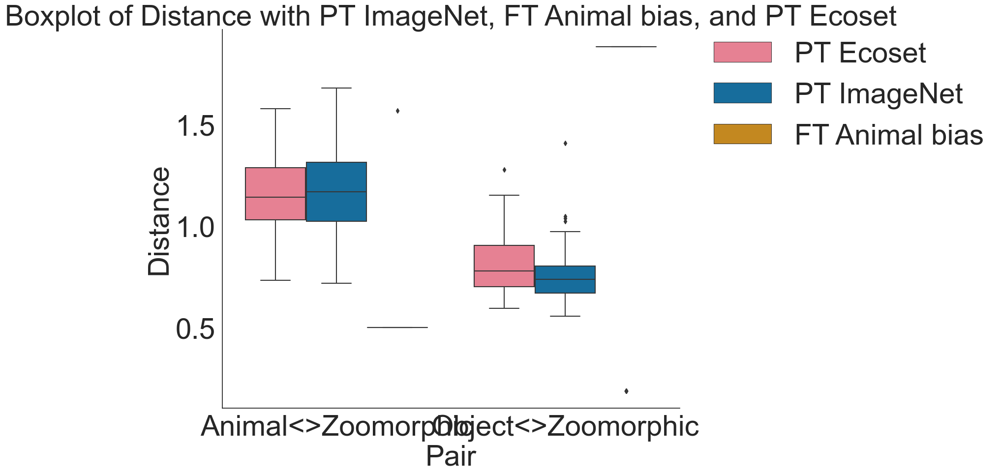

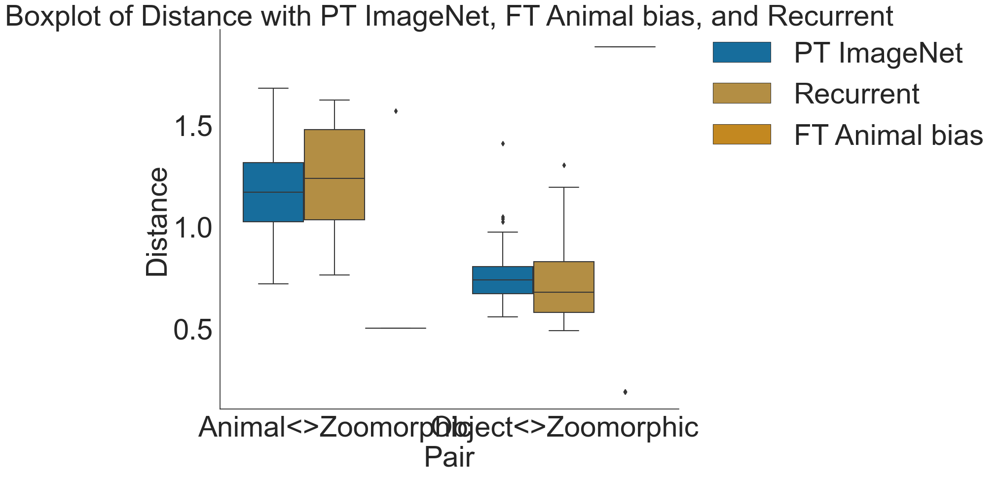

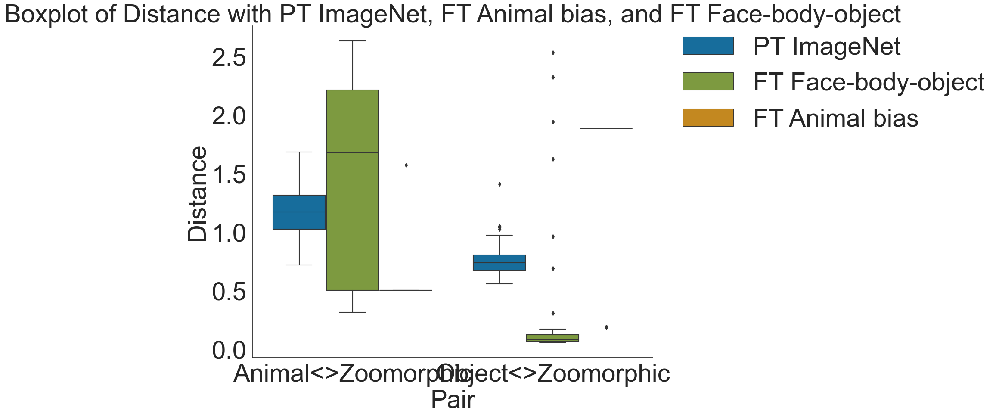

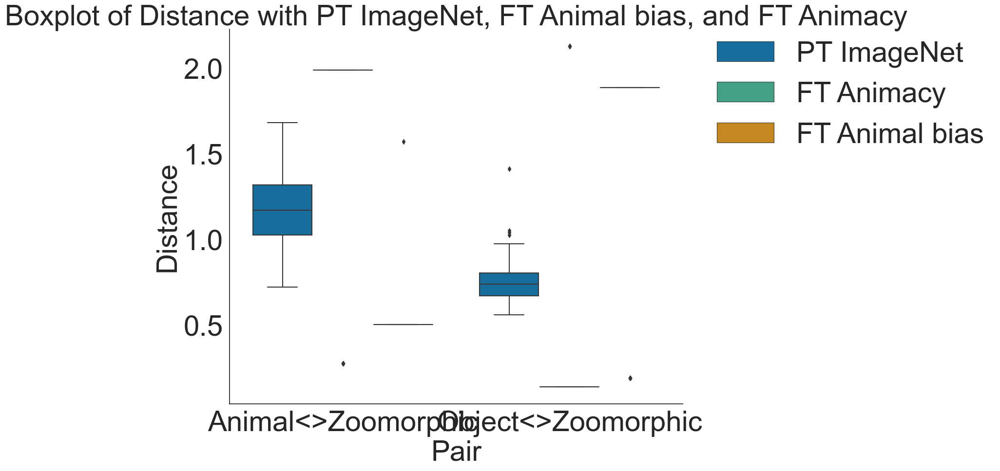

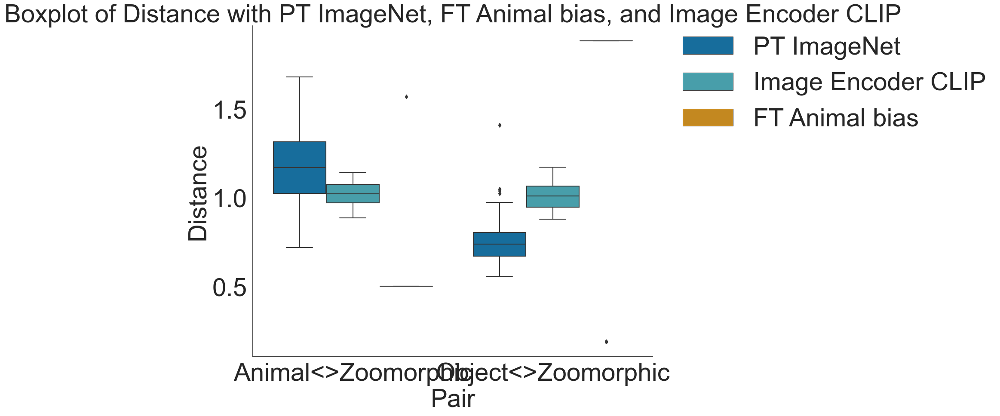

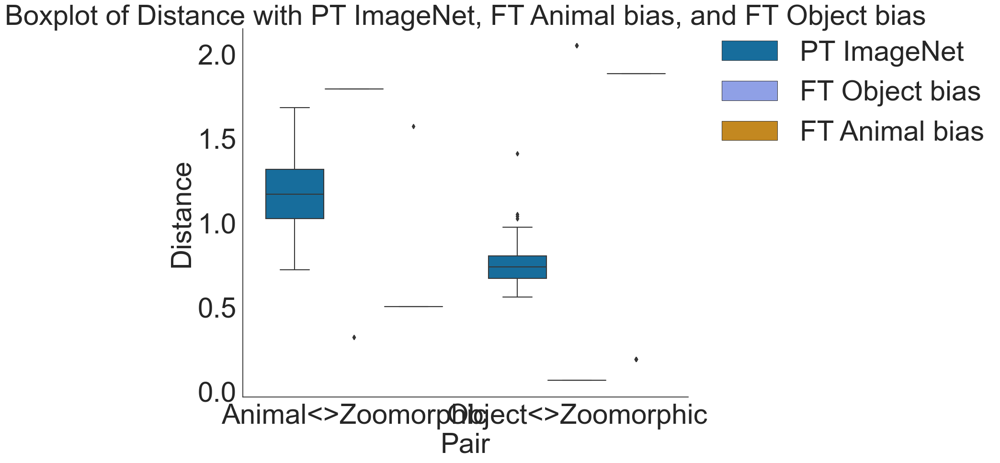

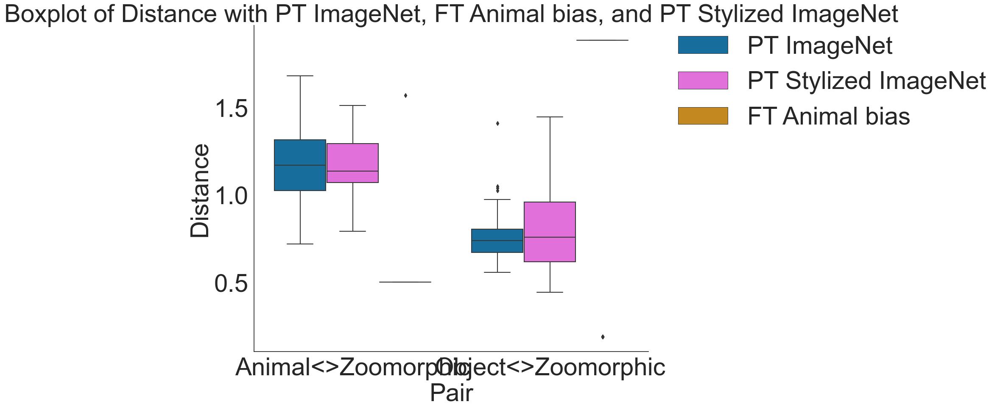

"\nIn this code:\n\nWe use a loop to iterate through the unique conditions in the 'condition' column of the DataFrame.\nFor each condition, we create a new boxplot that includes 'PT ImageNet', 'FT Animal bias', and the current condition.\nThe resulting boxplots will show the variation in 'distance' with 'Pair' for each combination of conditions.\n\n\n"

In [23]:
#### BOXPLOTS 
df = df2_tidy.copy()
#sns.set(font_scale = 1.25)
sns.set_style(style='white')

# Levels 'PT ImageNet' and 'FT Animal bias' are always displayed with one other condition
base_conditions = ['PT ImageNet', 'FT Animal bias']

# Create a color palette with the same colors for base conditions
base_colors = sns.color_palette("colorblind", n_colors=len(base_conditions))
color_dict = {condition: base_colors[i] for i, condition in enumerate(base_conditions)}

# Create different colors and markers for other conditions
all_conditions = df['condition'].unique()
other_conditions = [condition for condition in all_conditions if condition not in base_conditions]
other_colors = sns.color_palette("husl", n_colors=len(other_conditions))
color_dict.update({condition: color for condition, color in zip(other_conditions, other_colors)})

# Iterate through conditions and create boxplots
for condition in df['condition'].unique():
    if condition not in base_conditions:
        # Create a new figure and axis for the boxplot
        plt.figure(figsize=(12, 10))
        ax = plt.gca()

        # Filter the DataFrame to include the base conditions and the current condition
        filtered_df = df[df['condition'].isin(base_conditions + [condition])]

        # Create a boxplot with custom colors
        sns.boxplot(x='Pair', y='Distance', hue='condition', data=filtered_df, palette=color_dict, ax=ax)

        # Customize the plot
        plt.title(f'Boxplot of Distance with {base_conditions[0]}, {base_conditions[1]}, and {condition}')
        plt.xlabel('Pair')
        plt.ylabel('Distance')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0, frameon=False)
        sns.despine() #get rid of box
        # Show the plot
        plt.show()

        
'''
In this code:

We use a loop to iterate through the unique conditions in the 'condition' column of the DataFrame.
For each condition, we create a new boxplot that includes 'PT ImageNet', 'FT Animal bias', and the current condition.
The resulting boxplots will show the variation in 'distance' with 'Pair' for each combination of conditions.


'''



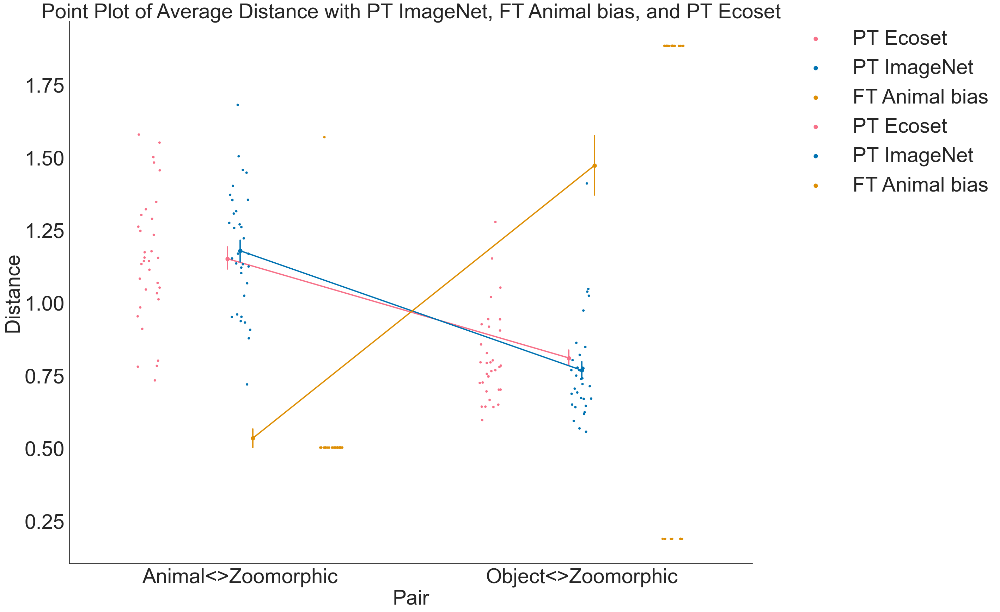

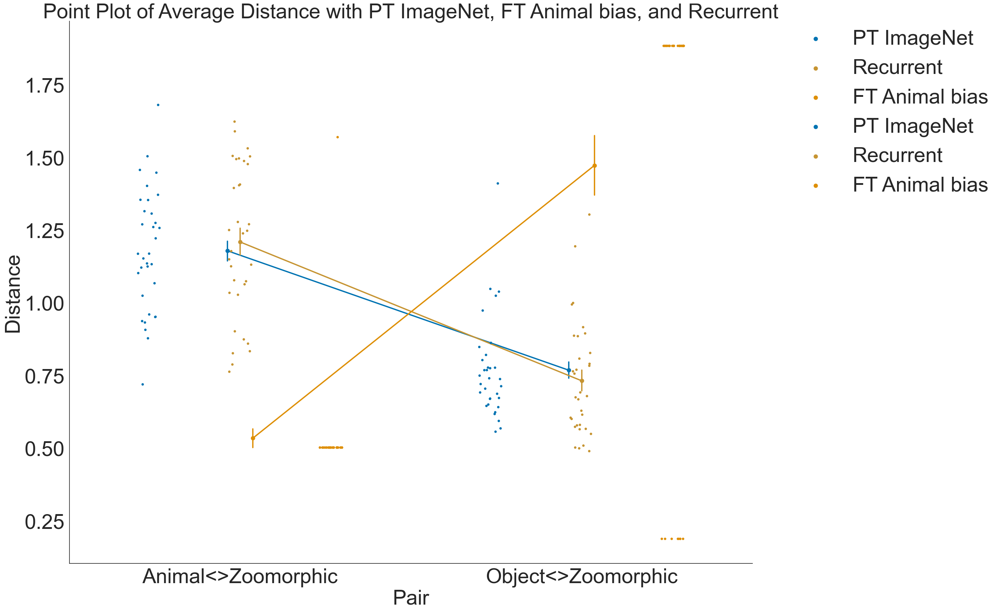

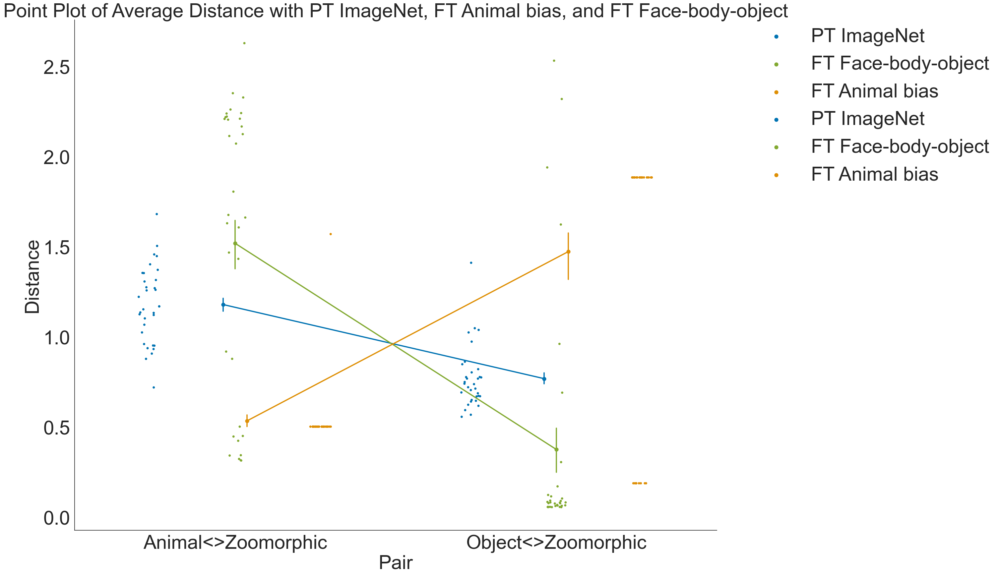

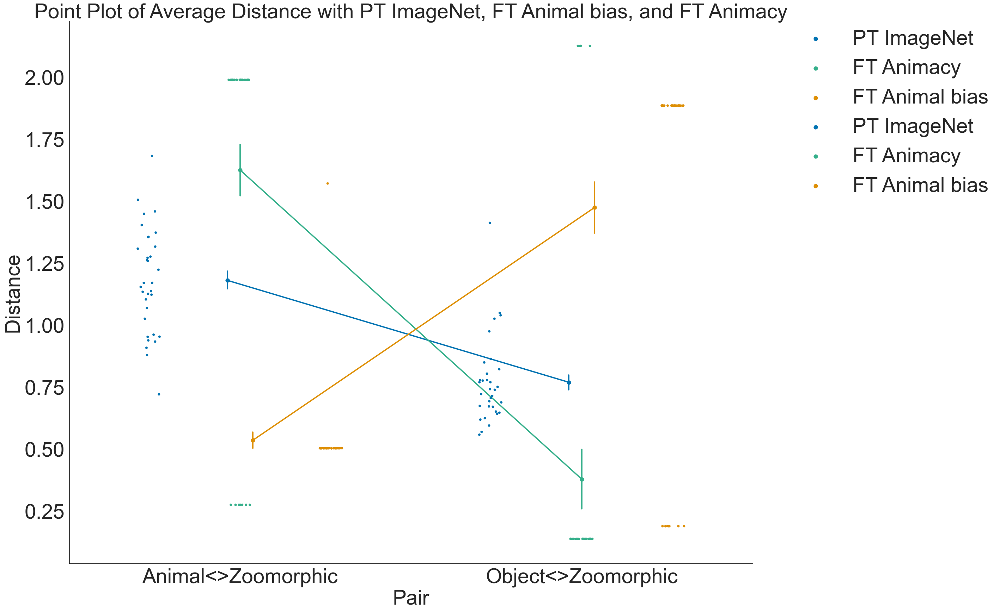

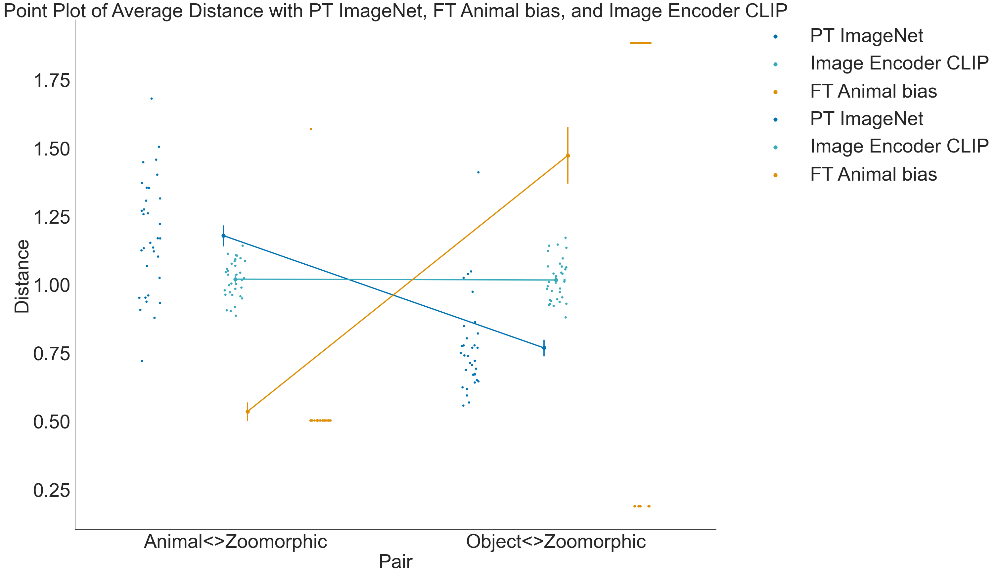

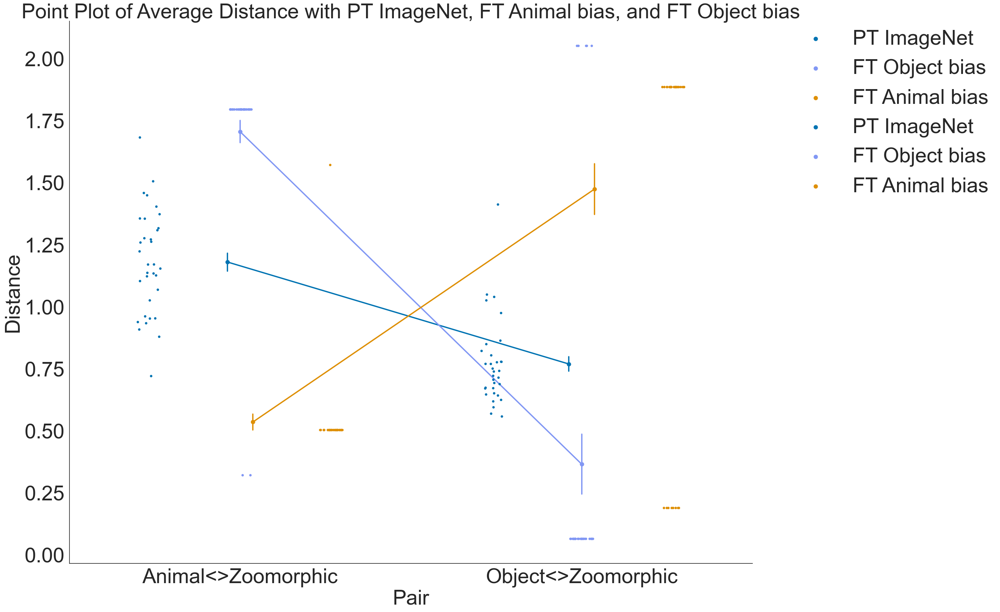

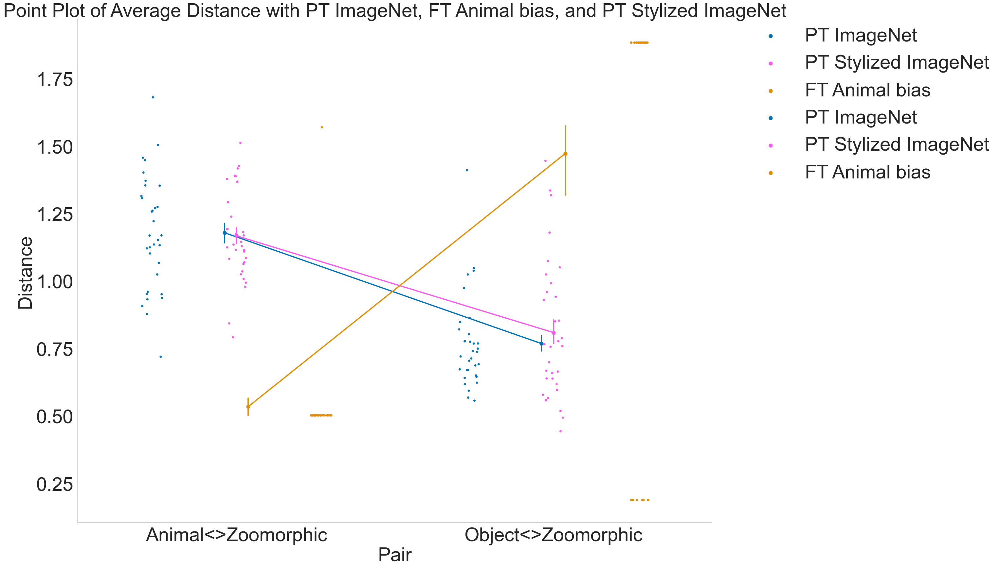

In [24]:
#### VERSION WITH POINT PLOT WITH SOME INDICATION OF INDIVIDUAL DATAPOINTS

df = df2_tidy.copy()

# Levels 'PT ImageNet' and 'FT Animal bias' are always displayed with one other condition
base_conditions = ['PT ImageNet', 'FT Animal bias']

# Get unique conditions including base conditions
all_conditions = base_conditions + df['condition'].unique().tolist()

# Create a color palette with the same colors for base conditions
base_colors = sns.color_palette("colorblind", n_colors=len(base_conditions))
base_markers = ["*", "^"]

color_dict = {condition: base_colors[i] for i, condition in enumerate(base_conditions)}
marker_dict = {condition: base_markers[i] for i, condition in enumerate(base_conditions)}

# Create different colors and markers for other conditions
other_conditions = [condition for condition in all_conditions if condition not in base_conditions]
other_colors = sns.color_palette("husl", n_colors=len(other_conditions))
other_markers = ["p", "D", "s", "P", "X", "<", ","]  # You can customize markers as needed
color_dict.update({condition: color for condition, color in zip(other_conditions, other_colors)})
marker_dict.update({condition: marker for condition, marker in zip(other_conditions, other_markers)})

# Iterate through conditions and create point plots with error bars
for condition in df['condition'].unique():
    if condition not in base_conditions:
        # Create a new figure and axis for the point plot
        plt.figure(figsize=(25, 20))
        ax = plt.gca()

        # Filter the DataFrame to include the base conditions and the current condition
        filtered_df = df[df['condition'].isin(base_conditions + [condition])]

        # Create a point plot with mean and standard error bars
        sns.pointplot(x='Pair', y='Distance', hue='condition', data=filtered_df, ci=68, palette=color_dict, ax=ax, dodge=True)

        # Create a swarm plot to show individual data points
        #sns.swarmplot(x='Pair', y='Distance', hue='condition', data=filtered_df, palette=color_dict, ax=ax, dodge=True)

        sns.stripplot(x='Pair', y='Distance', hue='condition', data=filtered_df, palette=color_dict, ax=ax, dodge=True)

        # Customize the plot
        plt.title(f'Point Plot of Average Distance with {base_conditions[0]}, {base_conditions[1]}, and {condition}')
        plt.xlabel('Pair')
        plt.ylabel('Distance')
        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0, frameon=False)
        sns.despine() #get rid of box
        fig = sns_plot.get_figure()
        
        # Show the plot
        plt.show()



## LINK WITH BRACCI's NEURAL DATA

This part covers the correlations between the DNN data and Stefania's Bracci's neural data.

For this, only the bracci stimuli extracted by the different network instances are used.

> test_set = 'stefania', with only 9 stimuli.

--- 
INFO ON BRACCI DATA: 

The data file contains !!!correlation!!! matrices employed in representational similarity analysis (RSA) from: brain (3 ROIs), DNNs, and behavioural judgments.

ROI1 = EVC, ROI2 = postVTC, ROI3 = antVTC

Neural dissimilarity matrices (1⫺Person’s r) derived from the neural data (averaged across subjects and tasks)


In [25]:
# Set the dir where the mat files are stored from the Bracci study 
StefaniaDataDir = '/Users/duyckstefanie/Documents/Study4_forsharing/OSF_modeltesting/OSF-data'

In [26]:
# Stefania's RDMs contain correlations and our RDM are 1 - correlations
StefaniaLST = []
for task in range(1,3): #task 1 and 2
    temp_dict = {}
    temp = sio.loadmat(os.path.join(StefaniaDataDir, 'OSF_brainData_brain_sim_singSubj_task_' + str(task) + '.mat'))
    temp_dict['EVC'] = temp['test' + str(task)][0,0] 
    temp_dict['postVTC'] = temp['test' + str(task)][0,1] 
    temp_dict['antVTC'] = temp['test' + str(task)][0,2] 
    StefaniaLST.append(temp_dict) 
del temp_dict, temp

# Given there is no difference between both tasks, we take the average for our analysis
across_tasksLST = []
rois = ['EVC', 'postVTC', 'antVTC']
for ROI in rois:
    across_tasks = np.zeros((27,27,16))
    for subject in range(16):
        across_tasks[:,:,subject] = (StefaniaLST[0][ROI][:,:,subject] + StefaniaLST[1][ROI][:,:,subject])/2.0
    temp_dict = {}
    temp_dict['roi'] = ROI
    temp_dict['RDM'] = 1-across_tasks #transform correlations to (1 - correlation)
    across_tasksLST.append(temp_dict)
    
across_tasks_df = pd.DataFrame(across_tasksLST)
del across_tasks, subject, ROI,  temp_dict, across_tasksLST

In [27]:
'''
from our data dateframe, 
take only the rows where:
'test_set == stefania', extraction_layer == 'FC8', and model = 'alexnet'
'''
stefania_DNN_data = data.copy()
stefania_DNN_data = stefania_DNN_data[(stefania_DNN_data["test_set"] == 'stefania') 
                                      & (stefania_DNN_data["dnn_model"] == 'alexnet') 
                                      & (stefania_DNN_data["extraction_layer"] == 'FC8')]
stefania_DNN_data

,filename,filenameshort,stage,extraction_layer,condition,dnn_model,test_set,number_test_items,matrix,mean,normalized_matrix
5,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_TL_facebodyobject_FC8_stefania_alexnet,TL,FC8,facebodyobject,alexnet,stefania,9,"[[nan, 0.1402735710144043, 1.89717710018158, 1...",0.737774,"[[0.0, 0.19013082664794373, 2.571488326322227,..."
8,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_PT_ECOSET_FC8_stefania_alexnet,PT,FC8,ECOSET,alexnet,stefania,9,"[[nan, 0.6762586607029389, 0.6272799454966932,...",0.572061,"[[0.0, 1.182145258746668, 1.0965271967164052, ..."
12,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_rDNN_PT_3cat_FC8_stefania_alexnet,PT,FC8,Recurrent,alexnet,stefania,9,"[[nan, 0.5251488772467876, 0.6552663072216647,...",0.501963,"[[0.0, 1.0461899565666675, 1.3054070173126844,..."
28,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_TL_appearance_FC8_stefania_alexnet,TL,FC8,appearance,alexnet,stefania,9,"[[nan, 0.0, 0.0, -1.1920928955078125e-07, 0.0,...",0.923077,"[[0.0, 0.0, 0.0, -1.291433983200286e-07, 0.0, ..."
32,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_TL_animacy_FC8_stefania_alexnet,TL,FC8,animacy,alexnet,stefania,9,"[[nan, 2.0, 2.0, 1.9999998807907104, 2.0, 2.0,...",1.002849,"[[0.0, 1.9943181689855574, 1.9943181689855574,..."
48,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_TL_animacynoll_FC8_stefania_alexnet,TL,FC8,animacynoll,alexnet,stefania,9,"[[nan, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, 2.0, -1.1...",0.923077,"[[0.0, 2.1666667037356055, 2.1666667037356055,..."
59,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_PT_SIN_FC8_stefania_alexnet,PT,FC8,SIN,alexnet,stefania,9,"[[nan, 0.7802097201347351, 0.8845900893211365,...",0.710733,"[[0.0, 1.0977534173114711, 1.2446163748183545,..."
68,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_PT_3cat_FC8_stefania_alexnet,PT,FC8,IN,alexnet,stefania,9,"[[nan, 0.8180770874023438, 0.9532857537269592,...",0.589706,"[[0.0, 1.3872620550869492, 1.6165434458011738,..."
69,/Users/duyckstefanie/Documents/Study4_forshari...,RDM_DNN_PT_CLIP_FC8_stefania_alexnet,PT,FC8,CLIP,alexnet,stefania,9,"[[nan, 0.2216999608976857, 0.2707775029432742,...",0.325789,"[[0.0, 0.6805012787063955, 0.8311432994923292,..."


In [28]:
'''
Correlate each row of stefania_DNN_data with FMRI data
#ONLY UPPER PART OF RDM EXCLUDING THE DIAGONAL
'''
corr_data = []
for index, row in stefania_DNN_data.iterrows():
    for roi in range(len(across_tasks_df['roi'].unique())):
        temp_matrix = []
        for subj in range(16):
            #prep fMRI RDMs for corr
            fmri_temp = across_tasks_df.iloc[roi]['RDM'][:,:,subj]
            fmri_temp[np.tril_indices(fmri_temp.shape[0], 0)] = np.nan #set diag and everything under equal to NaN
  
            #prep dnn data for corr
            temp0 = row['normalized_matrix']
            temp0[np.tril_indices(temp0.shape[0], 0)] = np.nan

            #perform corr ignoring NaN values
            temp_corr = ma.corrcoef(ma.masked_invalid(temp0.flatten()), ma.masked_invalid(fmri_temp.flatten()))
            temp_ = temp_corr[0,1] #save corr
            temp_matrix.append(temp_) #add corr to matrix
            
        #save fmri, dnn info + resulting corr
        temp_dict = {}
        temp_dict['condition'] = row['condition']
        temp_dict['dnn_model'] = row['dnn_model']
        temp_dict['layer'] = row['extraction_layer']
        temp_dict['ROI'] = rois[roi]
        temp_dict['indiv_corrs'] = temp_matrix
        temp_dict['mean_corr'] = np.mean(temp_matrix)
        temp_dict['subject_ID'] = np.array(range(0,16))
        corr_data.append(temp_dict)
    
corr_neuraldata_df = pd.DataFrame(corr_data)
del corr_data, index, row, roi, temp_matrix, subj, fmri_temp, temp0, temp_corr, temp_dict

corr_neuraldata_df



,condition,dnn_model,layer,ROI,indiv_corrs,mean_corr,subject_ID
0,facebodyobject,alexnet,FC8,EVC,"[-0.024374792202278832, 0.015988235225294772, ...",-0.003975,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
1,facebodyobject,alexnet,FC8,postVTC,"[-0.004649441230314907, 0.02808087972082673, 0...",0.047850,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
2,facebodyobject,alexnet,FC8,antVTC,"[0.0677226701912583, 0.02034129473842718, 0.07...",0.058817,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
3,ECOSET,alexnet,FC8,EVC,"[0.040888680380893515, 0.024750790734630202, 0...",0.014008,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
4,ECOSET,alexnet,FC8,postVTC,"[0.09239846398266308, 0.06948528348353428, 0.0...",0.053335,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
5,ECOSET,alexnet,FC8,antVTC,"[0.060022570859292725, 0.07364884939064316, 0....",0.050129,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
6,Recurrent,alexnet,FC8,EVC,"[-0.04344493752484566, 0.001126871327780365, -...",-0.016368,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
7,Recurrent,alexnet,FC8,postVTC,"[0.011908333178428938, 0.006152966020502572, 0...",0.040410,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
8,Recurrent,alexnet,FC8,antVTC,"[6.825617348562135e-05, 0.04168025006646681, 0...",0.030068,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."
9,appearance,alexnet,FC8,EVC,"[-0.035382380507803936, 0.030989065452156066, ...",0.002425,"[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,..."


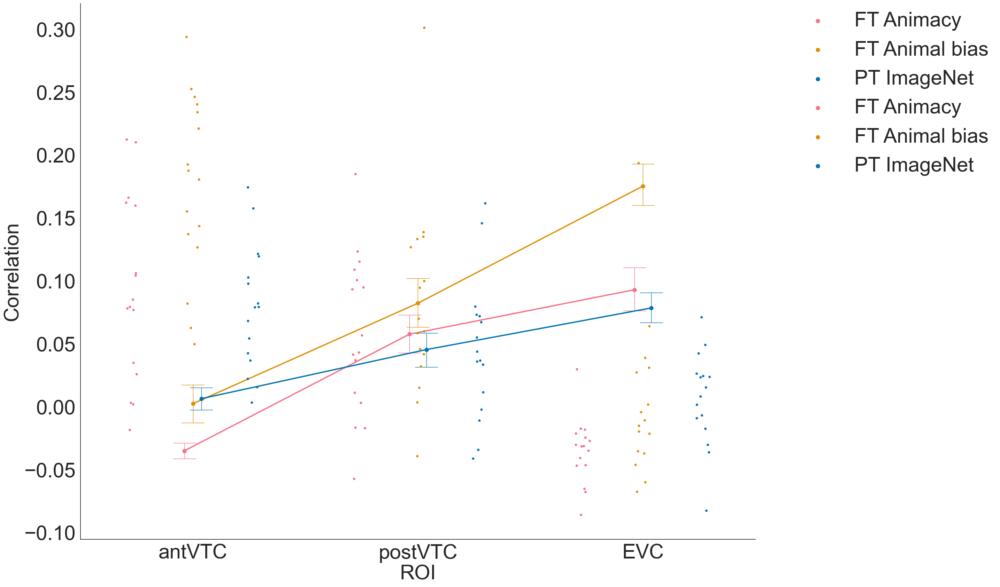

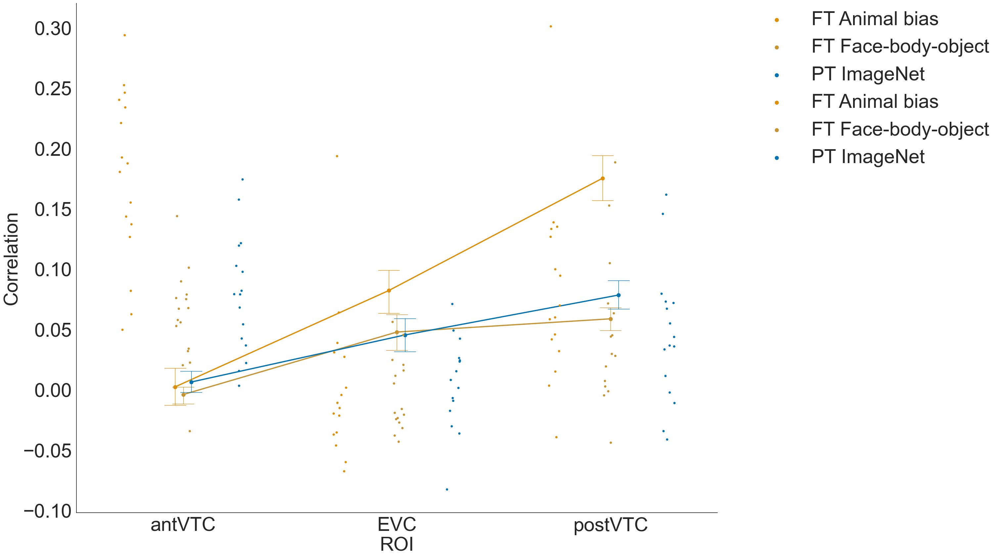

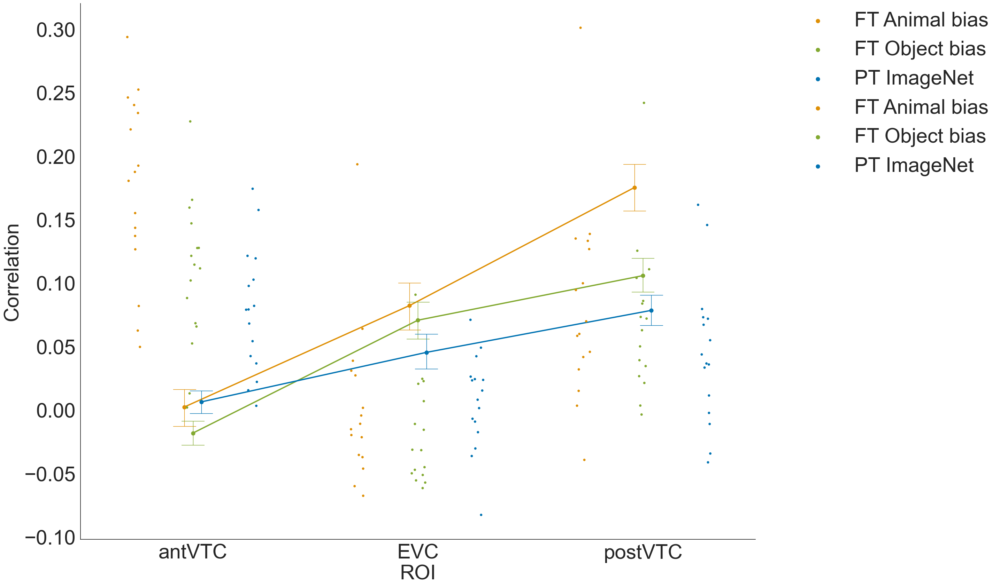

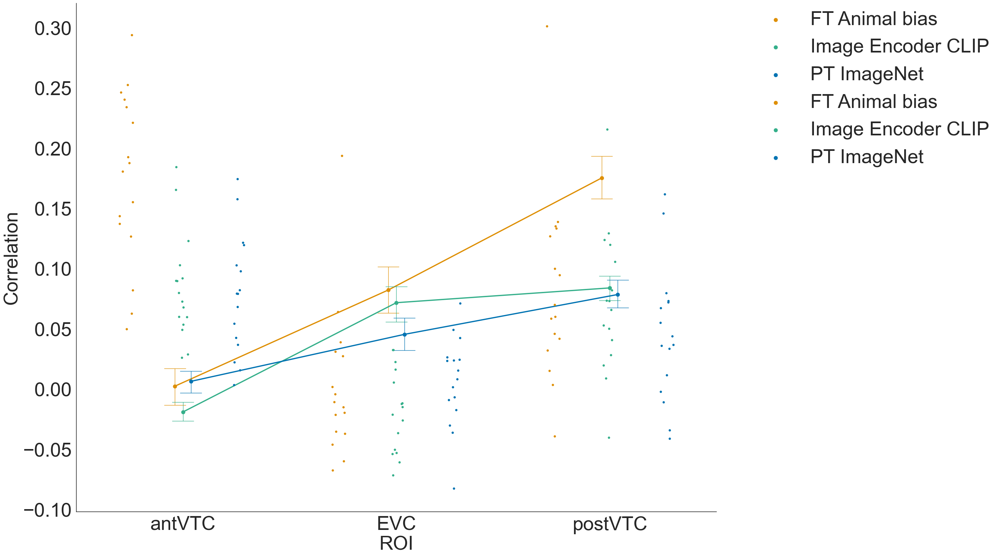

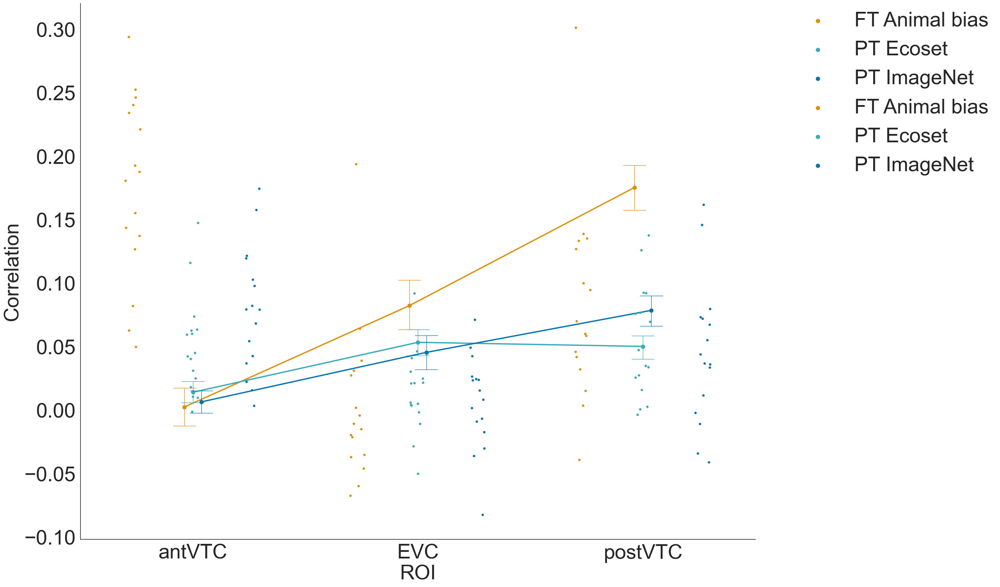

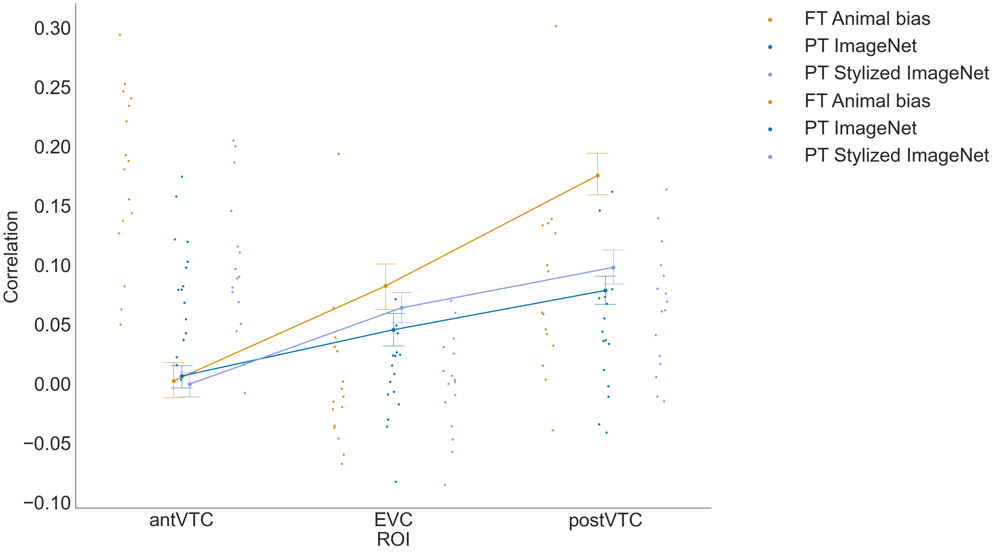

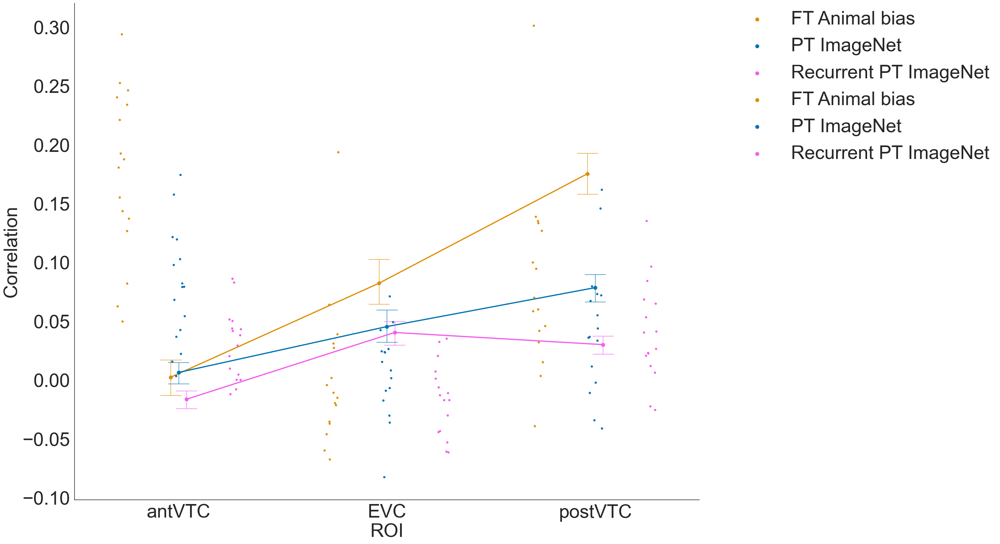

In [30]:
### MAKE GRAPHS

# tidy corr_neuraldata_df
df_tidy = corr_neuraldata_df.rename(columns = {'indiv_corrs': 'Correlation', 'condition': 'Network'}, inplace = False)
df_tidy['Network'] = df_tidy['Network'].str.replace('SIN','PT Stylized ImageNet')
df_tidy['Network'] = df_tidy['Network'].str.replace('CLIP','Image Encoder CLIP')
df_tidy['Network'] = df_tidy['Network'].str.replace('IN','PT ImageNet')
df_tidy['Network'] = df_tidy['Network'].str.replace('ECOSET','PT Ecoset')
df_tidy['Network'] = df_tidy['Network'].str.replace('animacynoll','FT Animacy')
df_tidy['Network'] = df_tidy['Network'].str.replace('animacy','FT Object bias')
df_tidy['Network'] = df_tidy['Network'].str.replace('appearance','FT Animal bias')
df_tidy['Network'] = df_tidy['Network'].str.replace('facebodyobject','FT Face-body-object') 
df_tidy['Network'] = df_tidy['Network'].str.replace('Recurrent','Recurrent PT ImageNet') 
df_tidy = df_tidy.sort_values(by=['Network'])
df_tidy        

# Levels 'PT ImageNet' and 'FT Animal bias' are always displayed with one other condition
base_conditions = ['PT ImageNet', 'FT Animal bias']

# Get unique conditions including base conditions
all_conditions = base_conditions + df_tidy['Network'].unique().tolist()

# Create a color palette with the same colors for base conditions
base_colors = sns.color_palette("colorblind", n_colors=len(base_conditions))
color_dict = {condition: base_colors[i] for i, condition in enumerate(base_conditions)}

# Create different colorsfor other conditions
other_conditions = [condition for condition in all_conditions if condition not in base_conditions]
other_colors = sns.color_palette("husl", n_colors=len(other_conditions))
color_dict.update({condition: color for condition, color in zip(other_conditions, other_colors)})


# Iterate through conditions and create plots and perform stats
for condition in df_tidy['Network'].unique():
    if condition not in base_conditions:
        # Filter the DataFrame to include the base conditions and the current condition
        filtered_df2 = df_tidy[df_tidy['Network'].isin(base_conditions + [condition])]
        #filtered_df2
                
        #Explode dataframe
        df_exploded = filtered_df2.explode('Correlation')
        #df_exploded.info() # indiv corr are object type!!!
        df_exploded[['Correlation']] = df_exploded[['Correlation']].astype(float)
            
        
        # Create a new figure and axis for the point plot
        plt.figure(figsize=(25, 20))
        ax = plt.gca()
        
        # Create a point plot with mean and standard error bars
        sns.pointplot(x='ROI', y='Correlation', hue='Network', data=df_exploded, ci=68, palette=color_dict, ax=ax, dodge=True,
                     capsize=.1, errwidth=1, order = ['EVC', 'postVTC', 'antVTC'])

        # Create a swarm plot to show individual data points
        #sns.swarmplot(x='ROI', y='Correlation', hue='Network', data=df_exploded, palette=color_dict, ax=ax, dodge=True)

        sns.stripplot(x='ROI', y='Correlation', hue='Network', data=df_exploded, palette=color_dict, ax=ax, dodge=True)

        plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0, frameon=False)
        sns.despine() #get rid of box
        fig = sns_plot.get_figure()
        #fig.savefig(os.path.join(PlotDir, modelofinterest, "NeuralStefania_corr_DNN_" + alt_hyp + "_" + lay + ".png"), bbox_inches='tight', dpi = 600)
        #plt.close(fig)
        

In [32]:
### Iterate through conditions and perform stats
'''
    STATISTICAL ANALYSES 
    dep var = correlations (for each subj)
    factor 1 = roi (evc, post vtc, ant vtc)
    factor 2 = training (animacy/object bias, appearance/animal bias)
'''

for condition in df_tidy['Network'].unique():
    if condition not in base_conditions:
        # Filter the DataFrame to include the base conditions and the current condition
        filtered_df2 = df_tidy[df_tidy['Network'].isin(base_conditions + [condition])]
        #filtered_df2
        
        # Based on dataframe with the networks of interest
        neuralcorrs = []
        for index, row in filtered_df2.iterrows():
            temp = row['Correlation']
            output = stats.ttest_1samp(temp, 0, alternative='greater') #one-sided one sample t-test

            temp_dict={}
            temp_dict['Network'] = row['Network']
            temp_dict['dnn_model'] = row['dnn_model']
            temp_dict['layer'] = row['layer']
            temp_dict['ROI'] = row['ROI']
            temp_dict['t'] = output[0].round(2)
            temp_dict['p'] = output[1].round(3)
            neuralcorrs.append(temp_dict)

            neuralcorrs_df = pd.DataFrame(neuralcorrs)
            #neuralcorrs_df.to_csv(os.path.join(StudyDir, 'Stats', modelofinterest, 'Neural_corrs_ttest_' + alt_hyp + "_" + lay + ".csv"), mode='a')

            print(neuralcorrs_df)
        
        
        # Now explode df for ANOVA:
        filtered_df2 = filtered_df2.reset_index()
        df_exploded = filtered_df2.apply(lambda x: x.explode() if x.name in ['Network','dnn_model', 'layer', 'ROI', 'Correlation', 'mean_corr', 'subject_ID'] else x)
        df_exploded.info() # indiv corr are object type!!!
        df_exploded[['Correlation']] = df_exploded[['Correlation']].astype(float)
        
        aov3 = pg.rm_anova(dv='Correlation',
                               within=['ROI', 'Network'],
                               subject='subject_ID', data=df_exploded)
        #aov3.to_csv(os.path.join(StudyDir, 'Stats', modelofinterest, 'Neural_RM_ANOVA_' + alt_hyp + "_" + lay + ".csv"), mode='w+')
        pg.print_table(aov3)

        posthocs = pg.pairwise_ttests(dv='Correlation', within=['ROI', 'Network'],
                                          subject='subject_ID', padjust='fdr_bh', data=df_exploded)
        pg.print_table(posthocs)
        #posthocs.to_csv(os.path.join(StudyDir, 'Stats', modelofinterest,'Neural_RM_ANOVA_' + alt_hyp + "_" + lay + ".csv"), mode='a')

        posthocs = pg.pairwise_ttests(dv='Correlation', within=[ 'Network', 'ROI'],
                                          subject='subject_ID', padjust='fdr_bh', data=df_exploded)
        #pg.print_table(posthocs)
        #posthocs.to_csv(os.path.join(StudyDir, 'Stats', modelofinterest, 'Neural_RM_ANOVA_' + alt_hyp + "_" + lay + ".csv"), mode='a')

     

      Network dnn_model layer     ROI     t    p
0  FT Animacy   alexnet   FC8  antVTC  5.08  0.0
      Network dnn_model layer      ROI     t      p
0  FT Animacy   alexnet   FC8   antVTC  5.08  0.000
1  FT Animacy   alexnet   FC8  postVTC  3.61  0.001
      Network dnn_model layer      ROI     t      p
0  FT Animacy   alexnet   FC8   antVTC  5.08  0.000
1  FT Animacy   alexnet   FC8  postVTC  3.61  0.001
2  FT Animacy   alexnet   FC8      EVC -5.40  1.000
          Network dnn_model layer      ROI     t      p
0      FT Animacy   alexnet   FC8   antVTC  5.08  0.000
1      FT Animacy   alexnet   FC8  postVTC  3.61  0.001
2      FT Animacy   alexnet   FC8      EVC -5.40  1.000
3  FT Animal bias   alexnet   FC8   antVTC  9.74  0.000
          Network dnn_model layer      ROI     t      p
0      FT Animacy   alexnet   FC8   antVTC  5.08  0.000
1      FT Animacy   alexnet   FC8  postVTC  3.61  0.001
2      FT Animacy   alexnet   FC8      EVC -5.40  1.000
3  FT Animal bias   alexnet   FC8 

/opt/anaconda3/lib/python3.9/site-packages/pingouin/distribution.py:485: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "
/opt/anaconda3/lib/python3.9/site-packages/pingouin/distribution.py:485: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "



POST HOC TESTS

Contrast       ROI      A                    B                    Paired    Parametric          T     dof  alternative      p-unc    p-corr  p-adjust           BF10    hedges
-------------  -------  -------------------  -------------------  --------  ------------  -------  ------  -------------  -------  --------  ----------  -----------  --------
ROI            -        EVC                  antVTC               True      True          -11.252  15.000  two-sided        0.000     0.000  fdr_bh      1145000.000    -2.852
ROI            -        EVC                  postVTC              True      True           -4.589  15.000  two-sided        0.000     0.001  fdr_bh           94.009    -1.252
ROI            -        antVTC               postVTC              True      True            2.811  15.000  two-sided        0.013     0.013  fdr_bh            4.361     0.882
Network        -        FT Animal bias       FT Face-body-object  True      True            4.976  15.000  t

/opt/anaconda3/lib/python3.9/site-packages/pingouin/distribution.py:485: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "
/opt/anaconda3/lib/python3.9/site-packages/pingouin/distribution.py:485: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "



ANOVA SUMMARY

Source            SS    ddof1    ddof2     MS       F    p-unc    p-GG-corr    np2    eps
-------------  -----  -------  -------  -----  ------  -------  -----------  -----  -----
ROI            0.327        2       30  0.164  45.708    0.000        0.000  0.753  0.921
Network        0.057        2       30  0.029   9.407    0.001        0.001  0.385  0.914
ROI * Network  0.055        4       60  0.014   8.459    0.000        0.001  0.361  0.551


POST HOC TESTS

Contrast       ROI      A                   B                   Paired    Parametric          T     dof  alternative      p-unc    p-corr  p-adjust           BF10    hedges
-------------  -------  ------------------  ------------------  --------  ------------  -------  ------  -------------  -------  --------  ----------  -----------  --------
ROI            -        EVC                 antVTC              True      True          -11.161  15.000  two-sided        0.000     0.000  fdr_bh      1036000.000    -3.3

/opt/anaconda3/lib/python3.9/site-packages/pingouin/distribution.py:485: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "
/opt/anaconda3/lib/python3.9/site-packages/pingouin/distribution.py:485: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "



POST HOC TESTS

Contrast       ROI      A               B            Paired    Parametric          T     dof  alternative      p-unc    p-corr  p-adjust          BF10    hedges
-------------  -------  --------------  -----------  --------  ------------  -------  ------  -------------  -------  --------  ----------  ----------  --------
ROI            -        EVC             antVTC       True      True          -10.335  15.000  two-sided        0.000     0.000  fdr_bh      403000.000    -2.654
ROI            -        EVC             postVTC      True      True           -4.797  15.000  two-sided        0.000     0.000  fdr_bh         134.366    -1.265
ROI            -        antVTC          postVTC      True      True            2.868  15.000  two-sided        0.012     0.012  fdr_bh           4.799     0.827
Network        -        FT Animal bias  PT Ecoset    True      True            3.693  15.000  two-sided        0.002     0.006  fdr_bh          19.716     1.100
Network        - 

/opt/anaconda3/lib/python3.9/site-packages/pingouin/distribution.py:485: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn("Epsilon values might be innaccurate in "
